In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:85% !important; }</style>"))

C:\Users\pulzara\AppData\Local\Temp\ipykernel_18264\495279268.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
import numpy as np
import pandas as pd
import random
import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.express as px
import datetime
from datetime import datetime
from sklearn.metrics import mean_squared_error
from math import sqrt
import statsmodels
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from fbprophet import Prophet
from sklearn.metrics import mean_squared_error
from math import sqrt
import math 
import random

import warnings
warnings.filterwarnings("ignore")

import logging
logging.getLogger('fbprophet').setLevel(logging.WARNING)


import gc

In [3]:
alcazares = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/alcazares.txt',delimiter = '|') 
aranjuez = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/aranjuez.txt',delimiter = '|') 
bosques_del_norte = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/bosques_del_norte.txt',delimiter = '|') 
chec_uribe = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/chec_uribe.txt',delimiter = '|') 
el_carmen = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/el_carmen.txt',delimiter = '|') 
emas = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/emas.txt',delimiter = '|') 
hospital_caldas = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/hospital_caldas.txt',delimiter = '|')
la_nubia = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/la_nubia.txt',delimiter = '|') 
la_palma = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/la_palma.txt',delimiter = '|') 
milan = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/milan.txt',delimiter = '|') 
obs_vulcanologico = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/obs_vulcanologico.txt',delimiter = '|') 
palogrande = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/palogrande.txt',delimiter = '|')
posgrados = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/posgrados.txt',delimiter = '|') 
yarumos = pd.read_table('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/yarumos.txt',delimiter = '|') 

In [4]:
def renombrar(df): 
    df = df.rename(columns={'Temperatura(ºC)':'Temperatura', 'Velocidad(m/s)': 'Velocidad', 'Direccion(º)':'Direccion',
       'Presion(mmHg)':'Presion', 'Humedad(%)':'Humedad', 'Precipitacion(mm)':'Precipitacion', 'Radiacion(W/m^2)':'Radiacion',
       'Evapotranspiracion(mm)':'Evapotranspiracion', 'Evapo_real(mm)':'Evapo_real'})
    return df 

In [5]:
alcazares = renombrar(alcazares)
aranjuez = renombrar(aranjuez)
bosques_del_norte = renombrar(bosques_del_norte)
chec_uribe = renombrar(chec_uribe)
el_carmen = renombrar(el_carmen)
emas = renombrar(emas)
hospital_caldas = renombrar(hospital_caldas)
la_nubia = renombrar(la_nubia)
la_palma = renombrar(la_palma)
milan = renombrar(milan)
obs_vulcanologico = renombrar(obs_vulcanologico)
palogrande = renombrar(palogrande)
posgrados = renombrar(posgrados)
yarumos = renombrar(yarumos)

In [6]:
la_nubia.Precipitacion_Real = la_nubia.Precipitacion_Real.replace('aquí', 0)
posgrados.Precipitacion_Real = posgrados.Precipitacion_Real.replace(' Precipita', 0)
aranjuez = aranjuez.replace(".", np.nan)  
el_carmen = el_carmen.replace(".", np.nan)  
posgrados= posgrados.replace(".", np.nan)   

In [7]:
def fecha(df):
    
    '''
    Funcion que pasa la fecha a formato datetime y las variables al formato necesario
    '''
    df["Fecha"] = pd.to_datetime(df["Fecha"])  
    #df["Hora"] =  pd.to_datetime(df["Hora"]).dt.time  
    #df["Direccion"] = df["Direccion"].fillna(-91)
    #df["Direccion"] = df["Direccion"].astype(int)
    #df["Humedad"] = df["Humedad"].fillna(-91)
    #df["Humedad"] = df["Humedad"].astype(int)
    #df["Radiacion"] = df["Radiacion"].fillna(-91)
    #df["Radiacion"] = df["Radiacion"].astype(int) 
    df["Precipitacion"] = df["Precipitacion"].astype(float)
    df["Precipitacion_Real"] = df["Precipitacion_Real"].astype(float)
    df["Temperatura"] =  df["Temperatura"].astype(float)
    df["Velocidad"] =  df["Velocidad"].astype(float)
    df["Presion"] =  df["Presion"].astype(float)
    df["Humedad"] =  df["Humedad"].astype(float)
    
    return df 

In [8]:
alcazares = fecha(alcazares) 
aranjuez = fecha(aranjuez)
bosques_del_norte = fecha(bosques_del_norte)
chec_uribe = fecha(chec_uribe)
el_carmen = fecha(el_carmen)
emas = fecha(emas)
hospital_caldas = fecha(hospital_caldas)
la_nubia = fecha(la_nubia)
la_palma = fecha(la_palma)
milan = fecha(milan)
obs_vulcanologico = fecha(obs_vulcanologico)
palogrande = fecha(palogrande)
posgrados = fecha(posgrados)
yarumos = fecha(yarumos)

In [9]:
def  ordenar(df):
    '''
    Funcion ordena el dataset por Fecha de manera ascendente
    '''
    df = df.sort_values(by="Fecha", ascending=True)  
    df.reset_index(inplace=True, drop=True) 
    return df

In [10]:
alcazares = ordenar(alcazares) 
aranjuez = ordenar(aranjuez)
bosques_del_norte = ordenar(bosques_del_norte)
chec_uribe = ordenar(chec_uribe)
el_carmen = ordenar(el_carmen)
emas = ordenar(emas)
hospital_caldas = ordenar(hospital_caldas)
la_nubia = ordenar(la_nubia)
la_palma = ordenar(la_palma)
milan = ordenar(milan)
obs_vulcanologico = ordenar(obs_vulcanologico)
palogrande = ordenar(palogrande)
posgrados = ordenar(posgrados)
yarumos = ordenar(yarumos)

In [11]:
def new_colum_str(df,value):
    """
    Esta funcion crea dos variables nuevas: nombre de la estacion metereologica, el año y el mes asignado a la fecha.
    """
    df["Estacion"] = value
    return df 
    

In [12]:
alcazares = new_colum_str(alcazares, "alcazares")   
aranjuez = new_colum_str(aranjuez, "aranjuez")   
bosques_del_norte = new_colum_str(bosques_del_norte, "bosques_del_norte")   
chec_uribe = new_colum_str(chec_uribe, "chec_uribe")   
el_carmen = new_colum_str(el_carmen, "el_carmen")   
emas = new_colum_str(emas, "emas")   
hospital_caldas = new_colum_str(hospital_caldas, "hospital_caldas")   
la_nubia = new_colum_str(la_nubia, "la_nubia")   
la_palma = new_colum_str(la_palma, "la_palma")   
milan = new_colum_str(milan, "milan")   
obs_vulcanologico = new_colum_str(obs_vulcanologico, "obs_vulcanologico")   
palogrande = new_colum_str(palogrande, "palogrande")  
posgrados = new_colum_str(posgrados, "posgrados")
yarumos = new_colum_str(yarumos, "yarumos")   

## Precipitacion

In [13]:
datasets = [alcazares, aranjuez, bosques_del_norte, chec_uribe, el_carmen,emas,hospital_caldas, la_nubia,la_palma, milan, obs_vulcanologico, palogrande,posgrados,yarumos]

alcazares


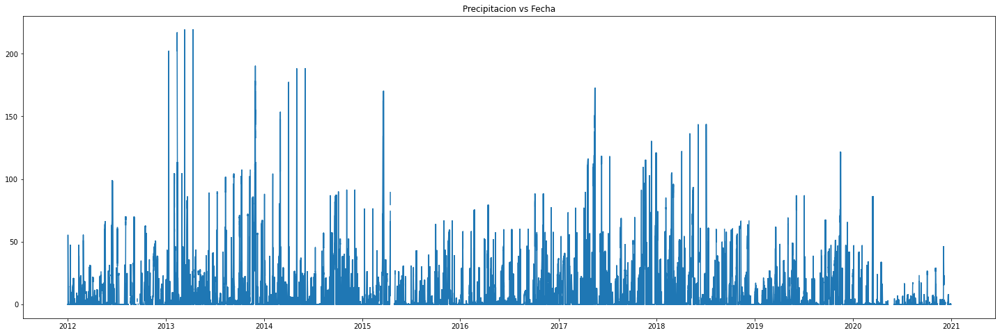

aranjuez


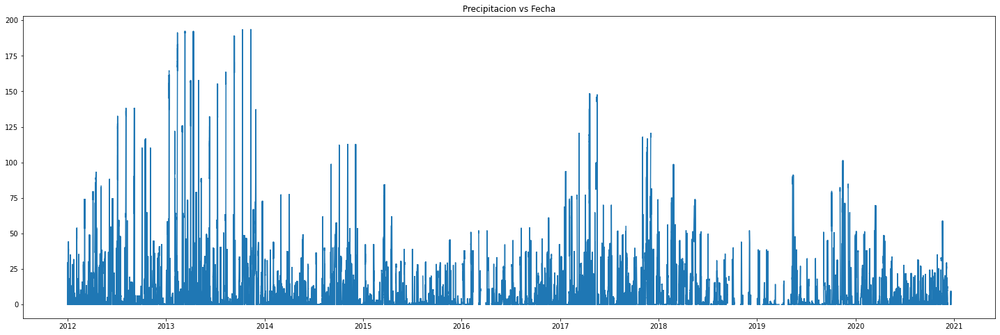

bosques_del_norte


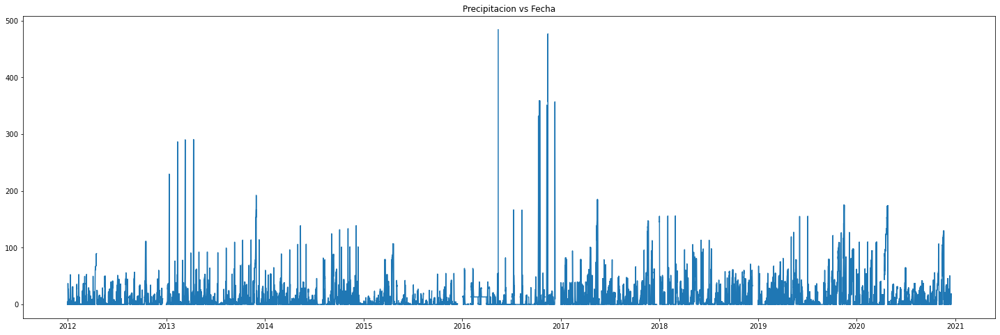

chec_uribe


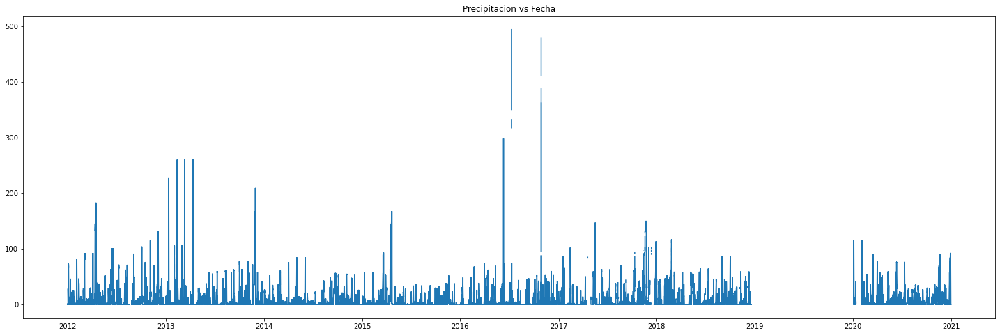

el_carmen


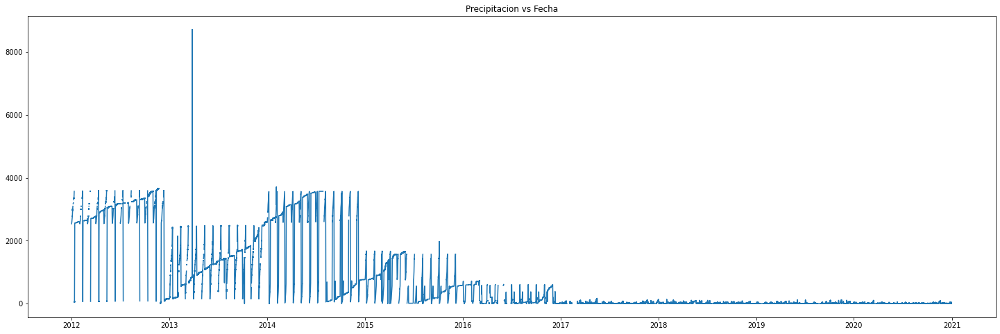

emas


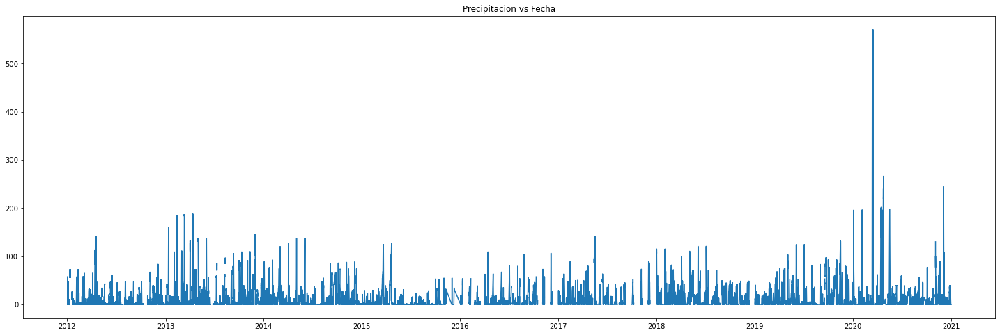

hospital_caldas


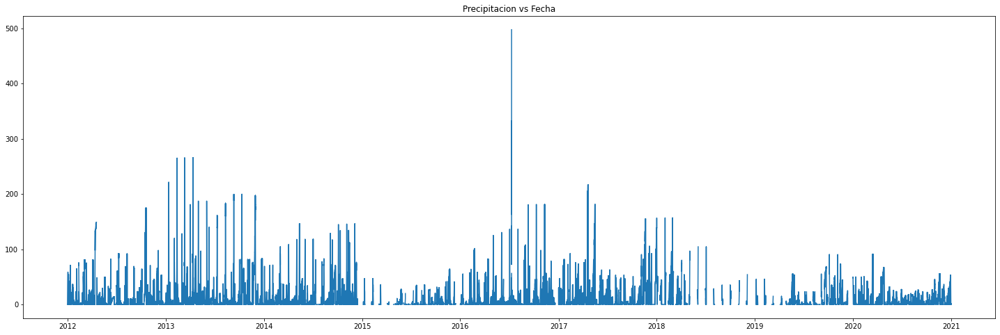

la_nubia


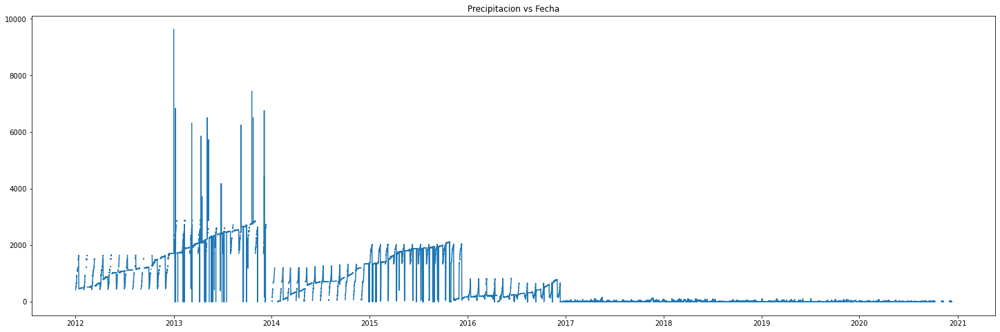

la_palma


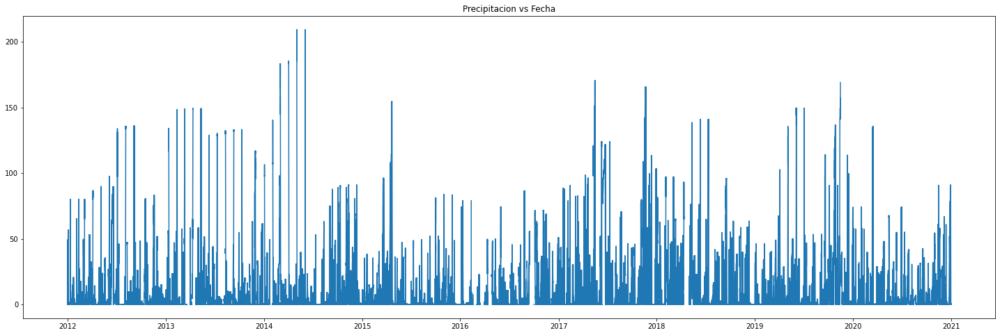

milan


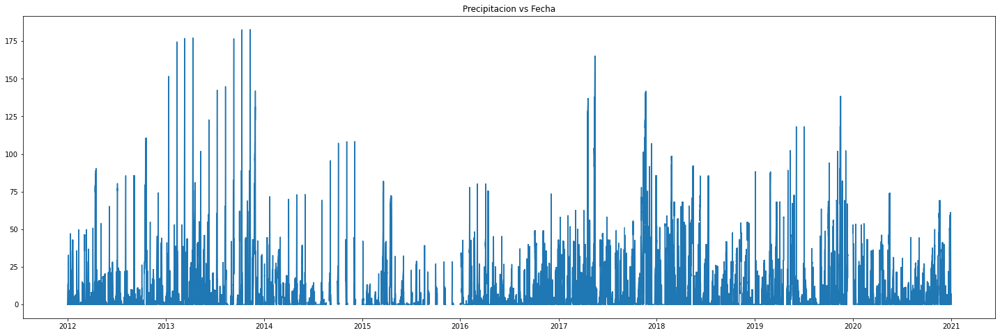

obs_vulcanologico


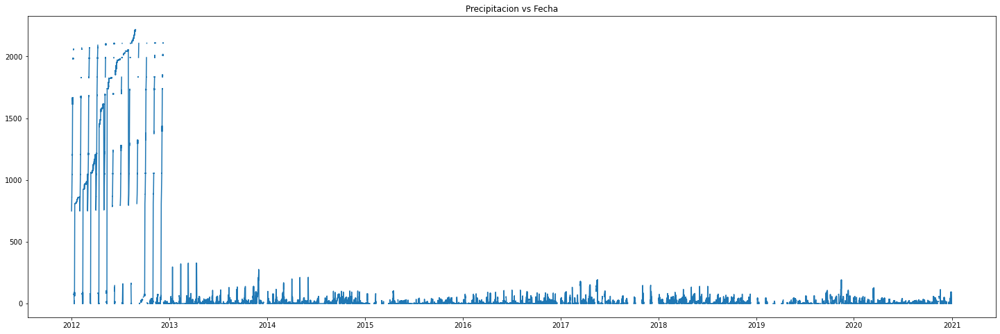

palogrande


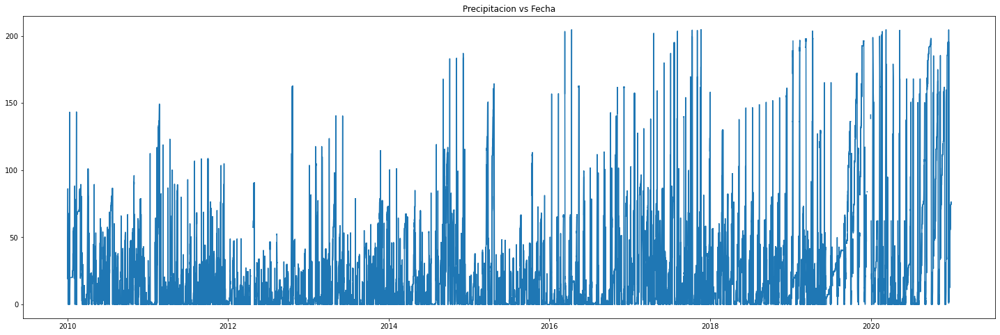

posgrados


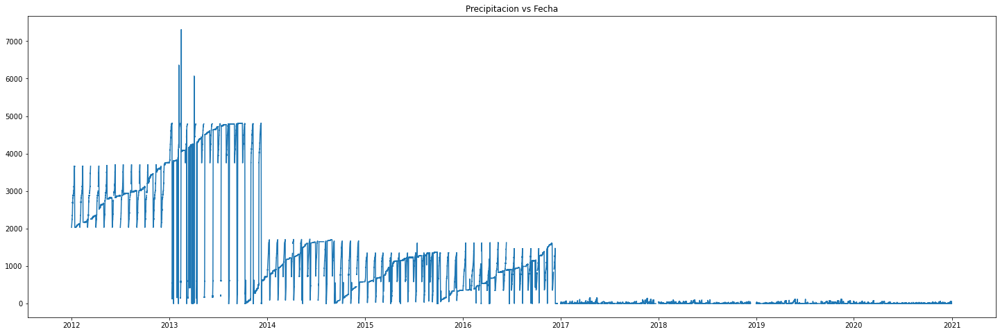

yarumos


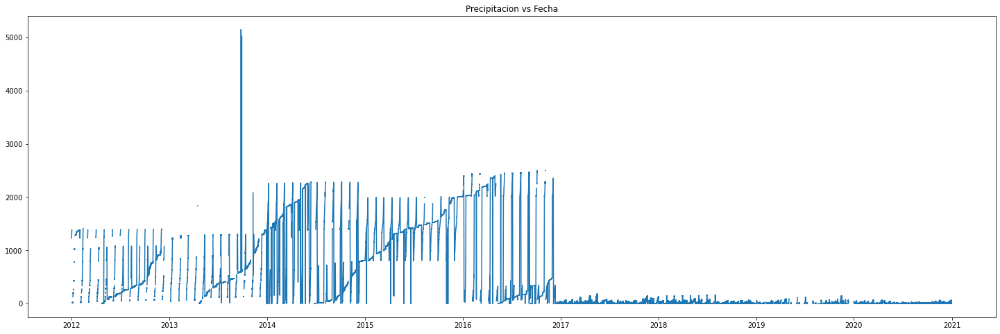

In [18]:
for i in datasets:   
    
    plt.figure(figsize=(25,8))
    print(i.Estacion[0])
    plt.plot(i.Fecha, i["Precipitacion"])
    plt.title("Precipitacion vs Fecha") 
    plt.show()

Estacion alcazares


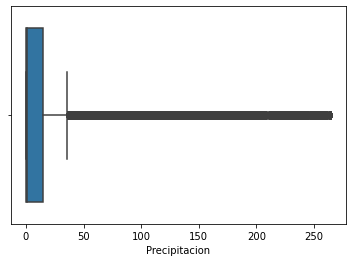

Estacion aranjuez


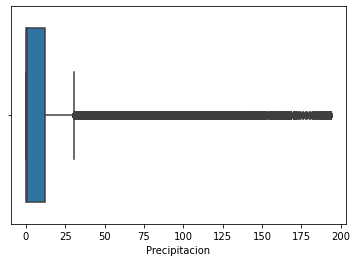

Estacion bosques_del_norte


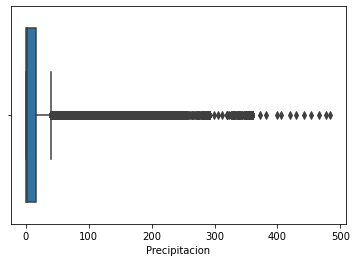

Estacion chec_uribe


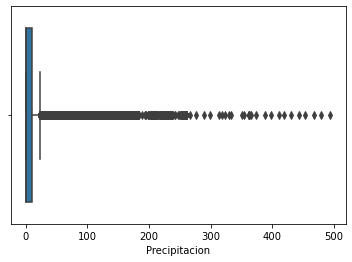

Estacion el_carmen


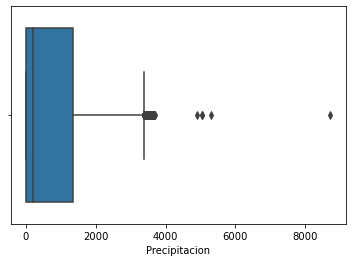

Estacion emas


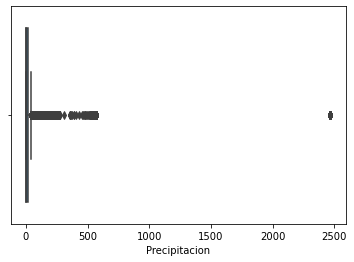

Estacion hospital_caldas


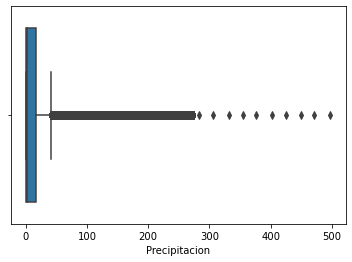

Estacion la_nubia


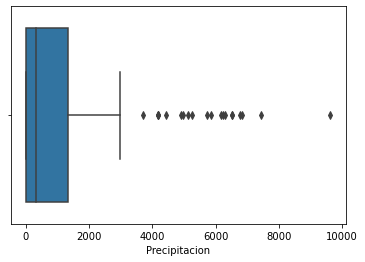

Estacion la_palma


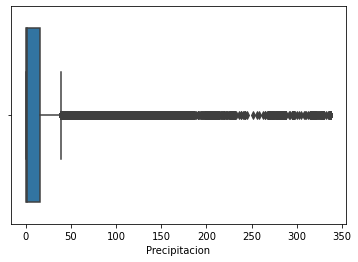

Estacion milan


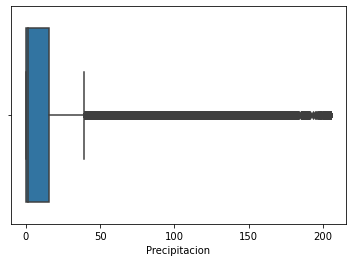

Estacion obs_vulcanologico


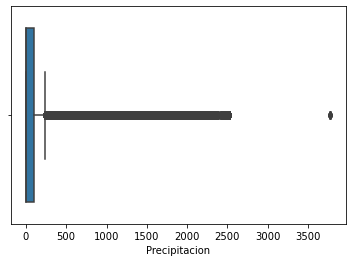

Estacion palogrande


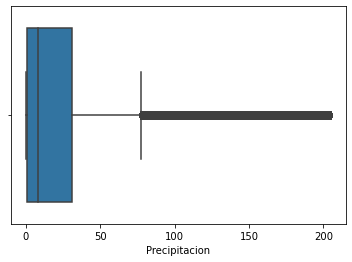

Estacion posgrados


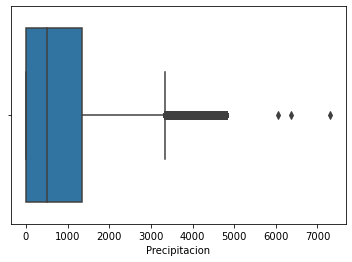

Estacion yarumos


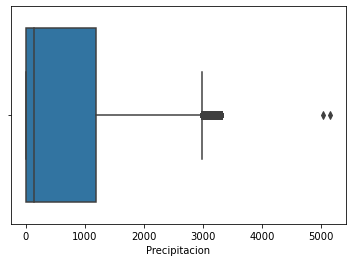

In [28]:
for i in datasets:
    print("Estacion", i.Estacion[0])
    sns.boxplot(x ='Precipitacion', data = i)
    plt.show() 
    

In [14]:
for i in datasets:
    print(i.Estacion[0])  
    print(i.Precipitacion.isnull().sum(), "\n")    

alcazares
235133 

aranjuez
307261 

bosques_del_norte
251952 

chec_uribe
229160 

el_carmen
276756 

emas
323304 

hospital_caldas
381363 

la_nubia
322946 

la_palma
297193 

milan
311219 

obs_vulcanologico
346841 

palogrande
21056 

posgrados
234012 

yarumos
330561 



In [14]:
def separar(df,fecha):
    df = df.loc[df.Fecha >= fecha]
    df.reset_index(inplace = True, drop = True)
    return df 
    

In [15]:
alcazares = separar(alcazares,"2017-01-01")
aranjuez =  separar(aranjuez,"2017-01-01")
bosques_del_norte = separar(bosques_del_norte,"2017-01-01")
chec_uribe = separar(chec_uribe,"2017-01-01")
el_carmen = separar(el_carmen,"2017-01-01")   
emas = separar(emas,"2017-01-01")
hospital_caldas = separar(hospital_caldas,"2017-01-01")
la_nubia = separar(la_nubia,"2017-01-01")  
la_palma = separar(la_palma,"2017-01-01") 
milan = separar(milan,"2017-01-01")
obs_vulcanologico =separar(obs_vulcanologico,"2017-01-01")
palogrande =  separar(palogrande,"2017-01-01")
posgrados =separar(posgrados,"2017-01-01")
yarumos =   separar(yarumos,"2017-01-01") 

In [16]:
datasets = [alcazares, aranjuez, bosques_del_norte, chec_uribe, el_carmen,emas,hospital_caldas, la_nubia,la_palma, milan, obs_vulcanologico, palogrande,posgrados,yarumos]

alcazares


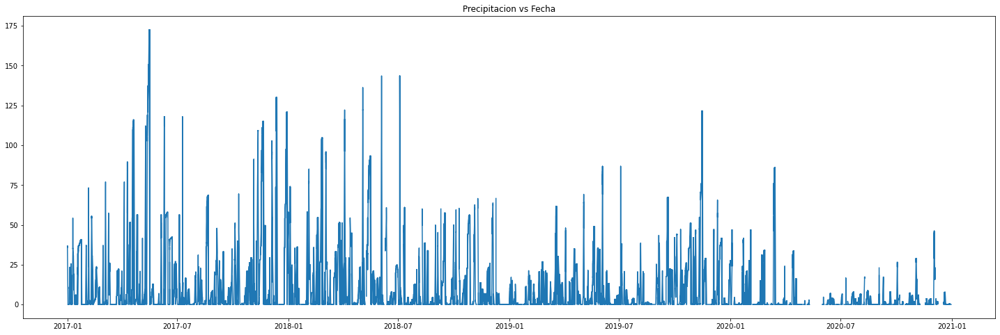

aranjuez


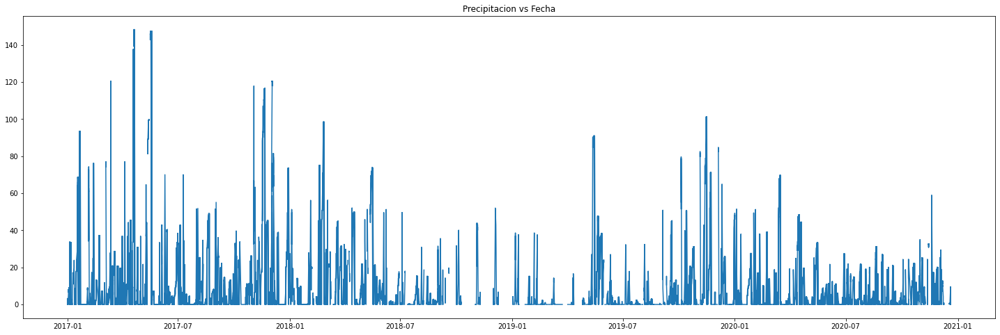

bosques_del_norte


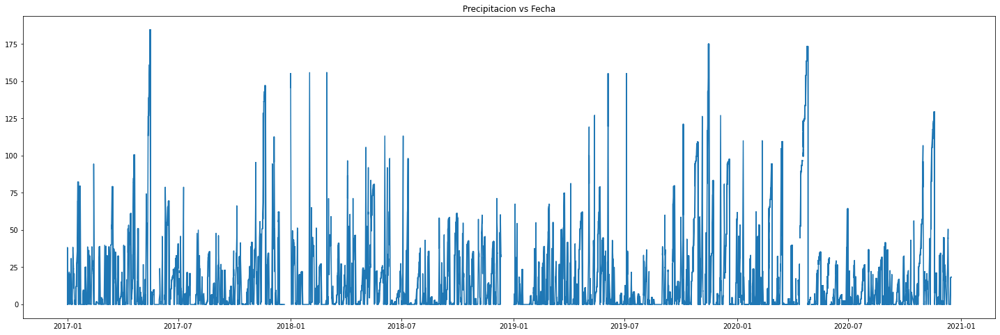

chec_uribe


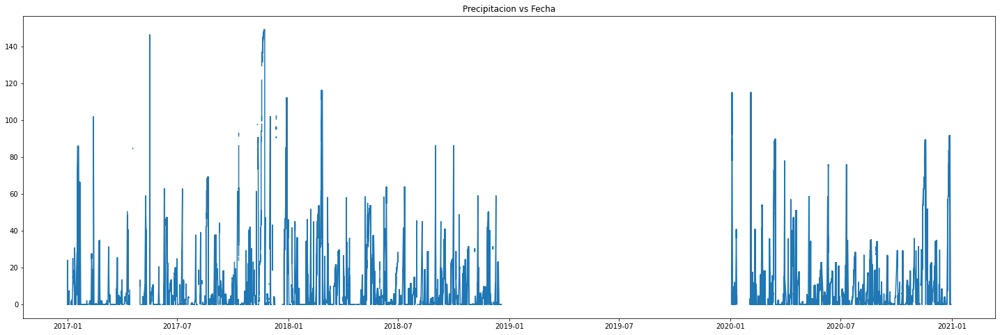

el_carmen


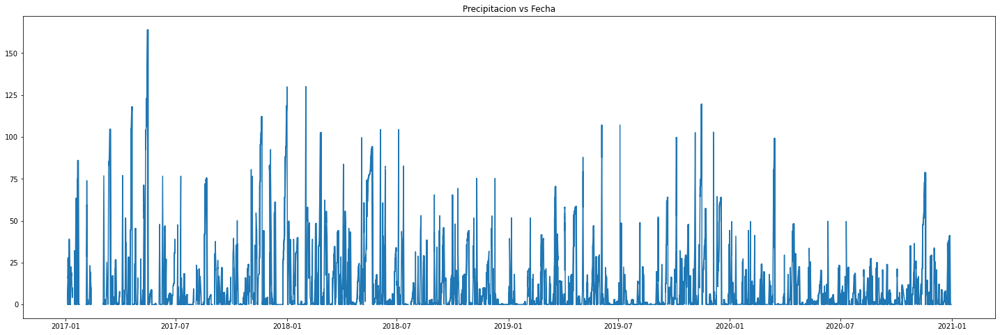

emas


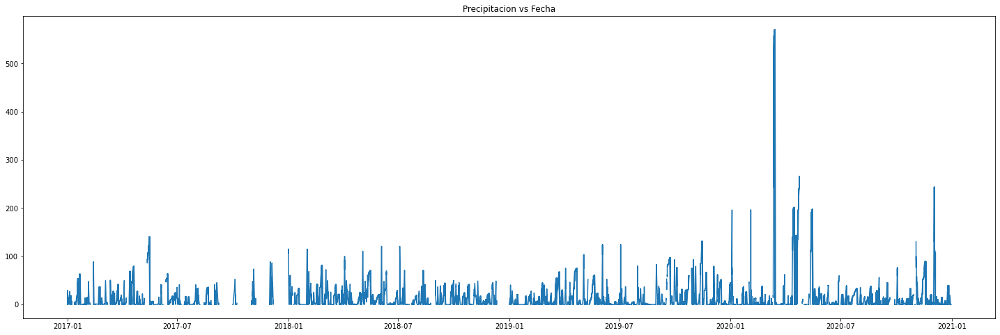

hospital_caldas


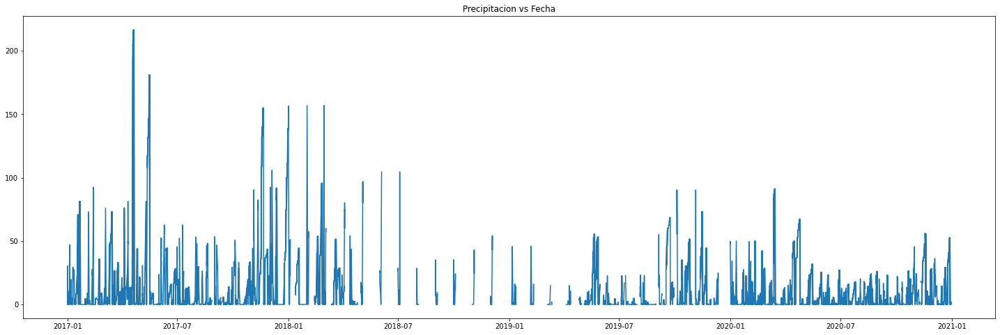

la_nubia


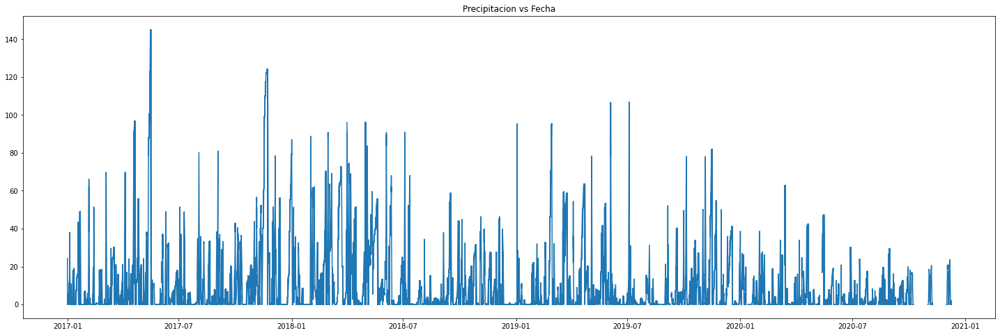

la_palma


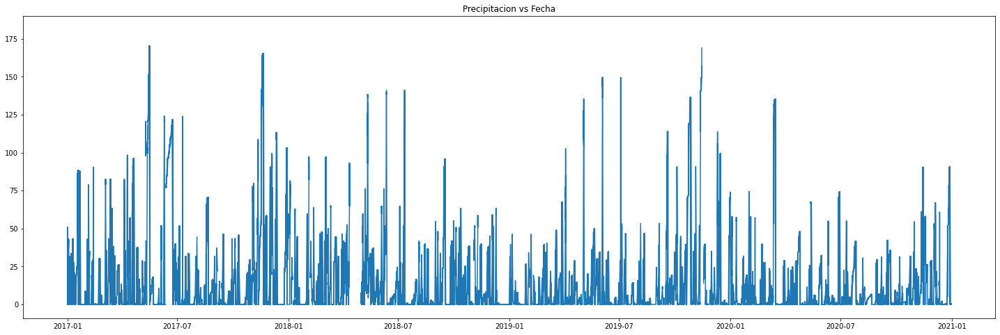

milan


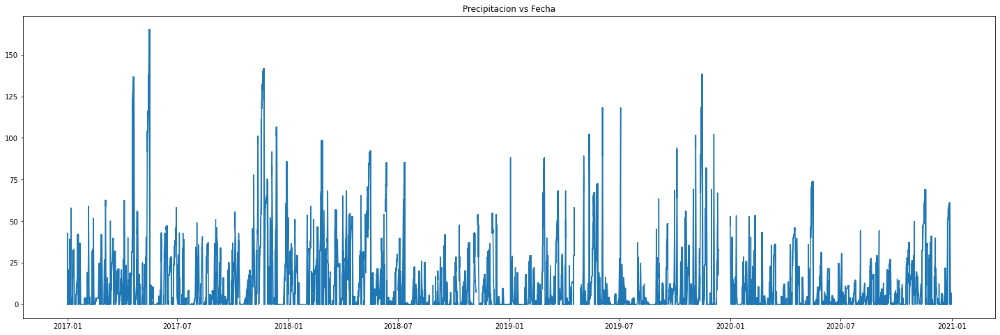

obs_vulcanologico


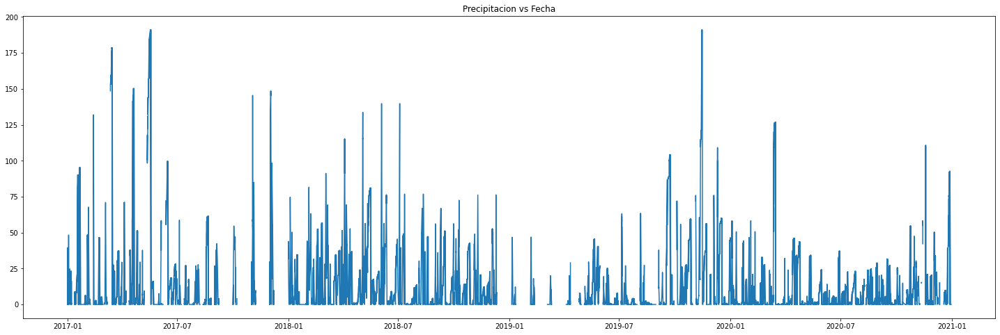

palogrande


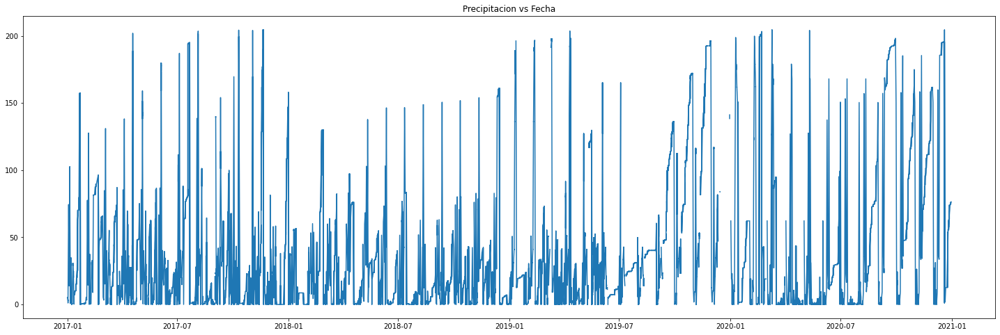

posgrados


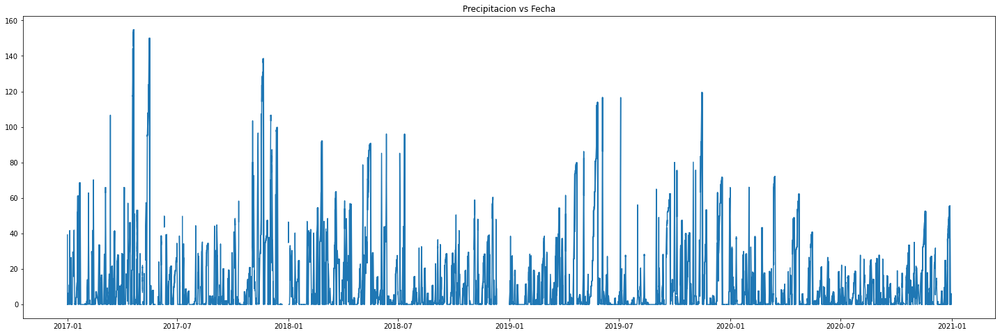

yarumos


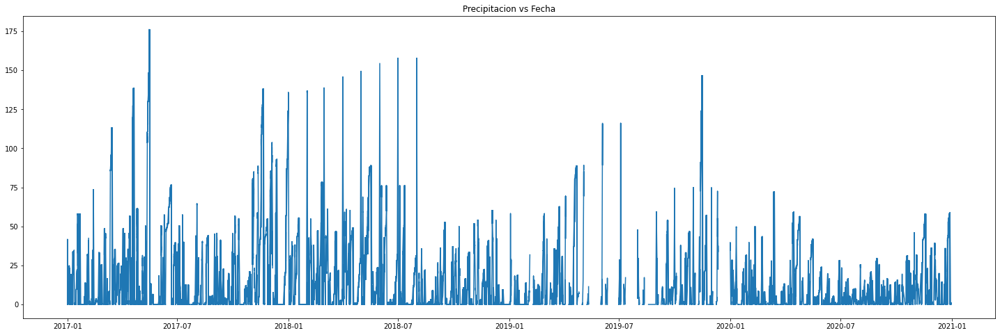

In [17]:
for i in datasets:   
    
    plt.figure(figsize=(25,8))
    print(i.Estacion[0])
    plt.plot(i.Fecha, i["Precipitacion"])
    plt.title("Precipitacion vs Fecha") 
    plt.show()

**Redondeamos los nuevos valores a solo 1 decimales.**

In [18]:
for i in datasets: 
    i["Precipitacion"] = round(i["Precipitacion"], 1)

In [21]:
for i in datasets:
    print(i.Estacion[0])  
    print(i.Precipitacion.isnull().sum(), "\n")    

alcazares
25732 

aranjuez
64552 

bosques_del_norte
17294 

chec_uribe
141241 

el_carmen
18098 

emas
60420 

hospital_caldas
116902 

la_nubia
30217 

la_palma
18669 

milan
20662 

obs_vulcanologico
81769 

palogrande
13717 

posgrados
15197 

yarumos
43292 



In [19]:
emas["Precipitacion"] = np.where((emas.Precipitacion >300 ), 200, emas["Precipitacion"]) 

14.236770428568912

In [ ]:
i["Precipitacion"] = np.where((i.Precipitacion < n), promedio, i["Precipitacion"])

## Velocidad

alcazares


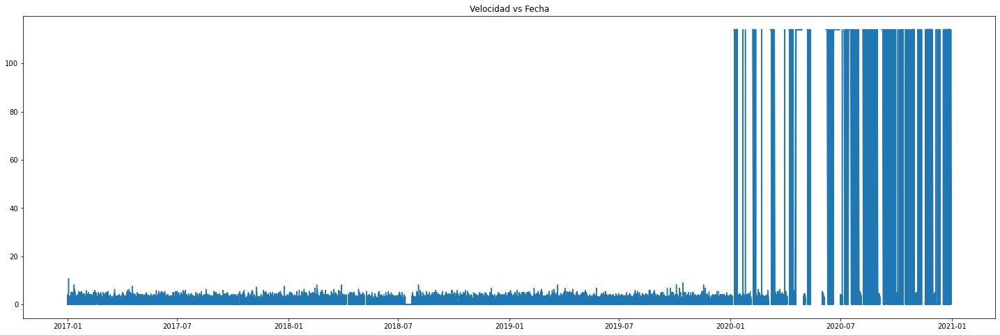

aranjuez


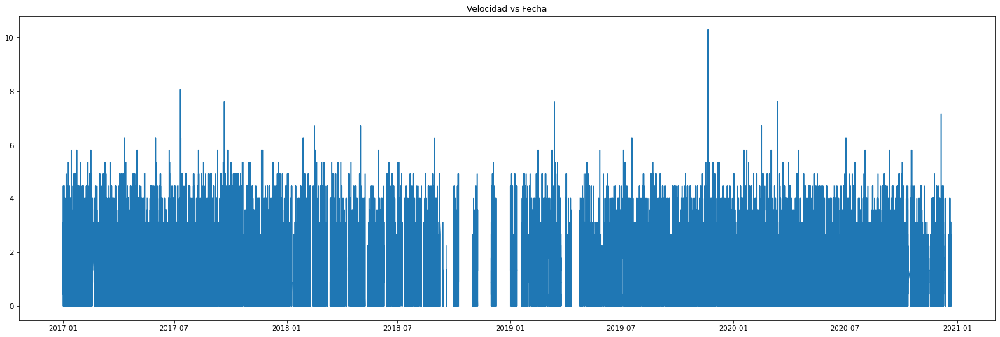

bosques_del_norte


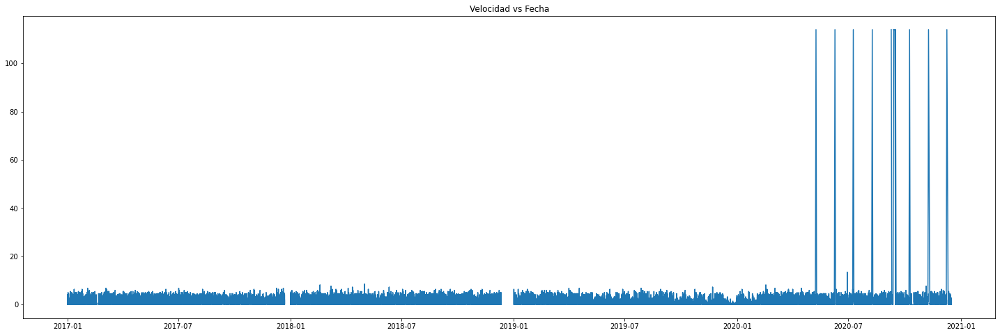

chec_uribe


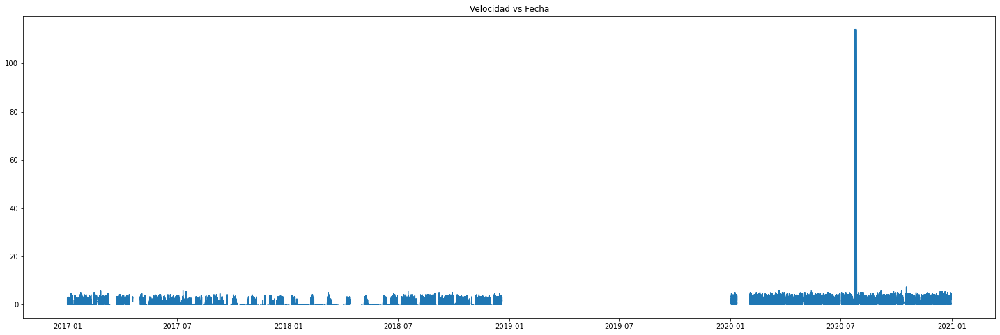

el_carmen


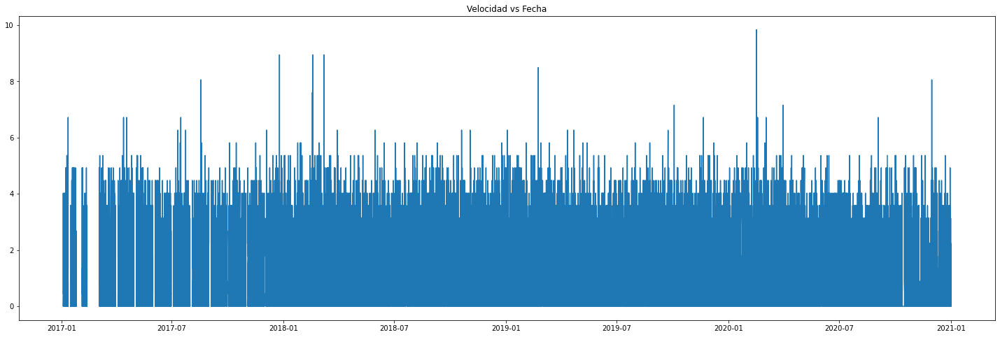

emas


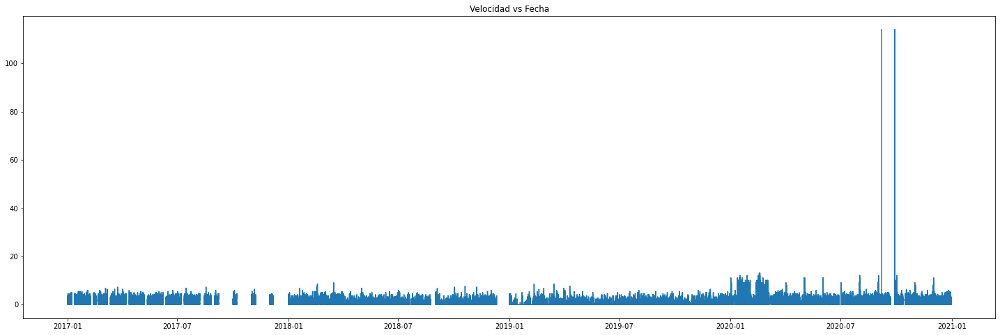

hospital_caldas


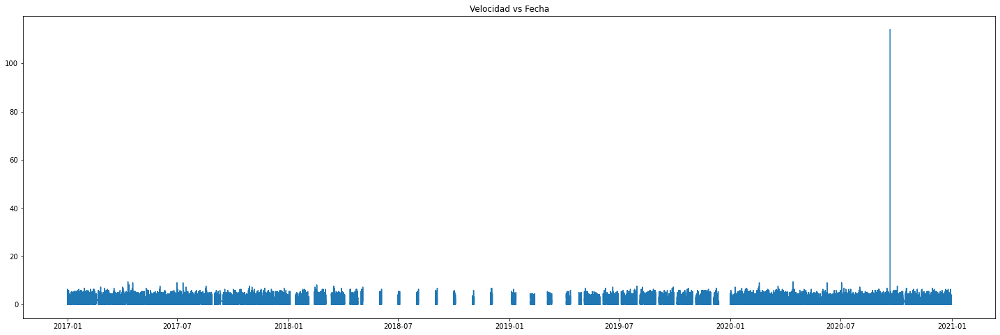

la_nubia


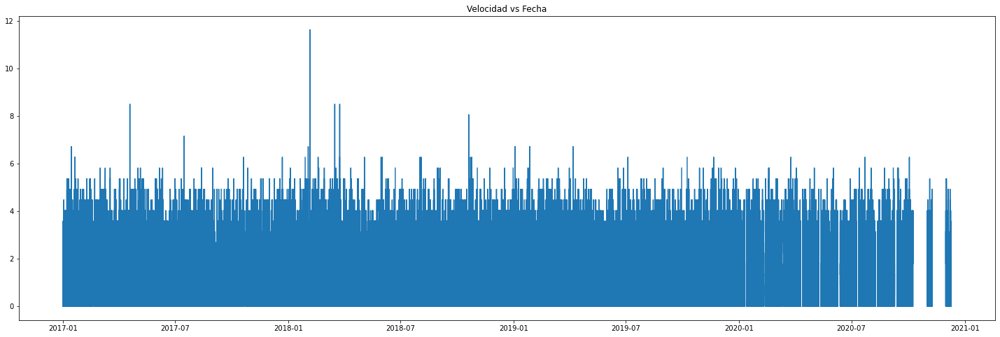

la_palma


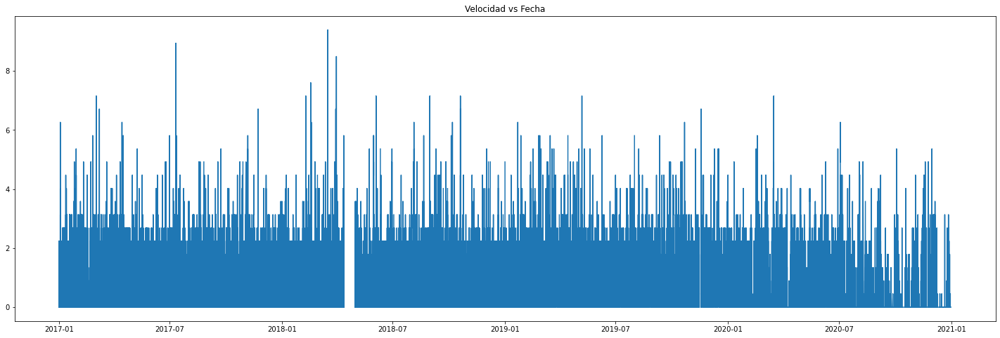

milan


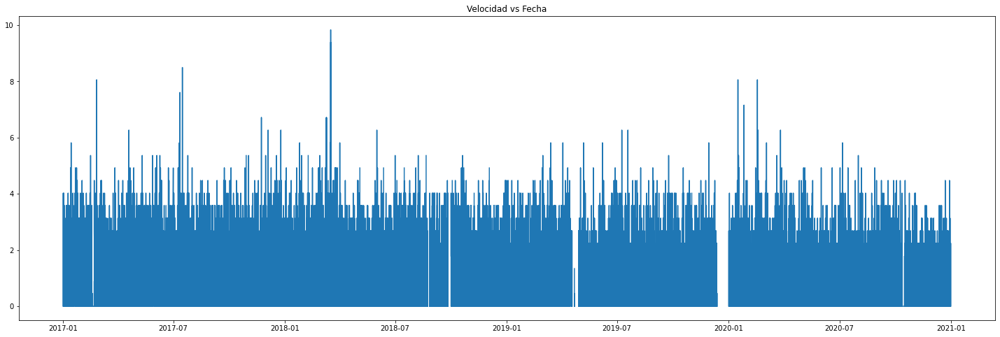

obs_vulcanologico


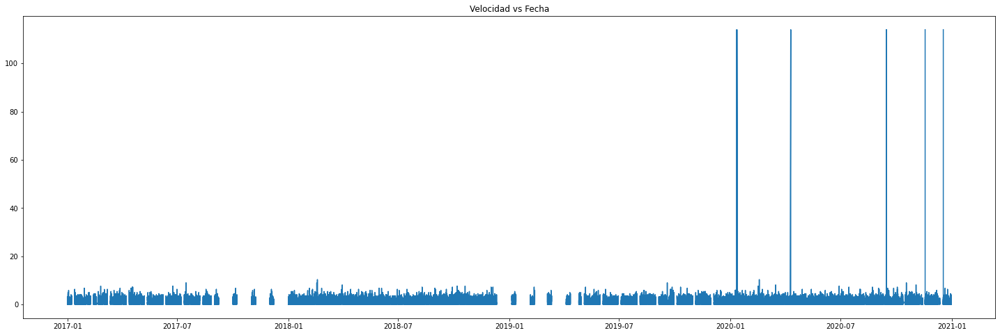

palogrande


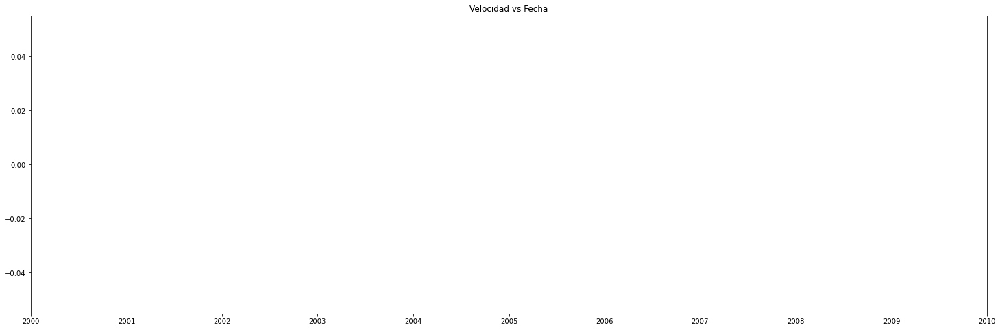

posgrados


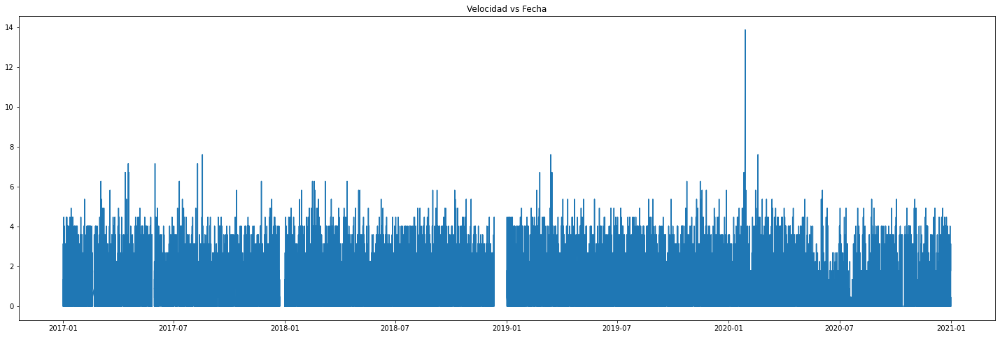

yarumos


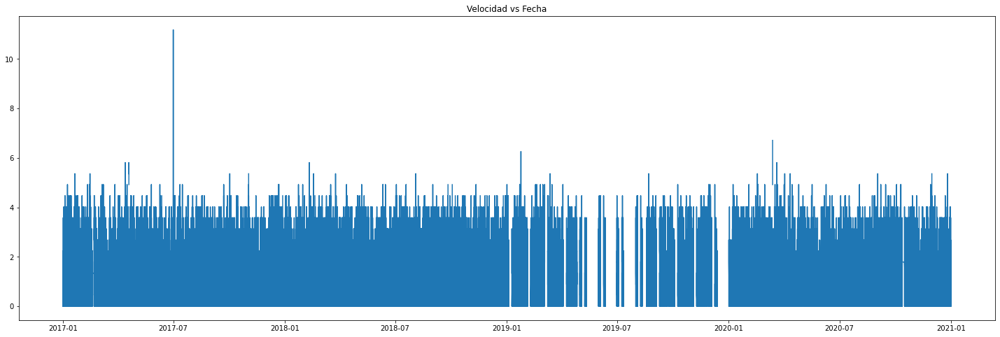

In [22]:
for i in datasets:   
    
    plt.figure(figsize=(25,8))
    print(i.Estacion[0])
    plt.plot(i.Fecha, i["Velocidad"])
    plt.title("Velocidad vs Fecha") 
    plt.show()

In [23]:
for i in datasets:
    print( "\n",i.Estacion[0])  
    print(i.Velocidad.min())   


 alcazares
0.0

 aranjuez
0.0

 bosques_del_norte
0.0

 chec_uribe
0.0

 el_carmen
0.0

 emas
0.0

 hospital_caldas
0.0

 la_nubia
0.0

 la_palma
0.0

 milan
0.0

 obs_vulcanologico
0.0

 palogrande
nan

 posgrados
0.0

 yarumos
0.0


In [24]:
#for i in datasets:
#    i.drop(i.loc[i.Velocidad < 0].index, inplace = True) 
#    i.reset_index(inplace = True, drop=True) 

In [19]:
n = 0
for i in datasets:
    promedio = i[(i.Velocidad >= 0) & (i.Velocidad < 32.6)].Velocidad.mean() 
    i["Velocidad"] = np.where((i.Velocidad < n), promedio, i["Velocidad"])

Estacion alcazares


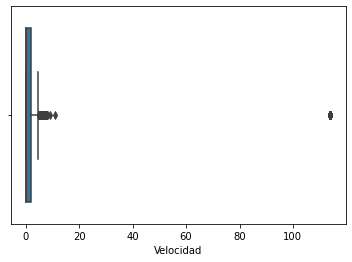

Estacion aranjuez


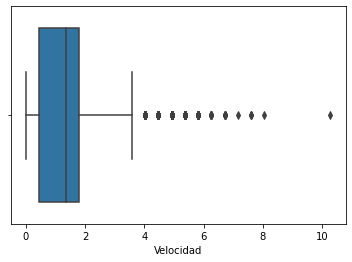

Estacion bosques_del_norte


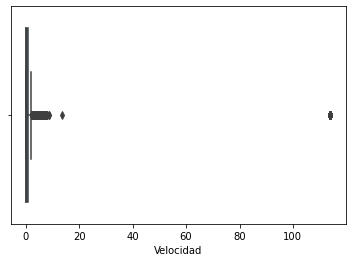

Estacion chec_uribe


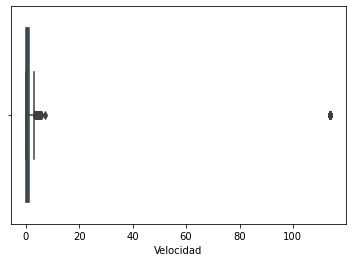

Estacion el_carmen


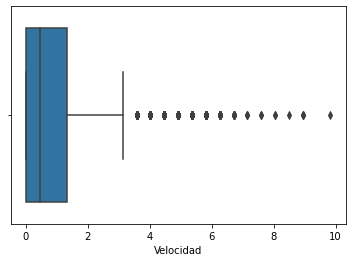

Estacion emas


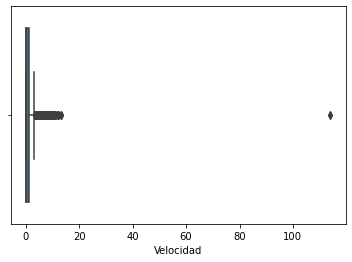

Estacion hospital_caldas


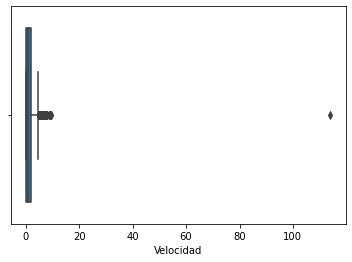

Estacion la_nubia


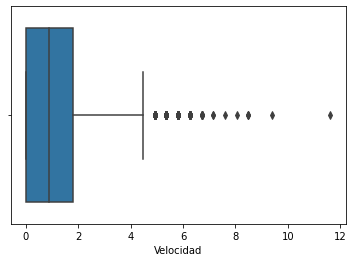

Estacion la_palma


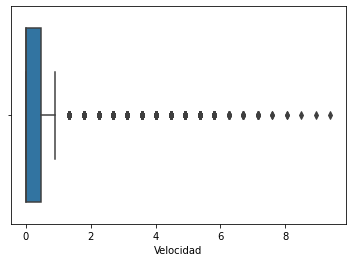

Estacion milan


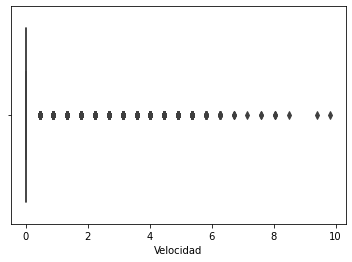

Estacion obs_vulcanologico


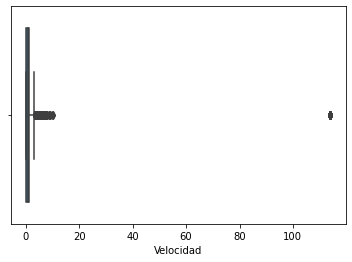

Estacion palogrande


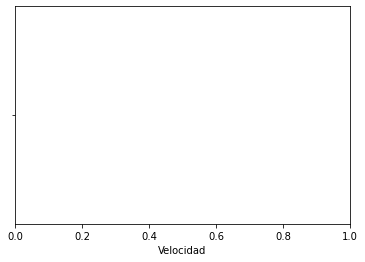

Estacion posgrados


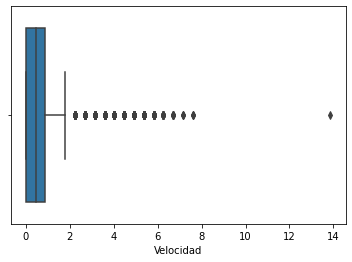

Estacion yarumos


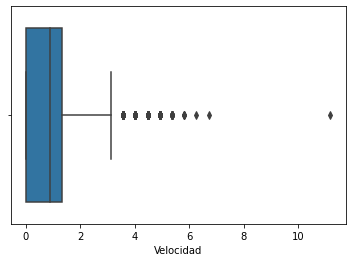

In [65]:
for i in datasets:
    print("Estacion", i.Estacion[0])
    sns.boxplot(x ='Velocidad', data = i)
    plt.show() 
    

In [20]:
def randrange_float(start, stop, step):
    return random.randint(0, int((stop - start) / step)) * step + start


In [21]:
n = 32.6
st = 1
step = 0.4
for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2017-01-01") & (i.Fecha < "2017-03-31") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Velocidad"] = np.where((i.Fecha >= "2017-01-01") & (i.Fecha <= "2017-03-31") & (i.Velocidad > n), promedio["valor"], i["Velocidad"])

    promedio2 = i[(i.Fecha > "2017-04-01") & (i.Fecha < "2017-06-30") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Velocidad"] = np.where((i.Fecha >= "2017-04-01") & (i.Fecha <= "2017-06-30") & (i.Velocidad > n), promedio2["valor"], i["Velocidad"])

    promedio3 = i[(i.Fecha > "2017-07-01") & (i.Fecha < "2017-09-30") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Velocidad"] = np.where((i.Fecha >= "2017-07-01") & (i.Fecha <= "2017-09-30") & (i.Velocidad > n), promedio3["valor"], i["Velocidad"])

    promedio4 = i[(i.Fecha > "2017-10-01") & (i.Fecha < "2017-12-31") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Velocidad"] = np.where((i.Fecha >= "2017-10-01") & (i.Fecha <= "2017-12-31") & (i.Velocidad > n), promedio4["valor"], i["Velocidad"])
 
n = 32.6
st = 1
step = 0.4
for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2018-01-01") & (i.Fecha < "2018-03-31") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Velocidad"] = np.where((i.Fecha >= "2018-01-01") & (i.Fecha <= "2018-03-31") & (i.Velocidad > n), promedio["valor"], i["Velocidad"])

    promedio2 = i[(i.Fecha > "2018-04-01") & (i.Fecha < "2018-06-30") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Velocidad"] = np.where((i.Fecha >= "2018-04-01") & (i.Fecha <= "2018-06-30") & (i.Velocidad > n), promedio2["valor"], i["Velocidad"])

    promedio3 = i[(i.Fecha > "2018-07-01") & (i.Fecha < "2018-09-30") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Velocidad"] = np.where((i.Fecha >= "2018-07-01") & (i.Fecha <= "2018-09-30") & (i.Velocidad > n), promedio3["valor"], i["Velocidad"])

    promedio4 = i[(i.Fecha > "2018-10-01") & (i.Fecha < "2018-12-31") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Velocidad"] = np.where((i.Fecha >= "2018-10-01") & (i.Fecha <= "2018-12-31") & (i.Velocidad > n), promedio4["valor"], i["Velocidad"])
            
n = 32.6
st = 1
step = 0.4
for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2019-01-01") & (i.Fecha < "2019-03-31") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Velocidad"] = np.where((i.Fecha >= "2019-01-01") & (i.Fecha <= "2019-03-31") & (i.Velocidad > n), promedio["valor"], i["Velocidad"])

    promedio2 = i[(i.Fecha > "2019-04-01") & (i.Fecha < "2019-06-30") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Velocidad"] = np.where((i.Fecha >= "2019-04-01") & (i.Fecha <= "2019-06-30") & (i.Velocidad > n), promedio2["valor"], i["Velocidad"])

    promedio3 = i[(i.Fecha > "2019-07-01") & (i.Fecha < "2019-09-30") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Velocidad"] = np.where((i.Fecha >= "2019-07-01") & (i.Fecha <= "2019-09-30") & (i.Velocidad > n), promedio3["valor"], i["Velocidad"])

    promedio4 = i[(i.Fecha > "2019-10-01") & (i.Fecha < "2019-12-31") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Velocidad"] = np.where((i.Fecha >= "2019-10-01") & (i.Fecha <= "2019-12-31") & (i.Velocidad > n), promedio4["valor"], i["Velocidad"])
            
n = 32.6
st = 1
step = 0.4
for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2020-01-01") & (i.Fecha < "2020-03-31") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Velocidad"] = np.where((i.Fecha >= "2020-01-01") & (i.Fecha <= "2020-03-31") & (i.Velocidad > n), promedio["valor"], i["Velocidad"])

    promedio2 = i[(i.Fecha > "2020-04-01") & (i.Fecha < "2020-06-30") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Velocidad"] = np.where((i.Fecha >= "2020-04-01") & (i.Fecha <= "2020-06-30") & (i.Velocidad > n), promedio2["valor"], i["Velocidad"])

    promedio3 = i[(i.Fecha > "2020-07-01") & (i.Fecha < "2020-09-30") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Velocidad"] = np.where((i.Fecha >= "2020-07-01") & (i.Fecha <= "2020-09-30") & (i.Velocidad > n), promedio3["valor"], i["Velocidad"])

    promedio4 = i[(i.Fecha > "2020-10-01") & (i.Fecha < "2020-12-31") & (i.Velocidad <= n)].Velocidad.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Velocidad"] = np.where((i.Fecha >= "2020-10-01") & (i.Fecha <= "2020-12-31") & (i.Velocidad > n), promedio4["valor"], i["Velocidad"])

alcazares


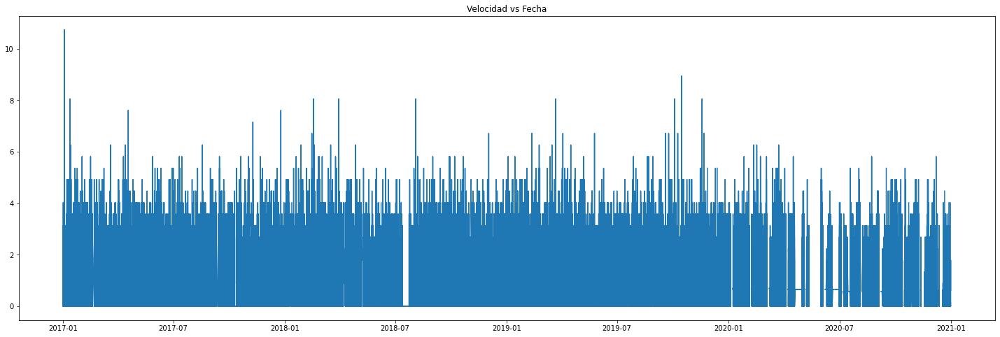

aranjuez


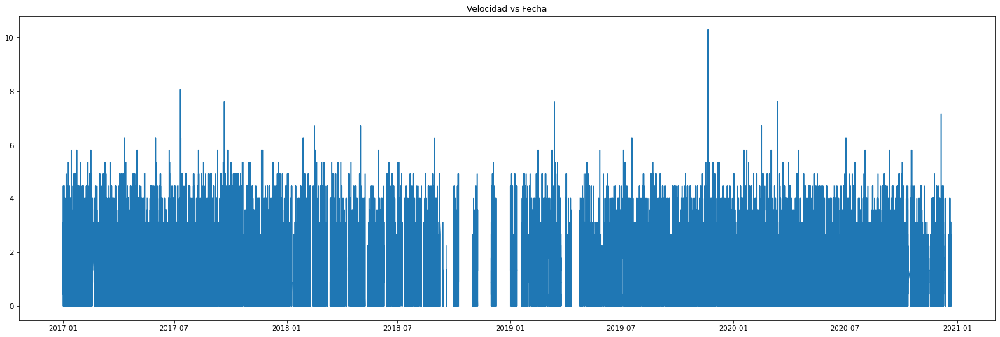

bosques_del_norte


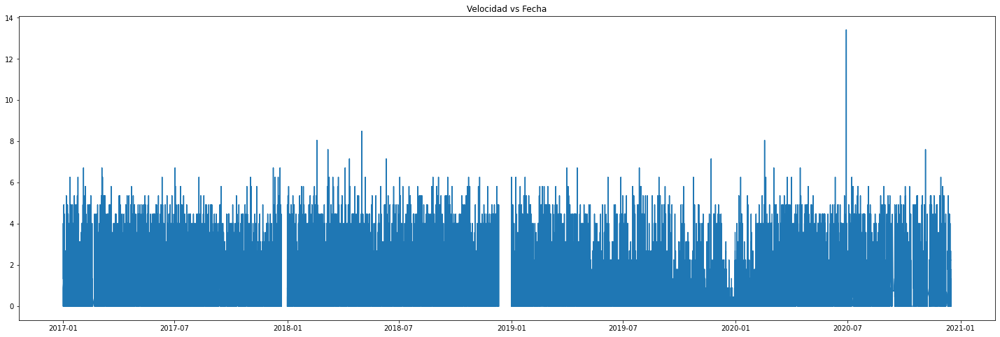

chec_uribe


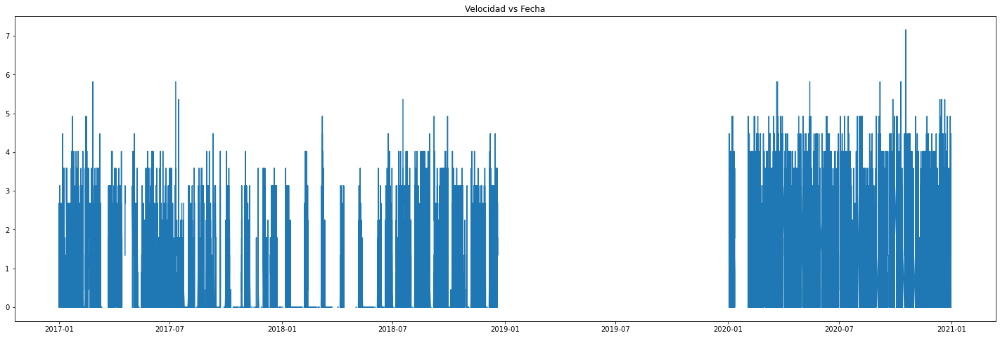

el_carmen


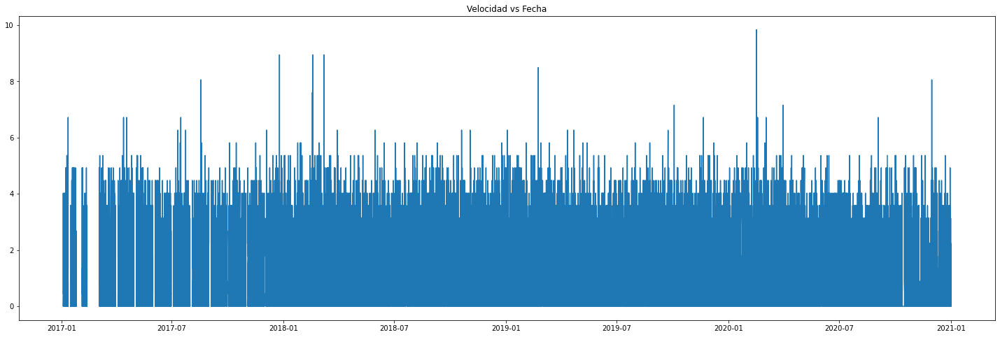

emas


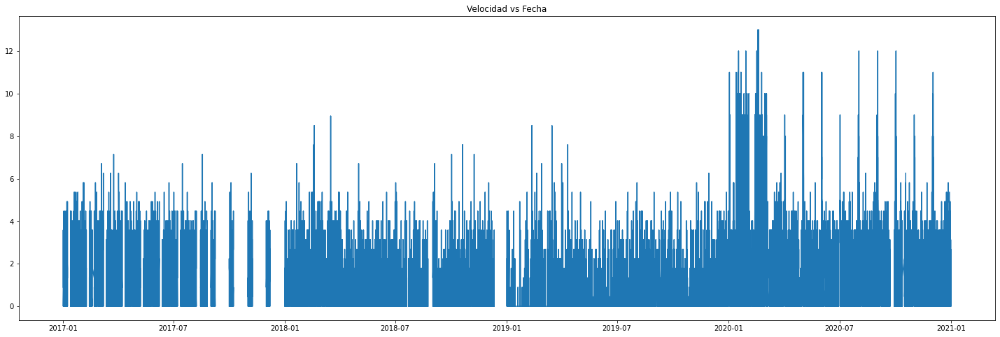

hospital_caldas


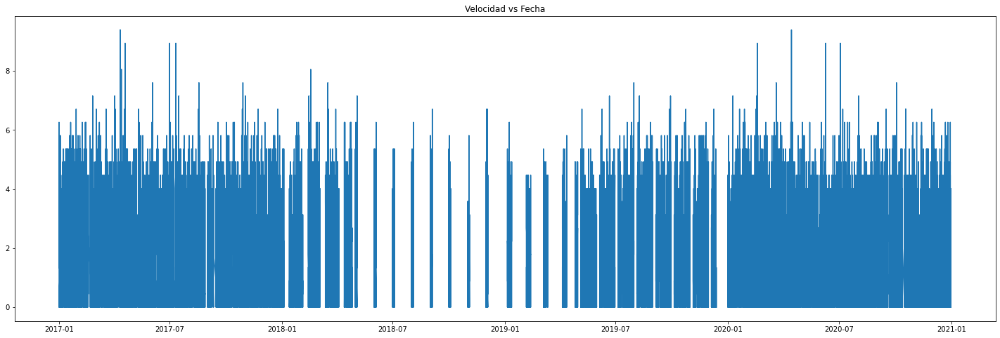

la_nubia


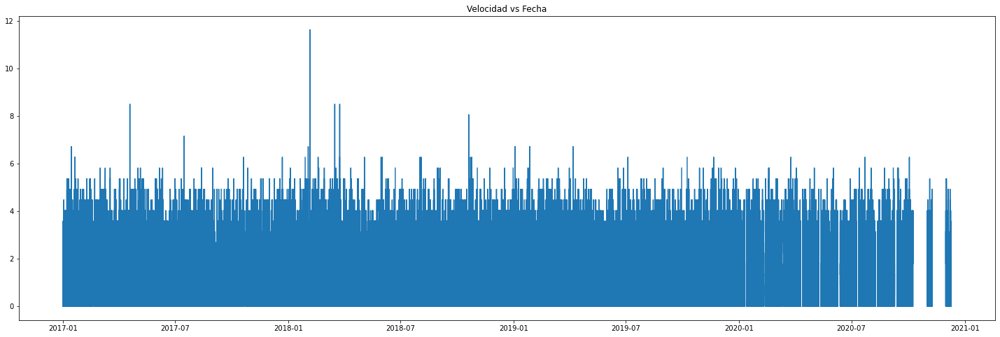

la_palma


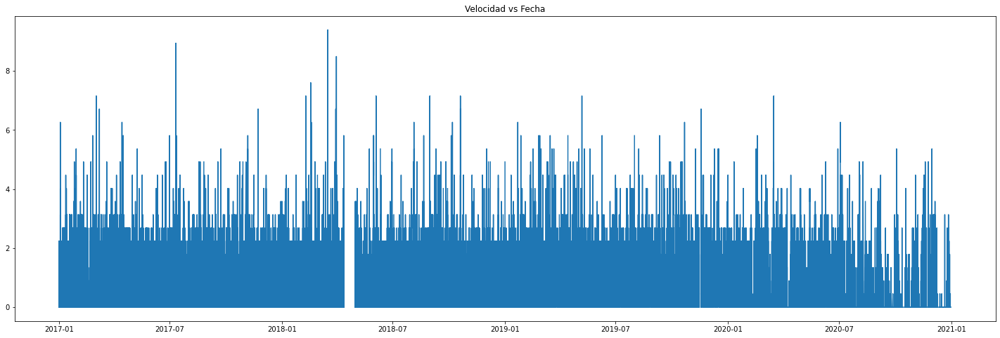

milan


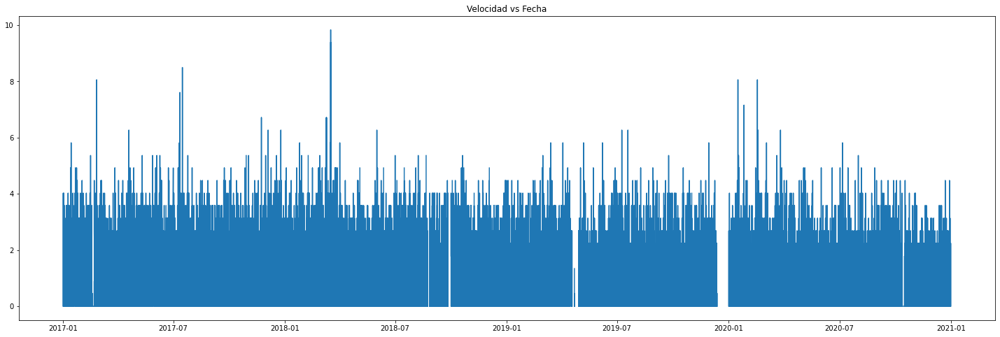

obs_vulcanologico


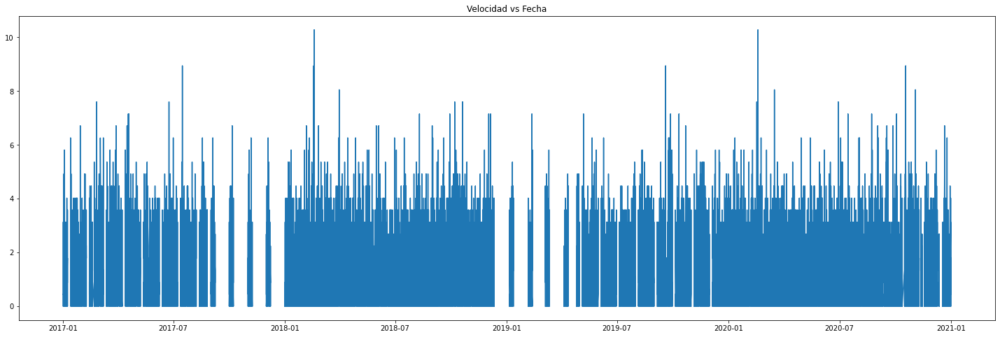

palogrande


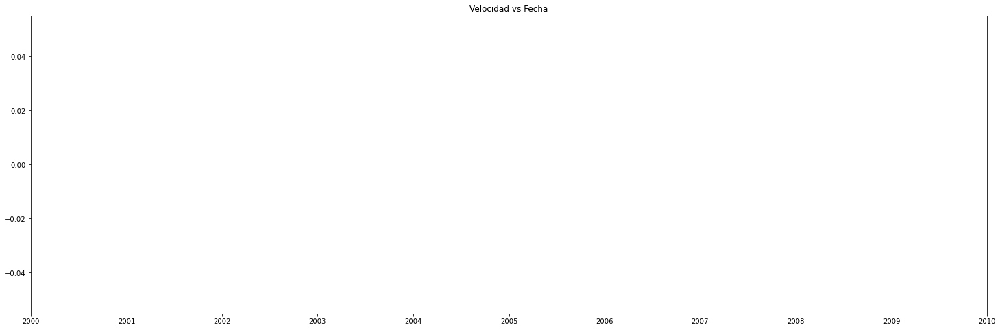

posgrados


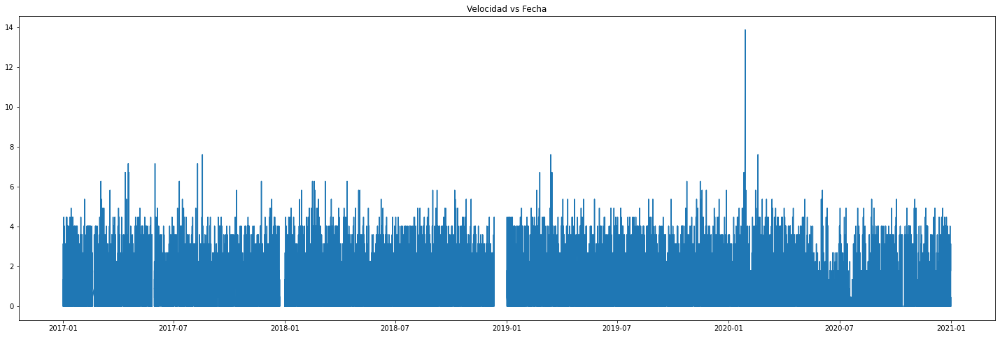

yarumos


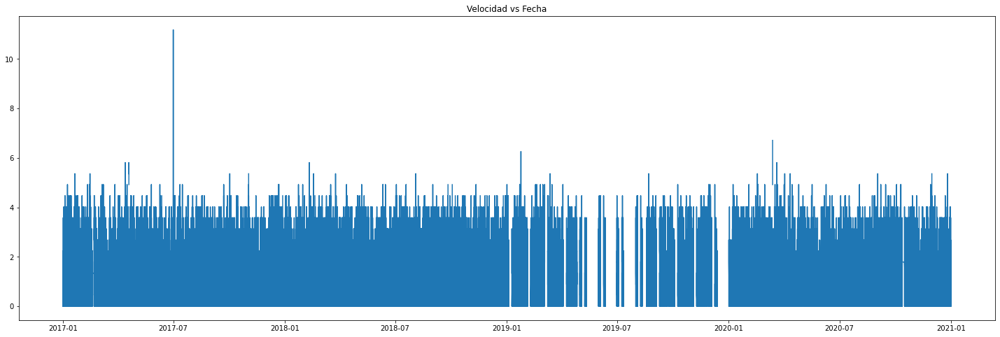

In [26]:
for i in datasets:   
    
    plt.figure(figsize=(25,8))
    print(i.Estacion[0])
    plt.plot(i.Fecha, i["Velocidad"])
    plt.title("Velocidad vs Fecha") 
    plt.show()

Estacion alcazares


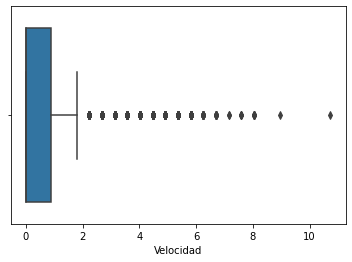

Estacion aranjuez


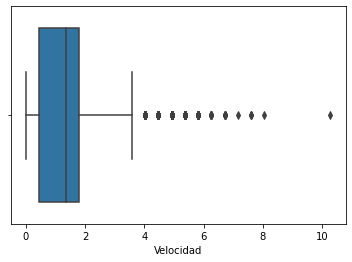

Estacion bosques_del_norte


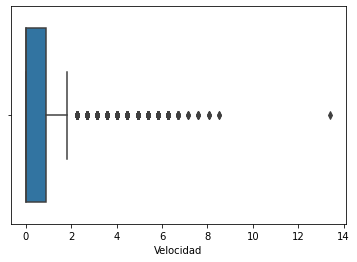

Estacion chec_uribe


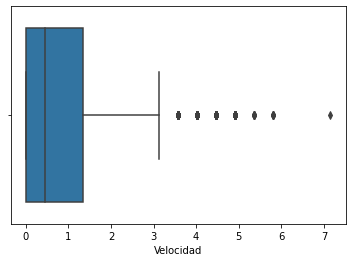

Estacion el_carmen


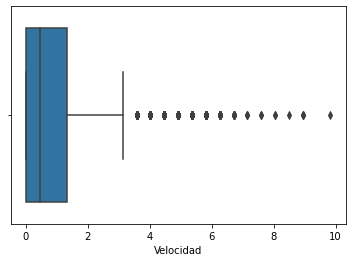

Estacion emas


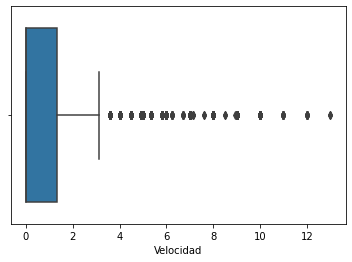

Estacion hospital_caldas


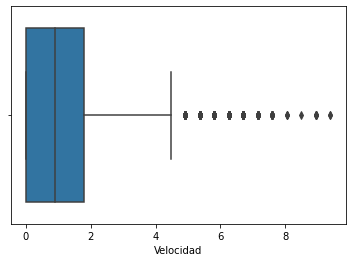

Estacion la_nubia


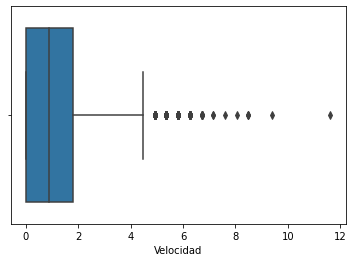

Estacion la_palma


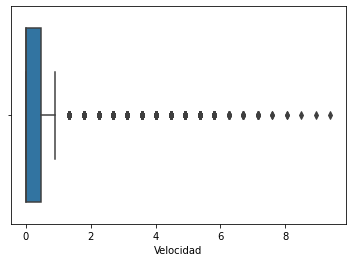

Estacion milan


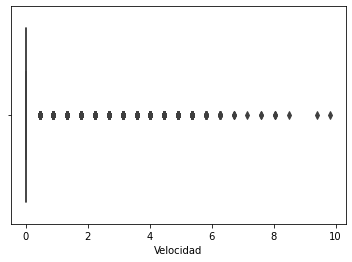

Estacion obs_vulcanologico


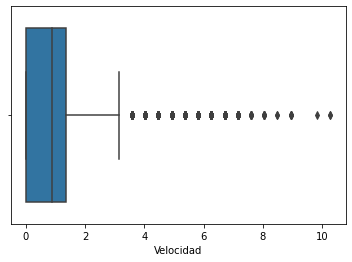

Estacion palogrande


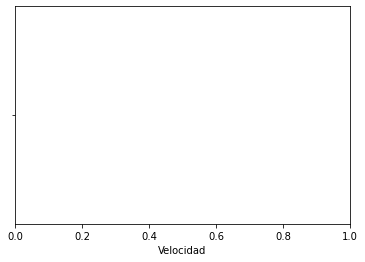

Estacion posgrados


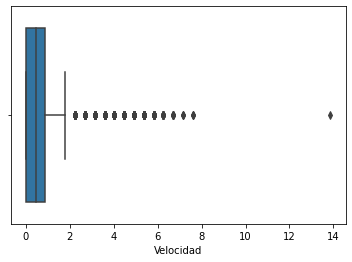

Estacion yarumos


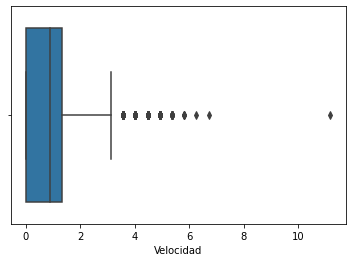

In [90]:
for i in datasets:
    print("Estacion", i.Estacion[0])
    sns.boxplot(x ='Velocidad', data = i)
    plt.show() 
    

In [27]:
for i in datasets:
    print(i.Estacion[0])  
    print(i.Velocidad.isnull().sum(), "\n")     

alcazares
32618 

aranjuez
64552 

bosques_del_norte
17294 

chec_uribe
160963 

el_carmen
18098 

emas
60619 

hospital_caldas
116903 

la_nubia
30217 

la_palma
18669 

milan
21790 

obs_vulcanologico
81802 

palogrande
409265 

posgrados
15194 

yarumos
43291 



## Temperatura

alcazares


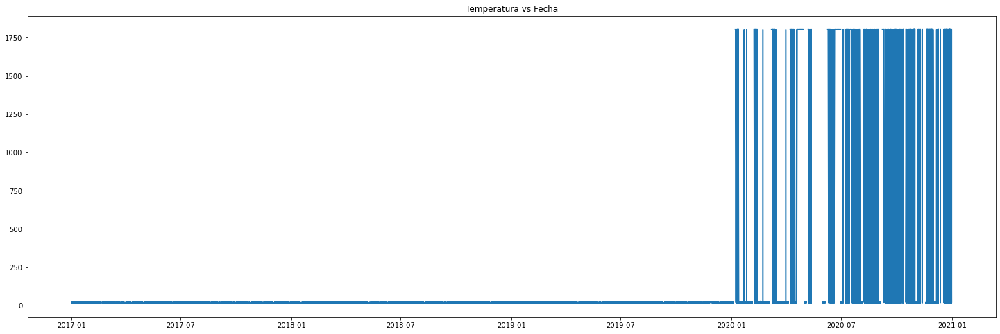

aranjuez


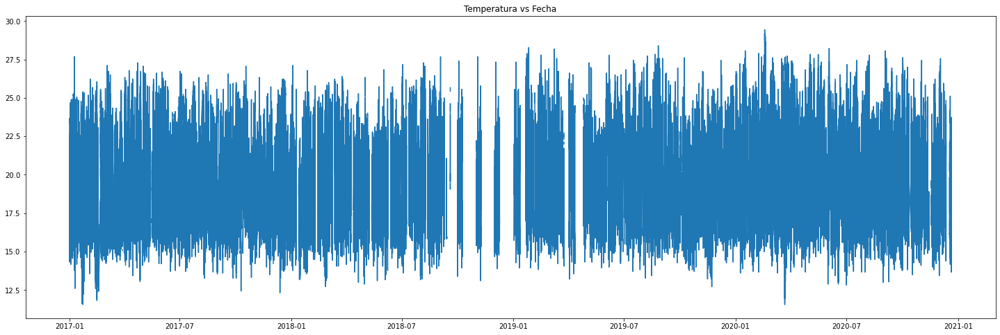

bosques_del_norte


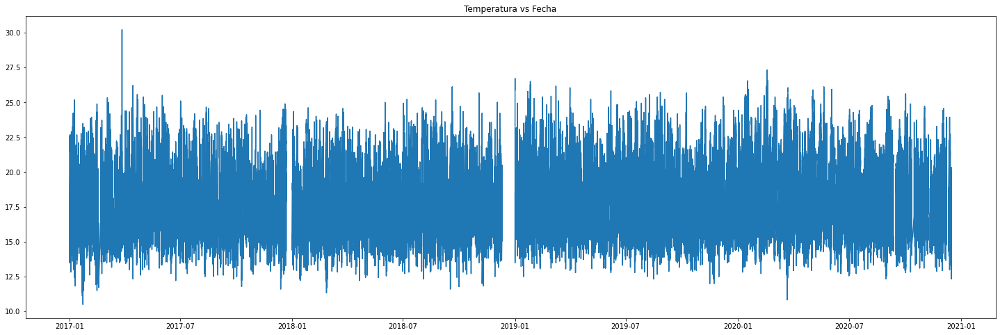

chec_uribe


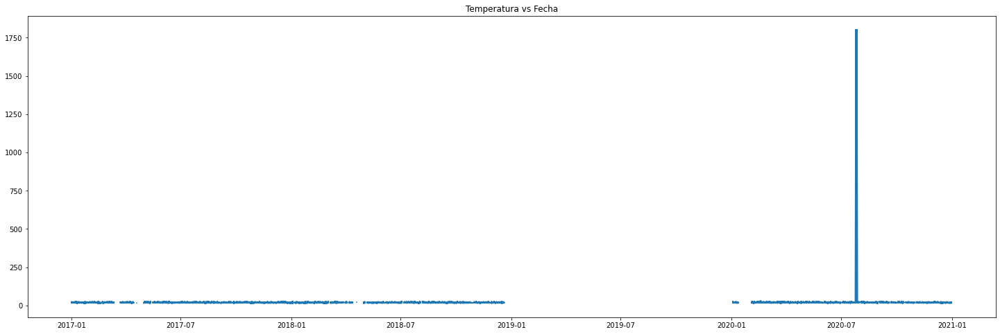

el_carmen


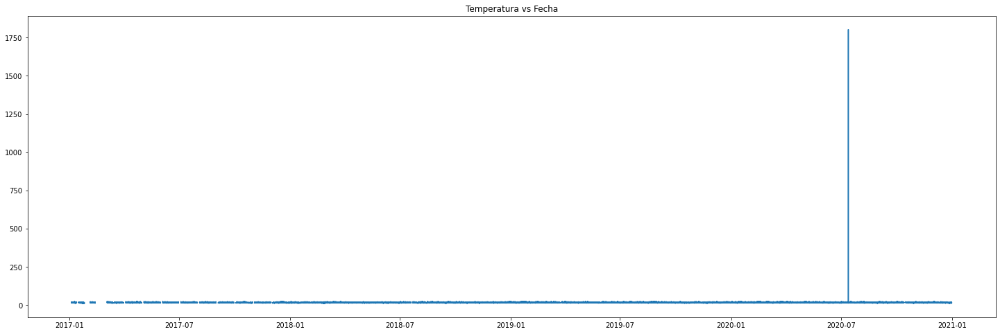

emas


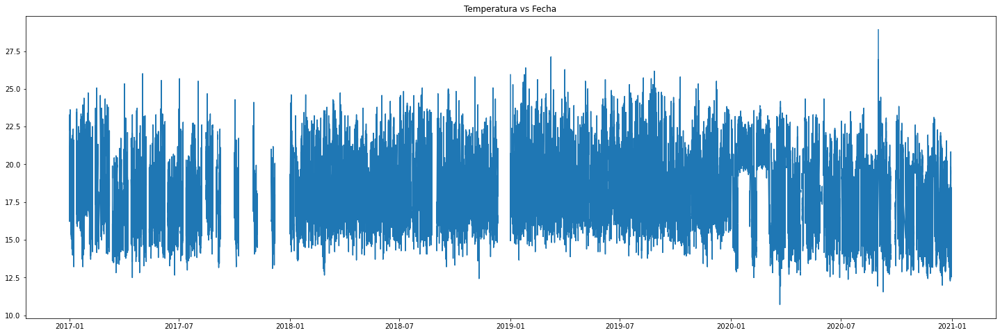

hospital_caldas


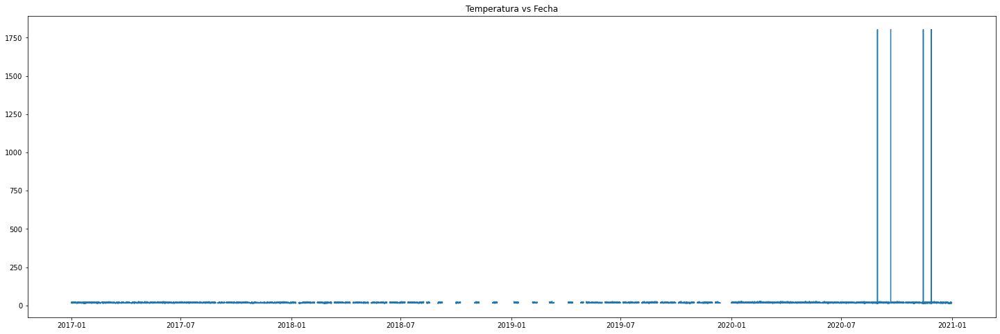

la_nubia


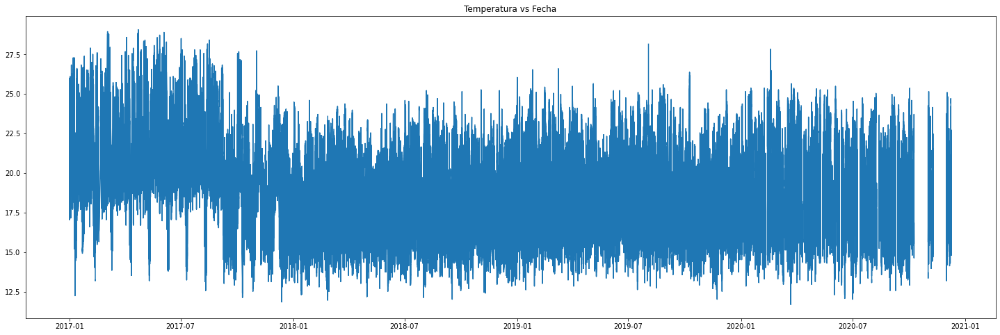

la_palma


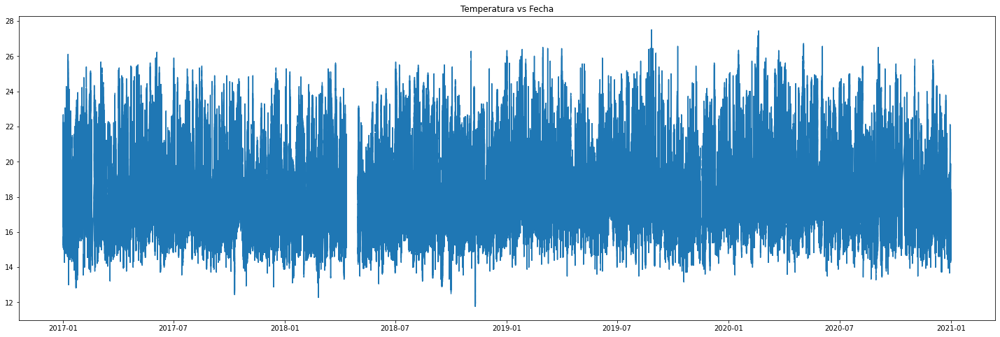

milan


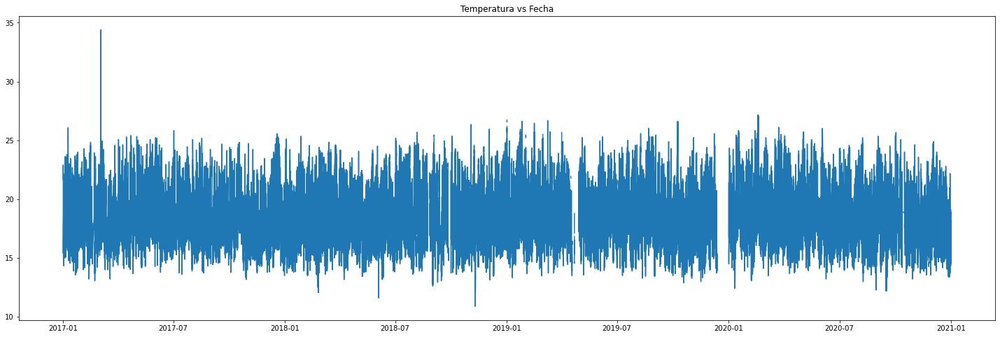

obs_vulcanologico


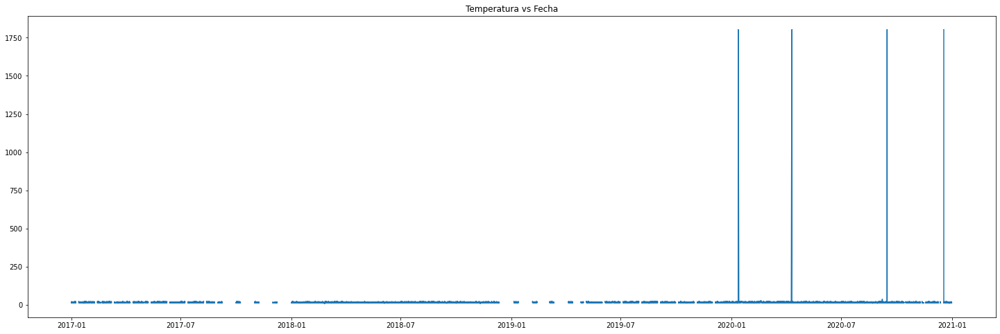

palogrande


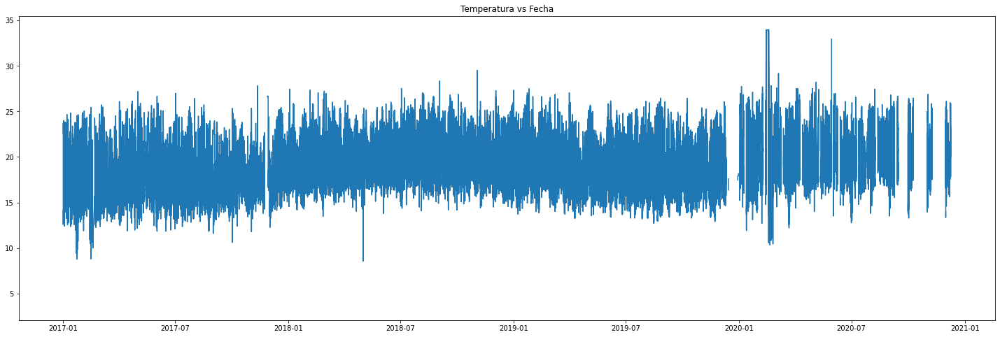

posgrados


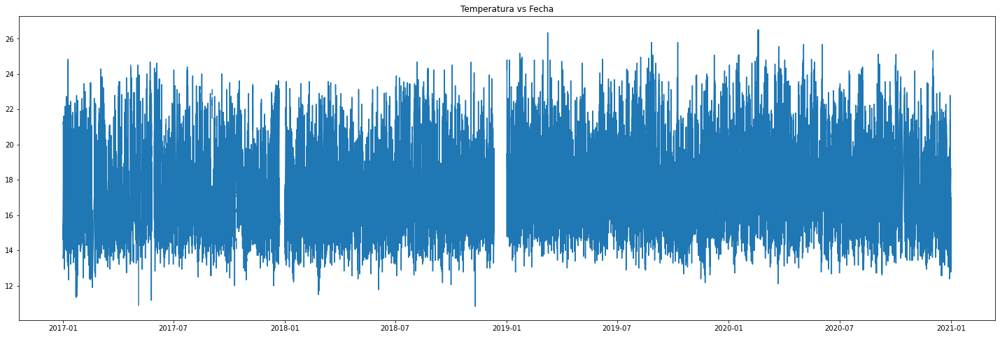

yarumos


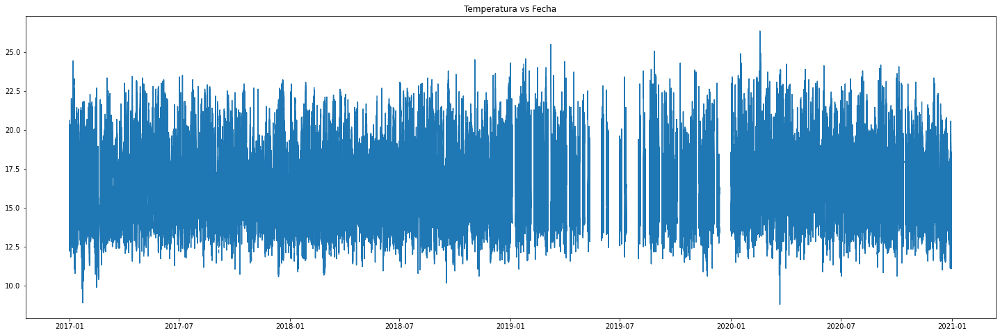

In [85]:
for i in datasets:   
    
    plt.figure(figsize=(25,8))
    print(i.Estacion[0])
    plt.plot(i.Fecha, i["Temperatura"])
    plt.title("Temperatura vs Fecha") 
    plt.show()

In [28]:
for i in datasets:
    print(i.Estacion[0]) 
    print(i.loc[i.Temperatura == 0].shape, "\n")  

alcazares
(0, 13) 

aranjuez
(0, 13) 

bosques_del_norte
(0, 13) 

chec_uribe
(0, 13) 

el_carmen
(0, 13) 

emas
(0, 13) 

hospital_caldas
(0, 13) 

la_nubia
(0, 13) 

la_palma
(0, 13) 

milan
(0, 13) 

obs_vulcanologico
(0, 13) 

palogrande
(0, 13) 

posgrados
(0, 13) 

yarumos
(0, 13) 



In [29]:
for i in datasets:
    print(i.Estacion[0])
    print(i.loc[i.Temperatura == 0], "\n") 

alcazares
Empty DataFrame
Columns: [Fecha, Hora, Temperatura, Velocidad, Direccion, Presion, Humedad, Precipitacion, Radiacion, Evapotranspiracion, Precipitacion_Real, Evapo_real, Estacion]
Index: [] 

aranjuez
Empty DataFrame
Columns: [Fecha, Hora, Temperatura, Velocidad, Direccion, Presion, Humedad, Precipitacion, Radiacion, Evapotranspiracion, Precipitacion_Real, Evapo_real, Estacion]
Index: [] 

bosques_del_norte
Empty DataFrame
Columns: [Fecha, Hora, Temperatura, Velocidad, Direccion, Presion, Humedad, Precipitacion, Radiacion, Evapotranspiracion, Precipitacion_Real, Evapo_real, Estacion]
Index: [] 

chec_uribe
Empty DataFrame
Columns: [Fecha, Hora, Temperatura, Velocidad, Direccion, Presion, Humedad, Precipitacion, Radiacion, Evapotranspiracion, Precipitacion_Real, Evapo_real, Estacion]
Index: [] 

el_carmen
Empty DataFrame
Columns: [Fecha, Hora, Temperatura, Velocidad, Direccion, Presion, Humedad, Precipitacion, Radiacion, Evapotranspiracion, Precipitacion_Real, Evapo_real, Esta

In [30]:
for i in datasets:
    print( "\n",i.Estacion[0])  
    print(i.Temperatura.min())  


 alcazares
13.22

 aranjuez
11.56

 bosques_del_norte
10.5

 chec_uribe
13.22

 el_carmen
11.11

 emas
10.72

 hospital_caldas
12.17

 la_nubia
11.71

 la_palma
11.78

 milan
10.89

 obs_vulcanologico
9.78

 palogrande
3.59

 posgrados
10.83

 yarumos
8.78


In [32]:
for i in datasets:
    print( "\n",i.Estacion[0])  
    print(i.Temperatura.min())


 alcazares
13.22

 aranjuez
11.56

 bosques_del_norte
10.5

 chec_uribe
13.22

 el_carmen
11.11

 emas
10.72

 hospital_caldas
12.17

 la_nubia
11.71

 la_palma
11.78

 milan
10.89

 obs_vulcanologico
9.78

 palogrande
7.37

 posgrados
10.83

 yarumos
8.78


**Las Temperaturas mas bajas en Manizales llegan hasta 7 °C, por lo tanto cualquier valor por debajo se considera outlier. Se reemplazaran los valores mas bajos por 7°C.**

In [22]:
n= 7 
s = 2
step = 0.4
for i in datasets:
    e = len(i)
    np.random.seed(42)
    temp = [randrange_float(n, n + s, step) for p in range(e)]
    temp = np.round(temp,2)  
    #temp = round(np.random.uniform(7,7+1),2)
    i["Temperatura"] = np.where((i.Temperatura < n), temp, i["Temperatura"]) 

Estacion alcazares


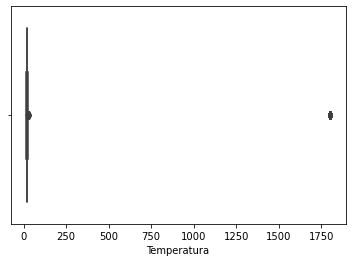

Estacion aranjuez


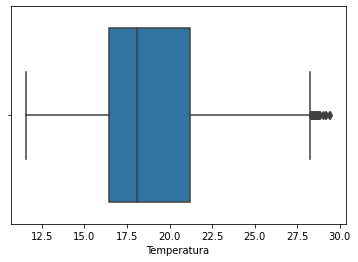

Estacion bosques_del_norte


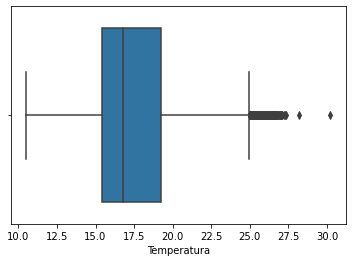

Estacion chec_uribe


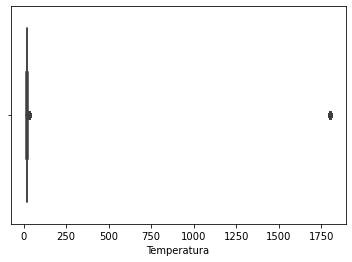

Estacion el_carmen


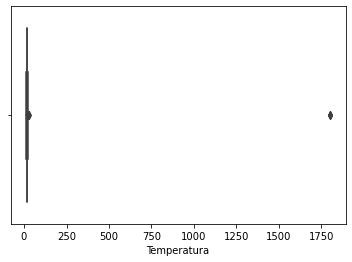

Estacion emas


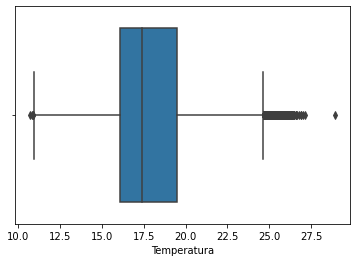

Estacion hospital_caldas


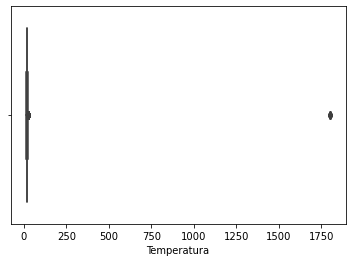

Estacion la_nubia


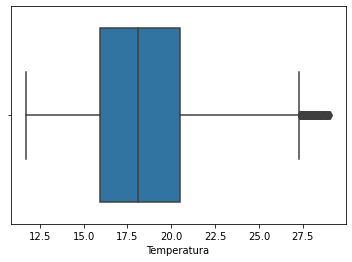

Estacion la_palma


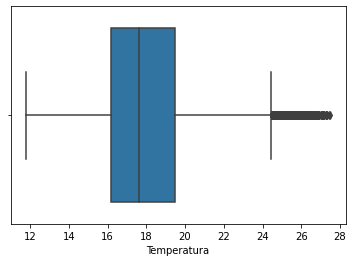

Estacion milan


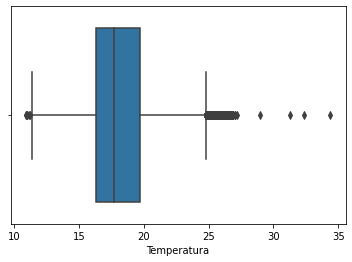

Estacion obs_vulcanologico


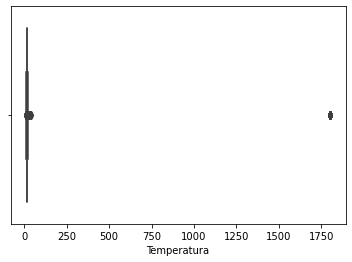

Estacion palogrande


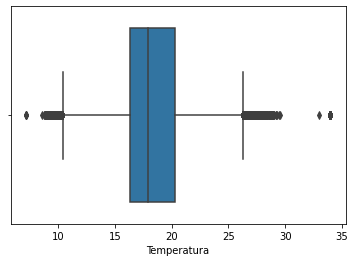

Estacion posgrados


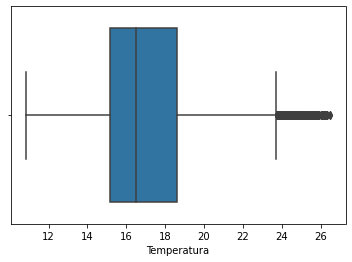

Estacion yarumos


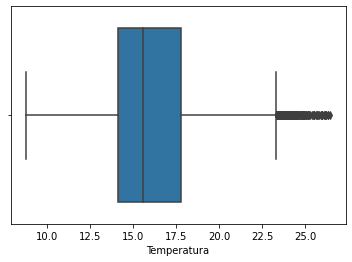

In [167]:
for i in datasets:
    print("Estacion", i.Estacion[0]) 
    sns.boxplot(x ='Temperatura', data = i)
    plt.show() 

**La temperatura maxima registrada en manizales durante los ultimos 10 años, es de 32°C.**

In [23]:
n = 32
st = 1
step = 0.4
for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2017-01-01") & (i.Fecha < "2017-03-31") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Temperatura"] = np.where((i.Fecha >= "2017-01-01") & (i.Fecha <= "2017-03-31") & (i.Temperatura > n), promedio["valor"], i["Temperatura"])

    promedio2 = i[(i.Fecha > "2017-04-01") & (i.Fecha < "2017-06-30") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Temperatura"] = np.where((i.Fecha >= "2017-04-01") & (i.Fecha <= "2017-06-30") & (i.Temperatura > n), promedio2["valor"], i["Temperatura"])

    promedio3 = i[(i.Fecha > "2017-07-01") & (i.Fecha < "2017-09-30") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Temperatura"] = np.where((i.Fecha >= "2017-07-01") & (i.Fecha <= "2017-09-30") & (i.Temperatura > n), promedio3["valor"], i["Temperatura"])

    promedio4 = i[(i.Fecha > "2017-10-01") & (i.Fecha < "2017-12-31") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Temperatura"] = np.where((i.Fecha >= "2017-10-01") & (i.Fecha <= "2017-12-31") & (i.Temperatura > n), promedio4["valor"], i["Temperatura"])


n = 32
st = 1
step = 0.4
for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2018-01-01") & (i.Fecha < "2018-03-31") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Temperatura"] = np.where((i.Fecha >= "2018-01-01") & (i.Fecha <= "2018-03-31") & (i.Temperatura > n), promedio["valor"], i["Temperatura"])

    promedio2 = i[(i.Fecha > "2018-04-01") & (i.Fecha < "2018-06-30") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Temperatura"] = np.where((i.Fecha >= "2018-04-01") & (i.Fecha <= "2018-06-30") & (i.Temperatura > n), promedio2["valor"], i["Temperatura"])

    promedio3 = i[(i.Fecha > "2018-07-01") & (i.Fecha < "2018-09-30") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Temperatura"] = np.where((i.Fecha >= "2018-07-01") & (i.Fecha <= "2018-09-30") & (i.Temperatura > n), promedio3["valor"], i["Temperatura"])

    promedio4 = i[(i.Fecha > "2018-10-01") & (i.Fecha < "2018-12-31") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Temperatura"] = np.where((i.Fecha >= "2018-10-01") & (i.Fecha <= "2018-12-31") & (i.Temperatura > n), promedio4["valor"], i["Temperatura"])
            
n = 32
st = 1
step = 0.4
for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2019-01-01") & (i.Fecha < "2019-03-31") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Temperatura"] = np.where((i.Fecha >= "2019-01-01") & (i.Fecha <= "2019-03-31") & (i.Temperatura > n), promedio["valor"], i["Temperatura"])

    promedio2 = i[(i.Fecha > "2019-04-01") & (i.Fecha < "2019-06-30") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Temperatura"] = np.where((i.Fecha >= "2019-04-01") & (i.Fecha <= "2019-06-30") & (i.Temperatura > n), promedio2["valor"], i["Temperatura"])

    promedio3 = i[(i.Fecha > "2019-07-01") & (i.Fecha < "2019-09-30") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Temperatura"] = np.where((i.Fecha >= "2019-07-01") & (i.Fecha <= "2019-09-30") & (i.Temperatura > n), promedio3["valor"], i["Temperatura"])

    promedio4 = i[(i.Fecha > "2019-10-01") & (i.Fecha < "2019-12-31") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Temperatura"] = np.where((i.Fecha >= "2019-10-01") & (i.Fecha <= "2019-12-31") & (i.Temperatura > n), promedio4["valor"], i["Temperatura"])
            
n = 32
st = 1
step = 0.4
for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2020-01-01") & (i.Fecha < "2020-03-31") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Temperatura"] = np.where((i.Fecha >= "2020-01-01") & (i.Fecha <= "2020-03-31") & (i.Temperatura > n), promedio["valor"], i["Temperatura"])

    promedio2 = i[(i.Fecha > "2020-04-01") & (i.Fecha < "2020-06-30") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Temperatura"] = np.where((i.Fecha >= "2020-04-01") & (i.Fecha <= "2020-06-30") & (i.Temperatura > n), promedio2["valor"], i["Temperatura"])

    promedio3 = i[(i.Fecha > "2020-07-01") & (i.Fecha < "2020-09-30") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Temperatura"] = np.where((i.Fecha >= "2020-07-01") & (i.Fecha <= "2020-09-30") & (i.Temperatura > n), promedio3["valor"], i["Temperatura"])

    promedio4 = i[(i.Fecha > "2020-10-01") & (i.Fecha < "2020-12-31") & (i.Temperatura <= n)].Temperatura.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Temperatura"] = np.where((i.Fecha >= "2020-10-01") & (i.Fecha <= "2020-12-31") & (i.Temperatura > n), promedio4["valor"], i["Temperatura"])


alcazares


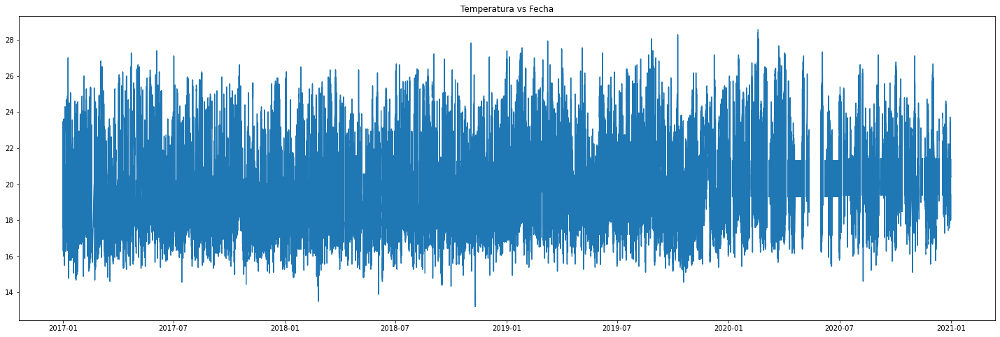

aranjuez


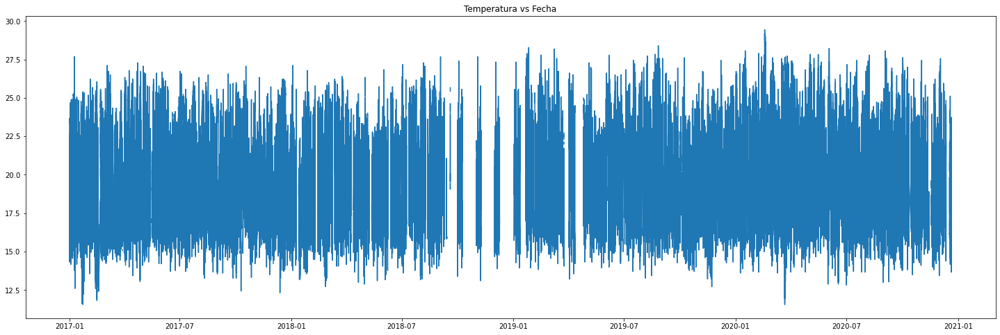

bosques_del_norte


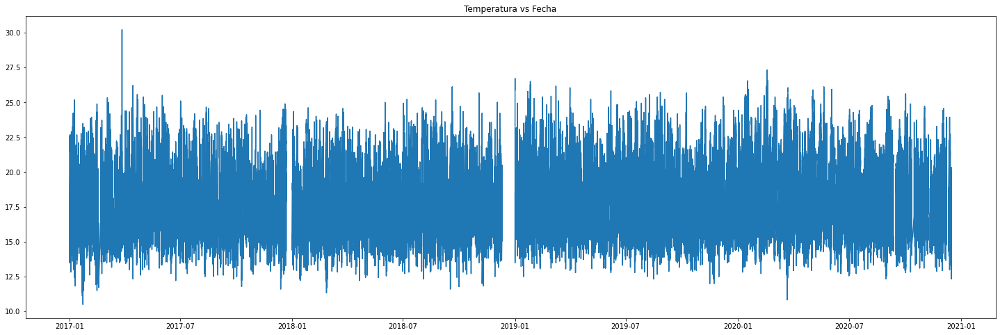

chec_uribe


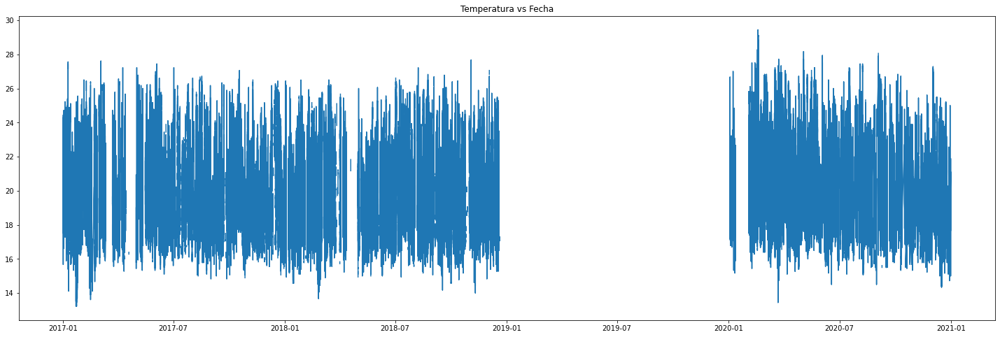

el_carmen


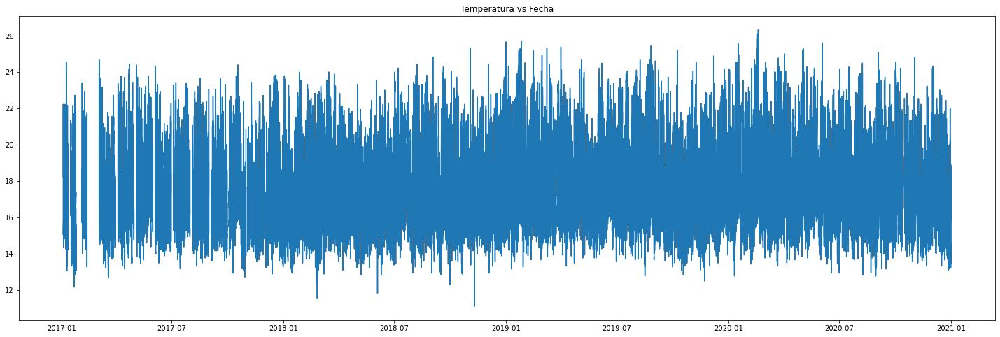

emas


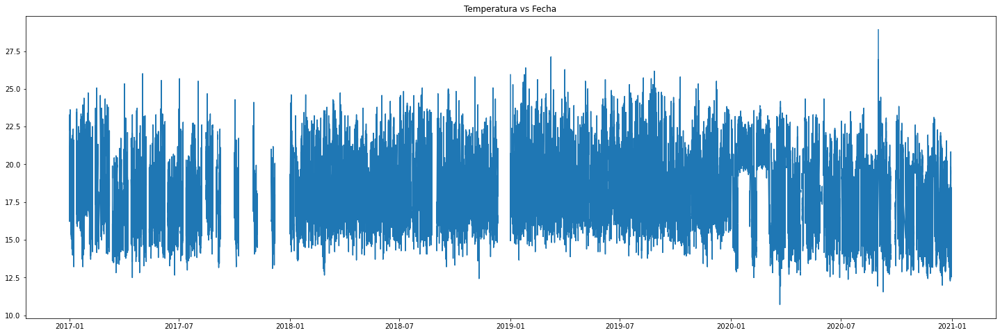

hospital_caldas


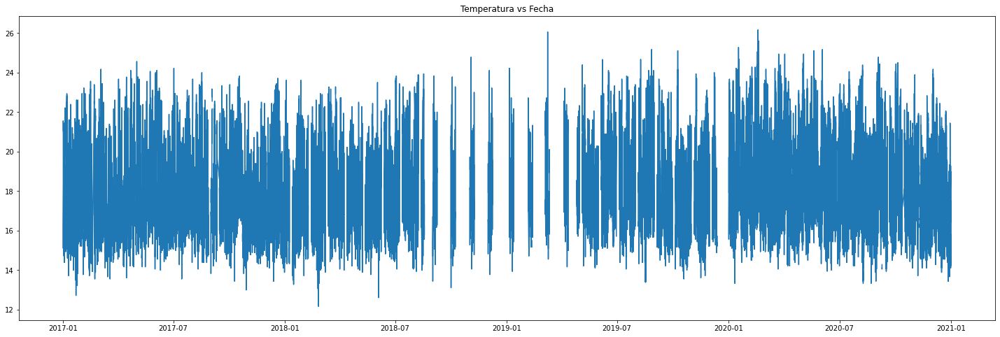

la_nubia


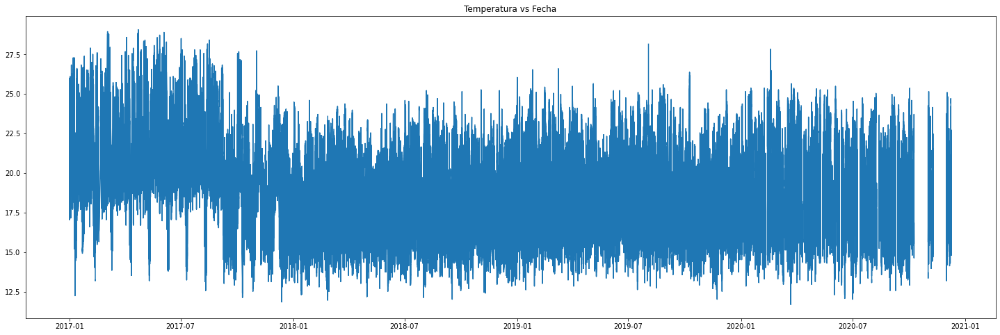

la_palma


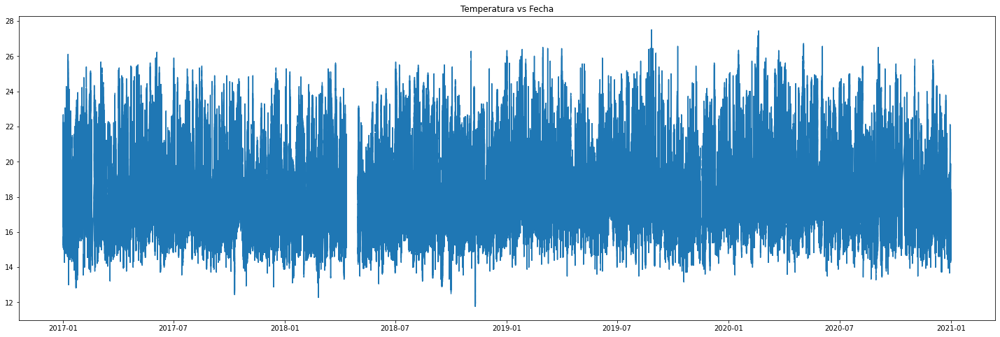

milan


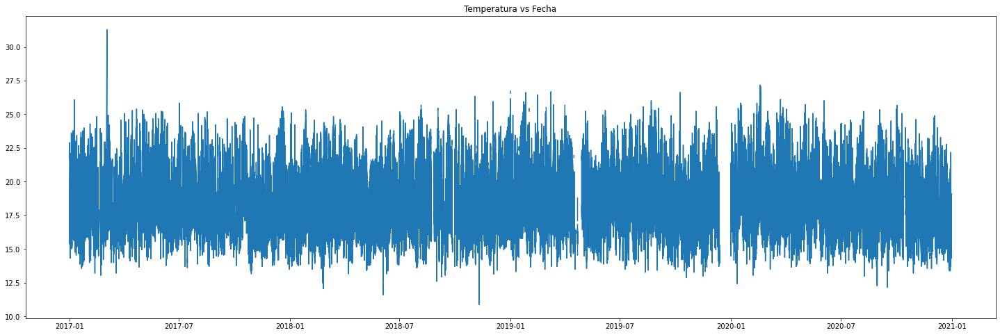

obs_vulcanologico


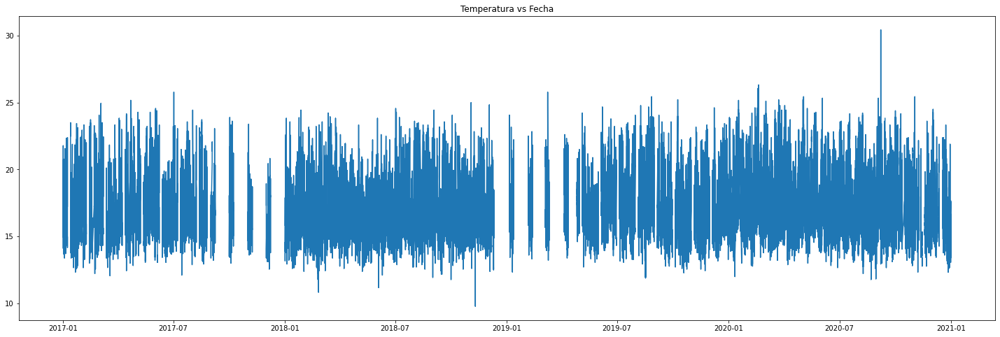

palogrande


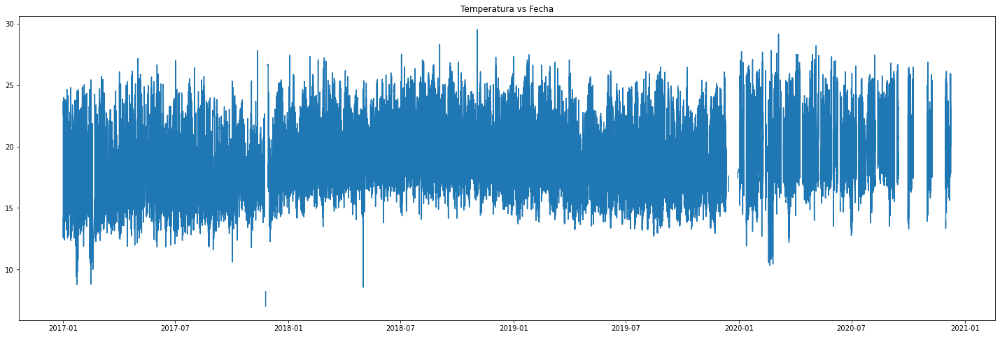

posgrados


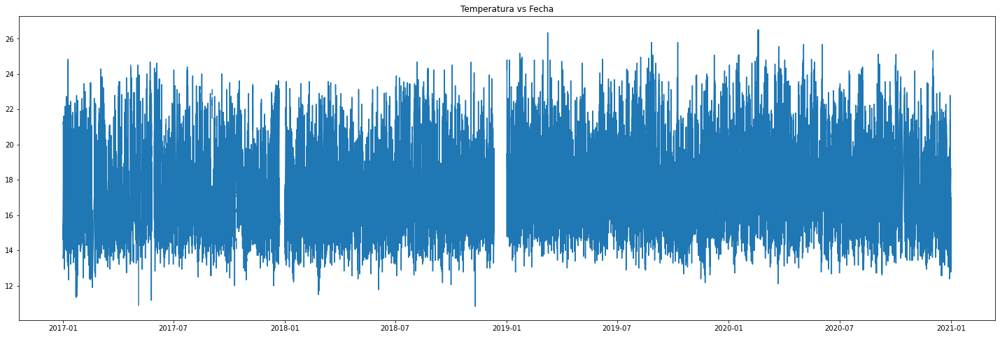

yarumos


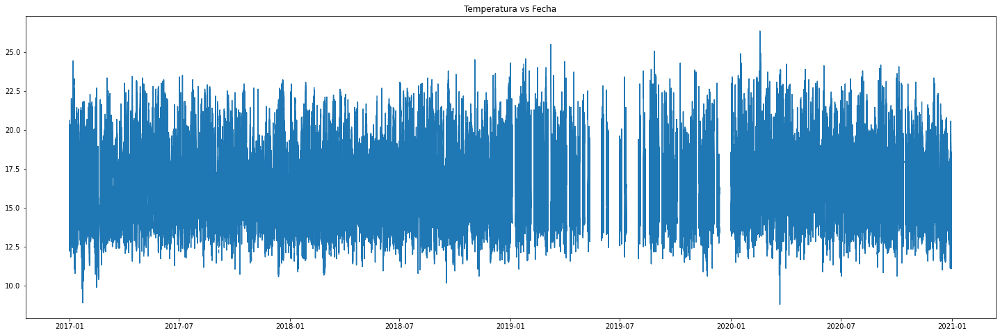

In [27]:
for i in datasets:   
    
    plt.figure(figsize=(25,8))
    print(i.Estacion[0])
    plt.plot(i.Fecha, i["Temperatura"])
    plt.title("Temperatura vs Fecha") 
    plt.show()

## Presion Barometrica 

alcazares


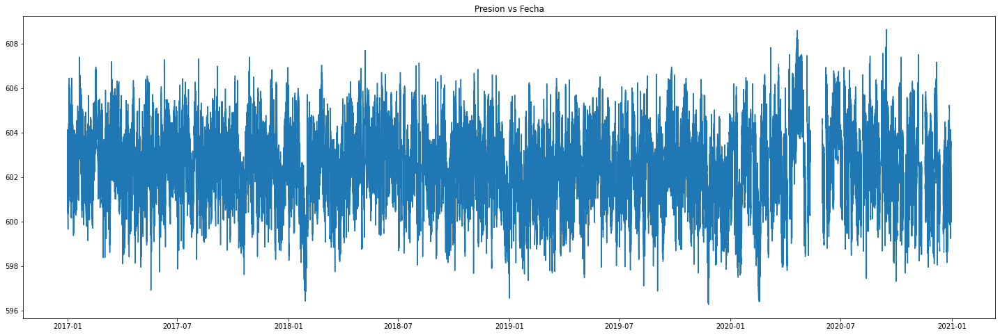

aranjuez


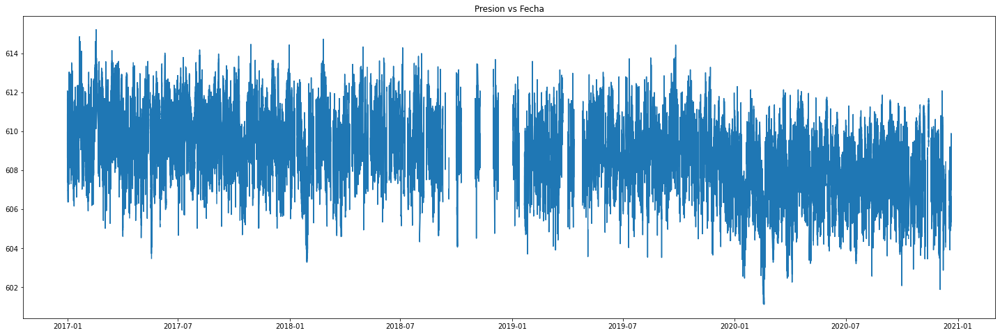

bosques_del_norte


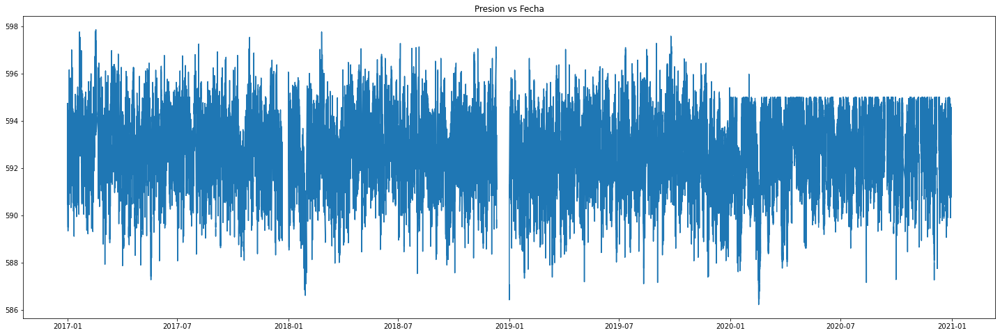

chec_uribe


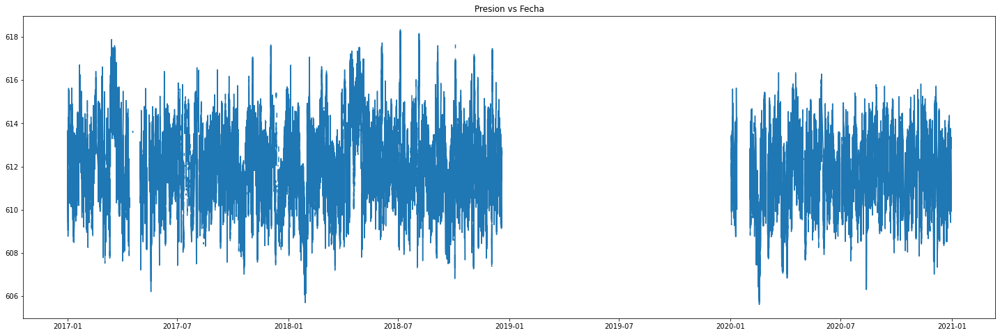

el_carmen


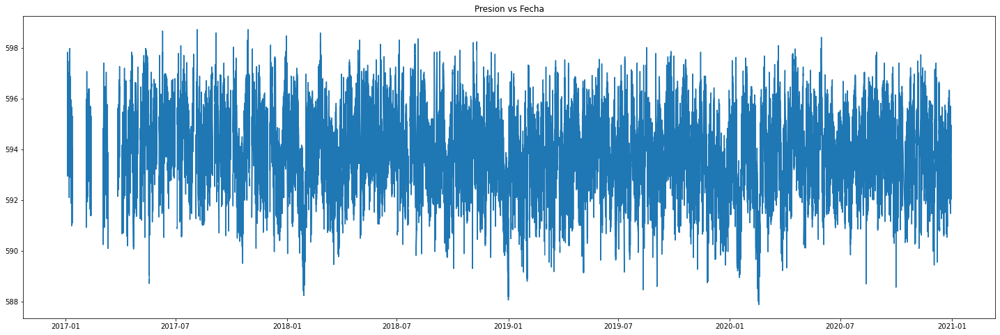

emas


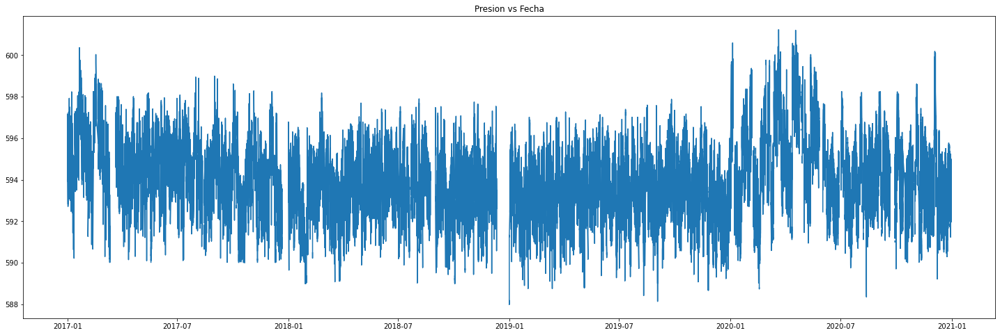

hospital_caldas


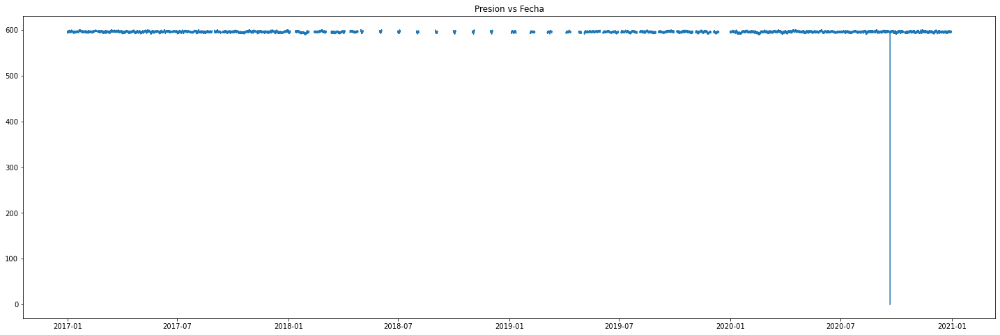

la_nubia


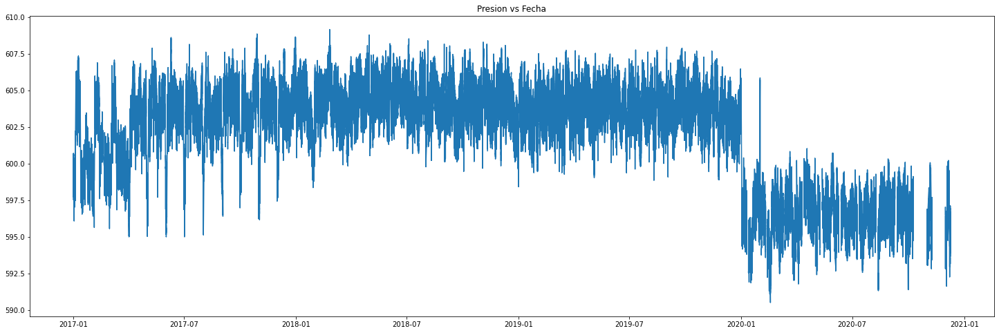

la_palma


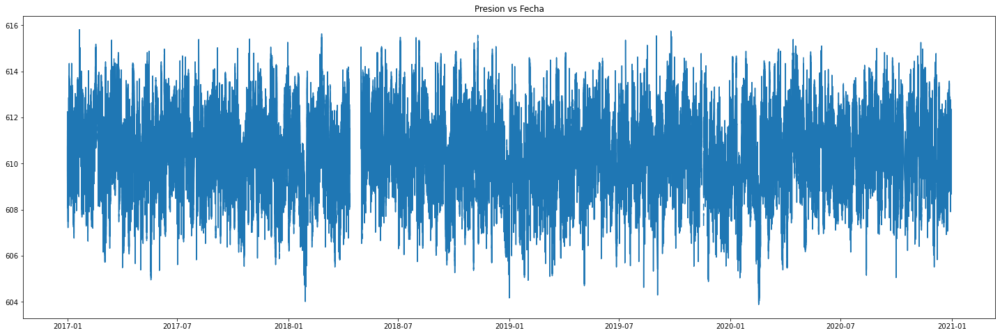

milan


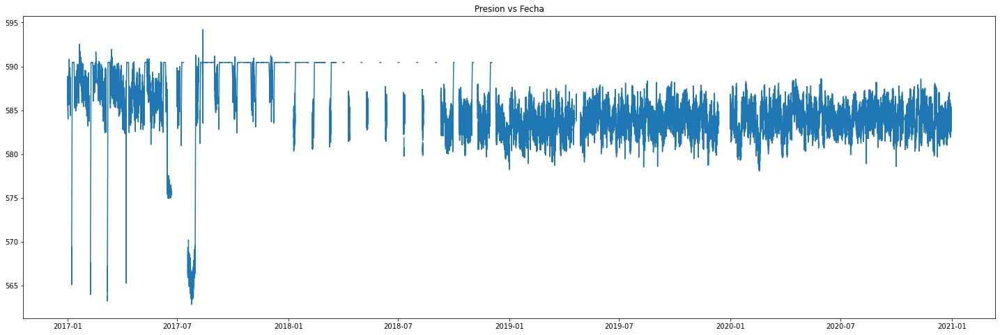

obs_vulcanologico


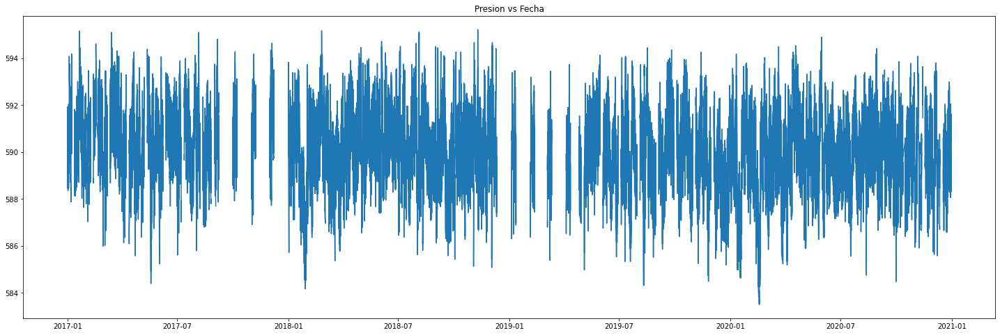

palogrande


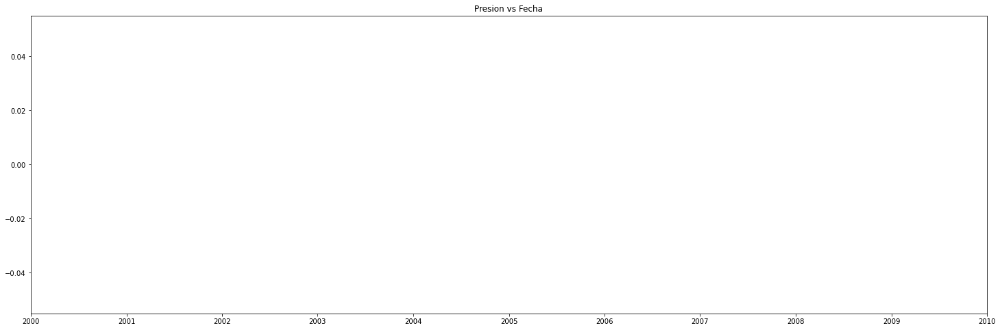

posgrados


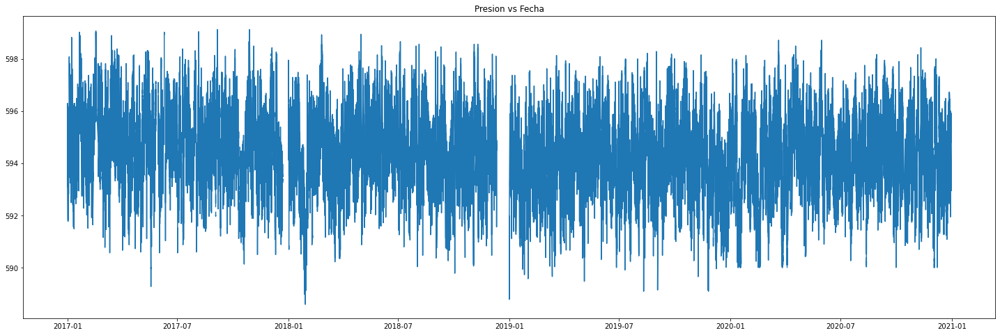

yarumos


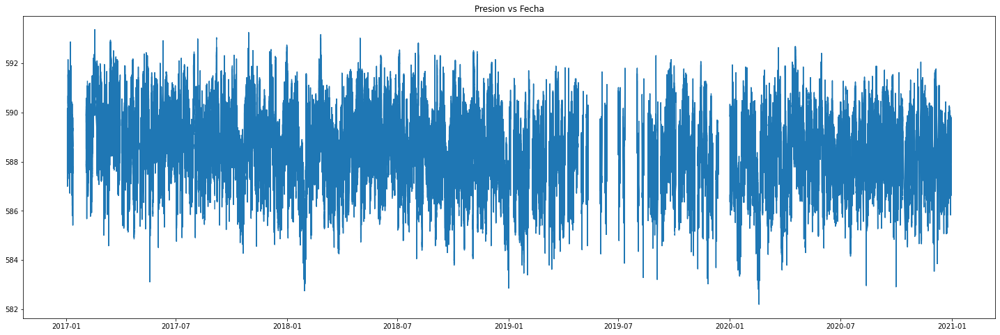

In [170]:
for i in datasets:   
    
    plt.figure(figsize=(25,8))
    print(i.Estacion[0])
    plt.plot(i.Fecha, i["Presion"]) 
    plt.title("Presion vs Fecha")  
    plt.show()

Estacion alcazares


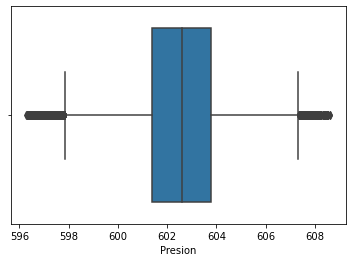

Estacion aranjuez


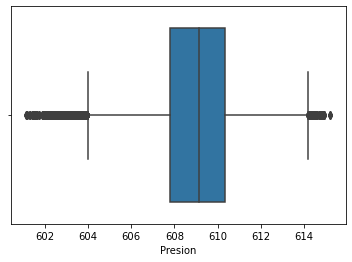

Estacion bosques_del_norte


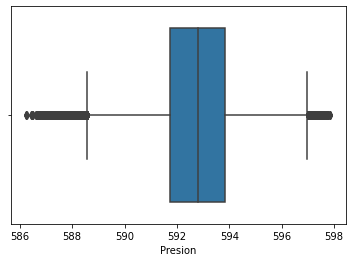

Estacion chec_uribe


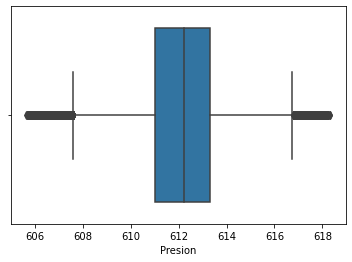

Estacion el_carmen


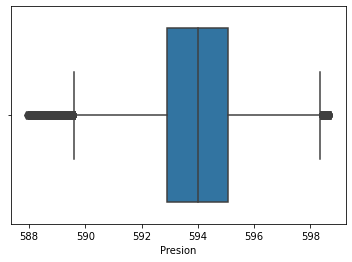

Estacion emas


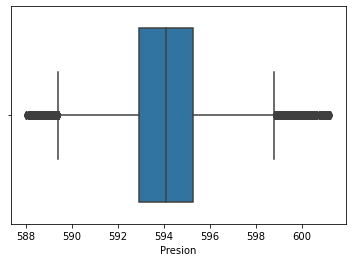

Estacion hospital_caldas


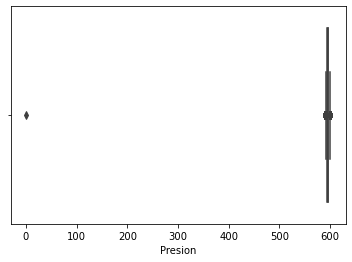

Estacion la_nubia


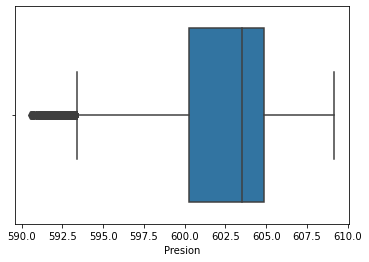

Estacion la_palma


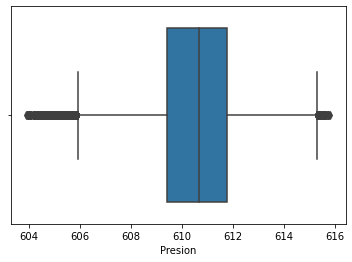

Estacion milan


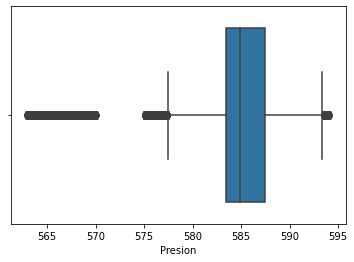

Estacion obs_vulcanologico


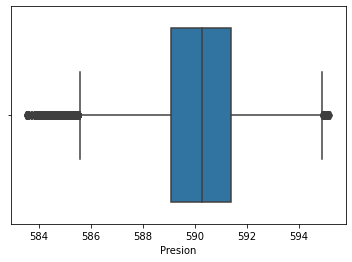

Estacion palogrande


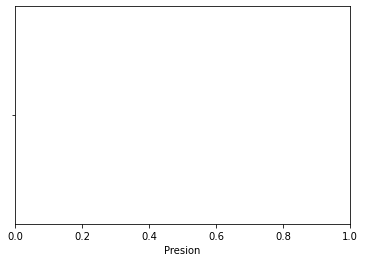

Estacion posgrados


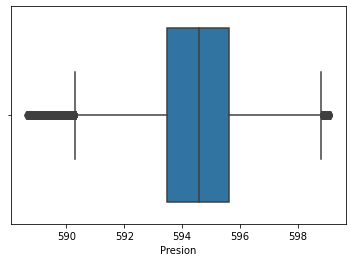

Estacion yarumos


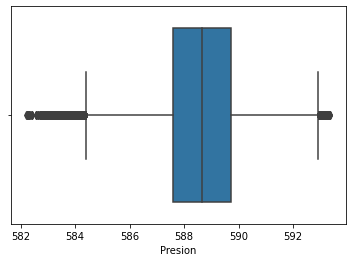

In [171]:
for i in datasets:
    print("Estacion", i.Estacion[0]) 
    sns.boxplot(x ="Presion", data = i) 
    plt.show() 
    

In [34]:
for i in datasets:
    print( "\n",i.Estacion[0])  
    print(i.Presion.min())
    print(i.Presion.max()) 


 alcazares
596.27
608.62

 aranjuez
601.12
615.22

 bosques_del_norte
586.23
597.86

 chec_uribe
605.62
618.33

 el_carmen
587.89
598.71

 emas
587.99
601.23

 hospital_caldas
0.0
600.13

 la_nubia
590.5
609.16

 la_palma
603.89
615.81

 milan
562.83
594.19

 obs_vulcanologico
583.51
595.22

 palogrande
nan
nan

 posgrados
588.6
599.12

 yarumos
582.19
593.37


In [28]:
hospital_caldas[hospital_caldas.Presion == 0].Presion.shape 

(1,)

In [24]:
n = 0
for i in datasets:
    promedio = i[(i.Presion != n)].Presion.mean()
    i["Presion"] = np.where((i.Presion == n), promedio, i["Presion"])
    

alcazares


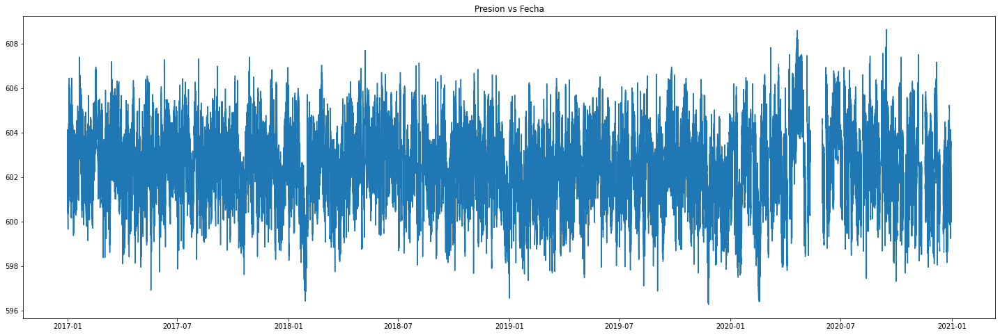

aranjuez


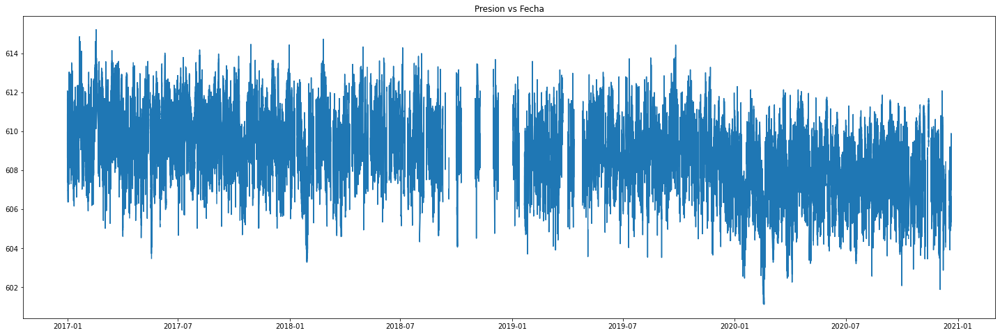

bosques_del_norte


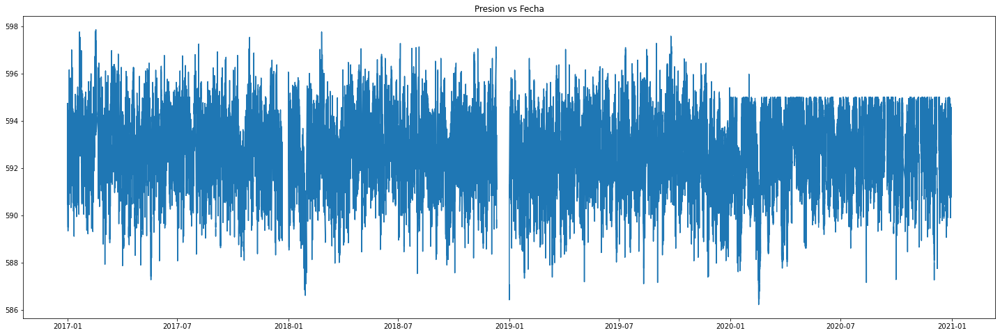

chec_uribe


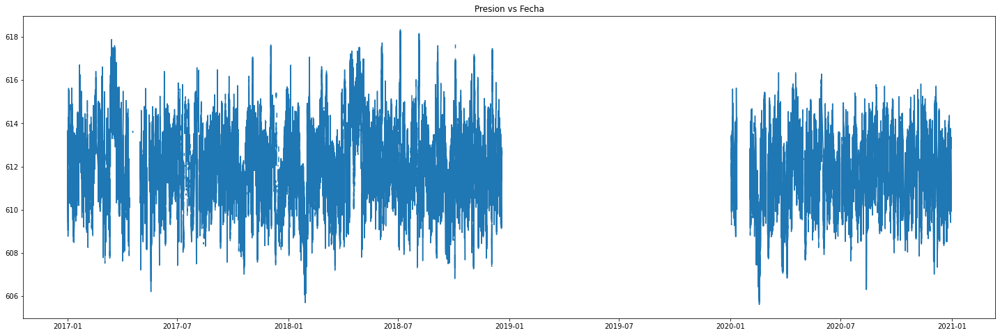

el_carmen


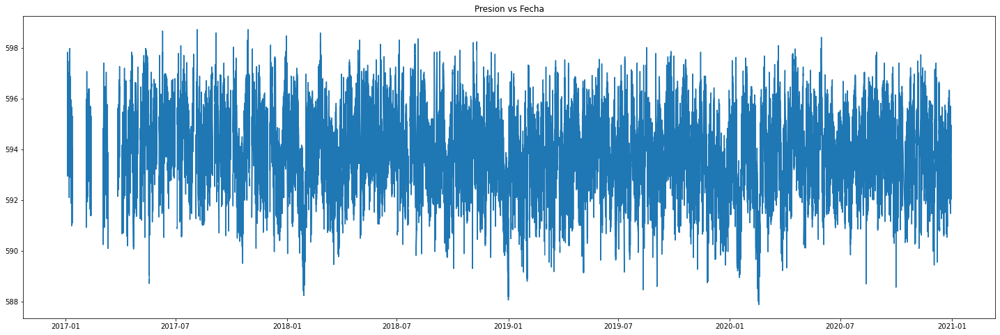

emas


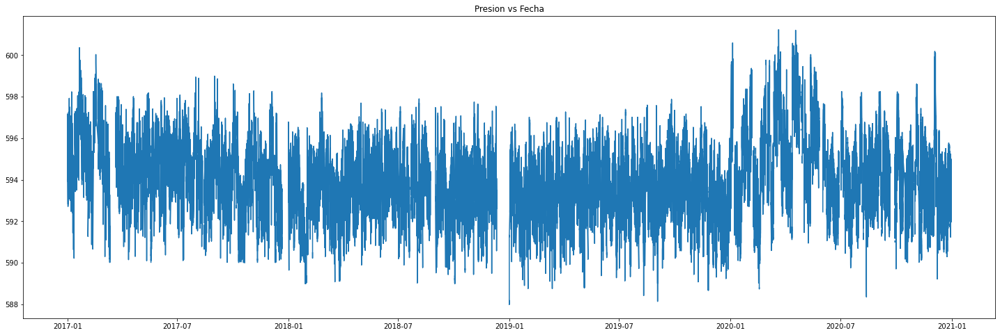

hospital_caldas


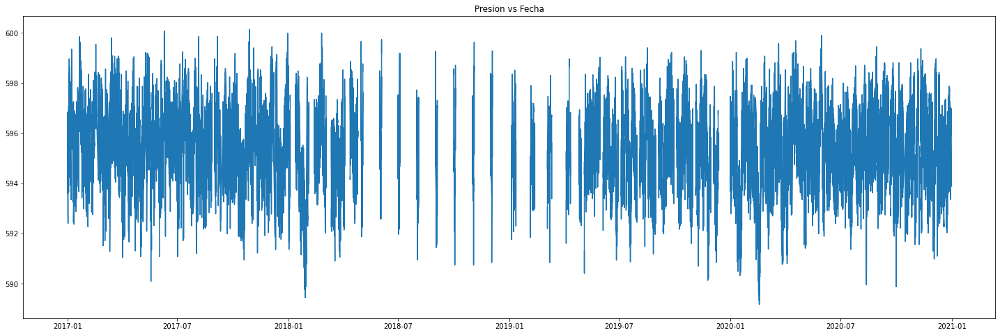

la_nubia


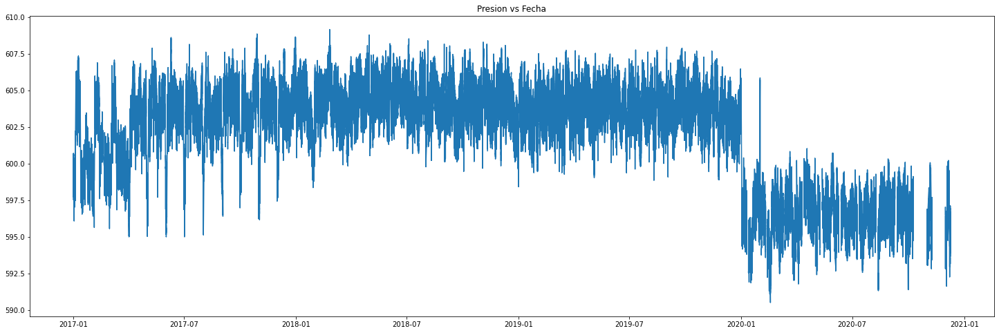

la_palma


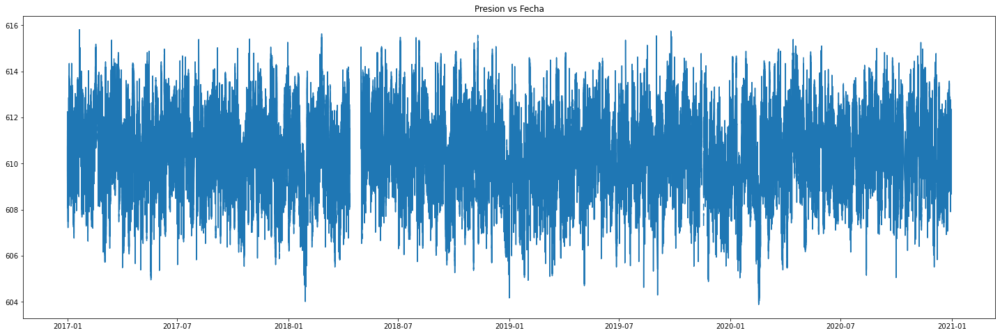

milan


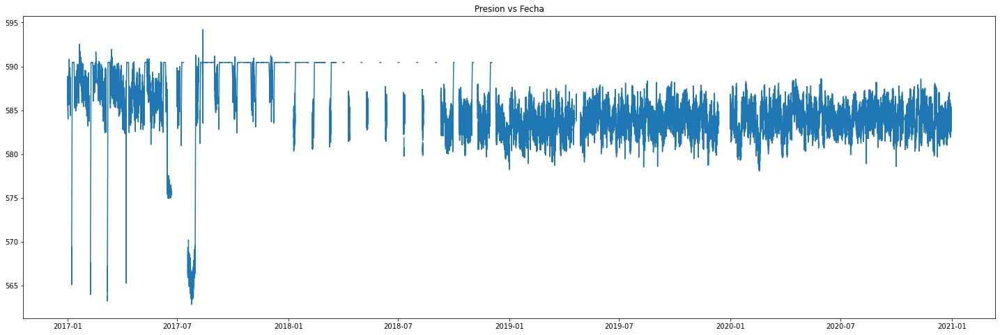

obs_vulcanologico


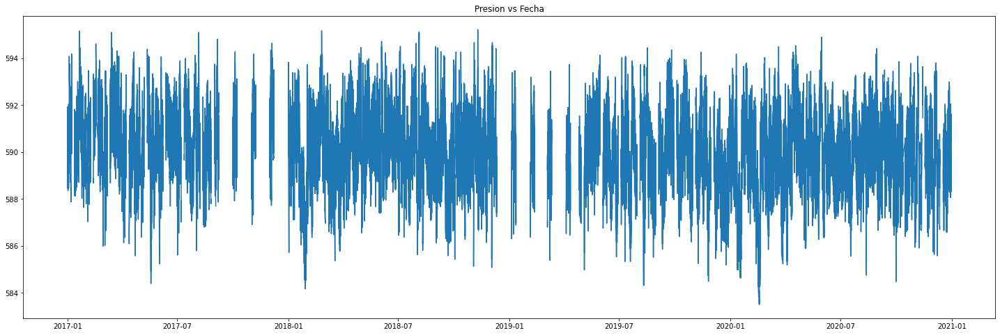

palogrande


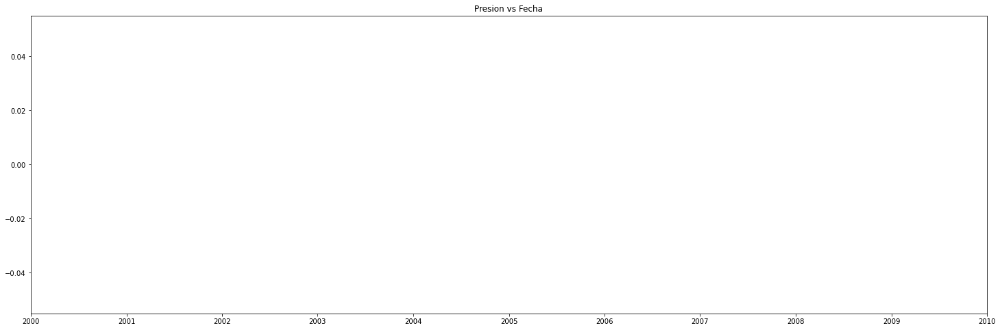

posgrados


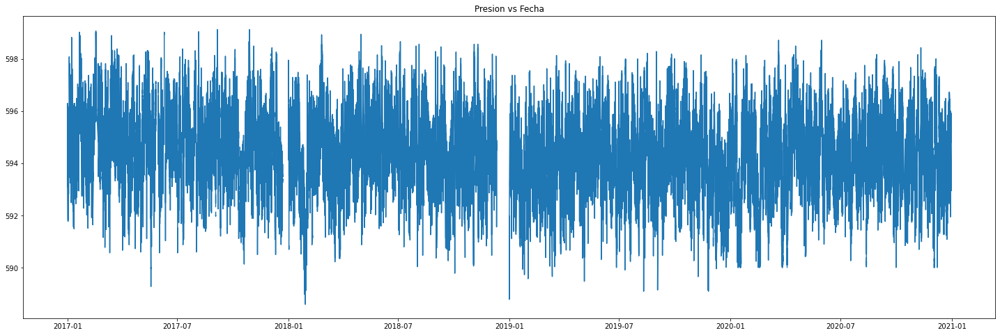

yarumos


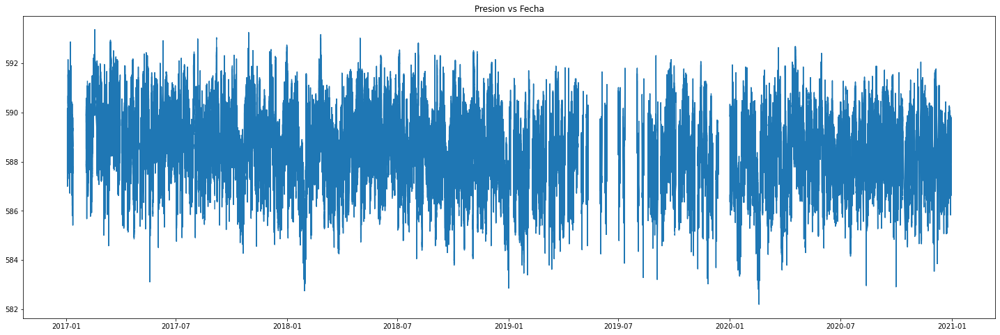

In [176]:
for i in datasets:   
    
    plt.figure(figsize=(25,8))
    print(i.Estacion[0])
    plt.plot(i.Fecha, i["Presion"]) 
    plt.title("Presion vs Fecha")  
    plt.show()

## Humedad

alcazares


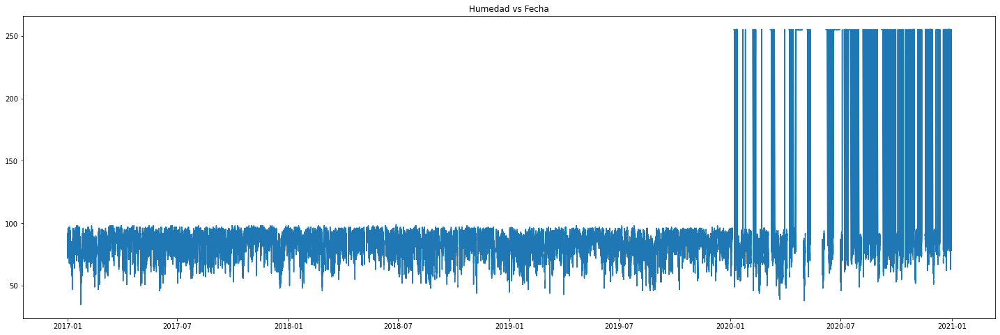

aranjuez


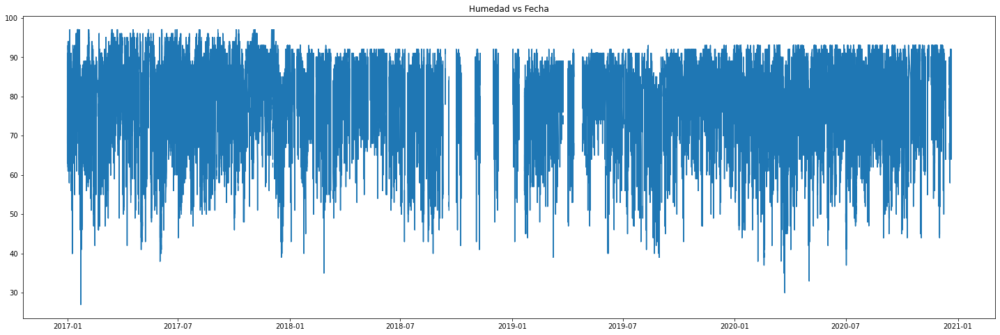

bosques_del_norte


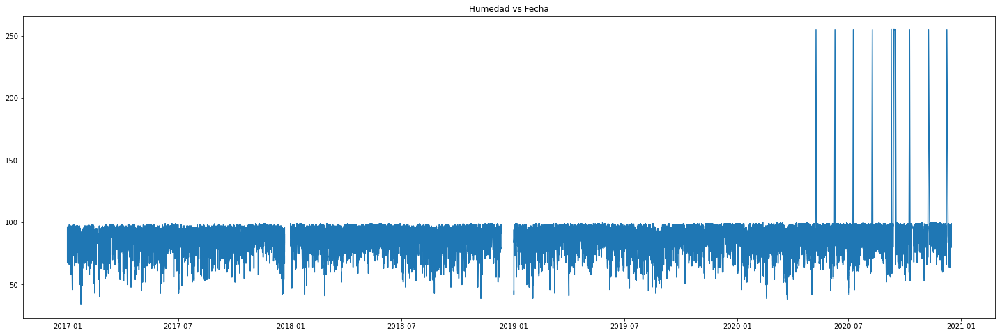

chec_uribe


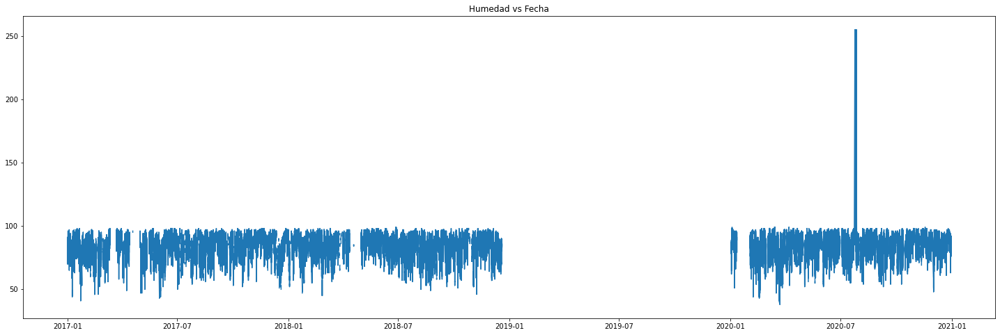

el_carmen


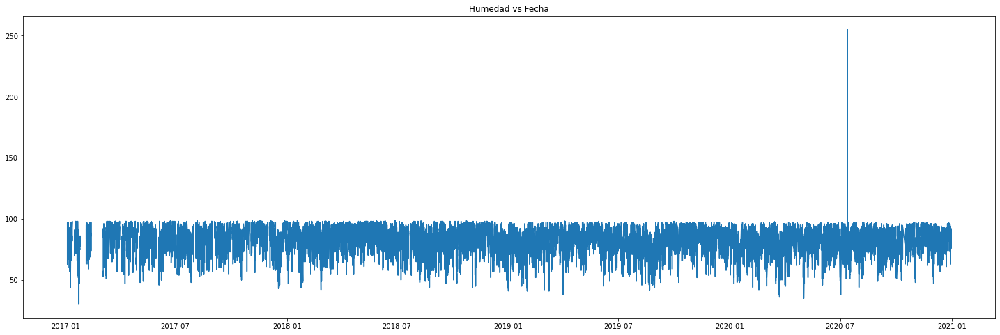

emas


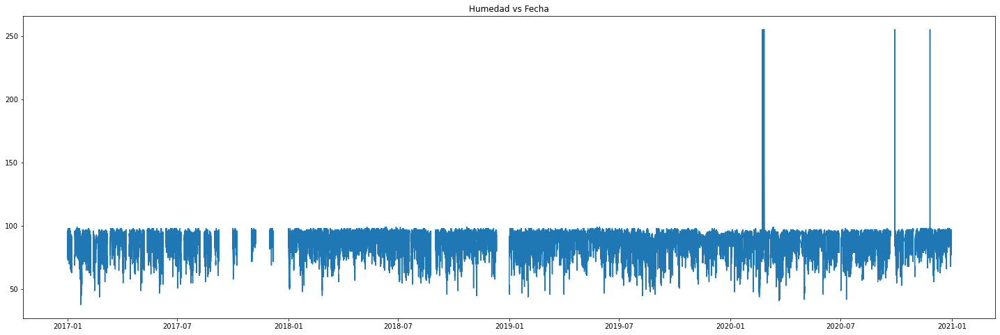

hospital_caldas


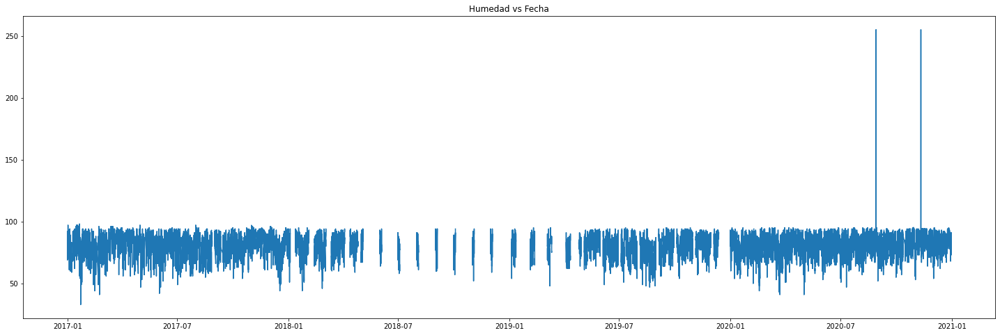

la_nubia


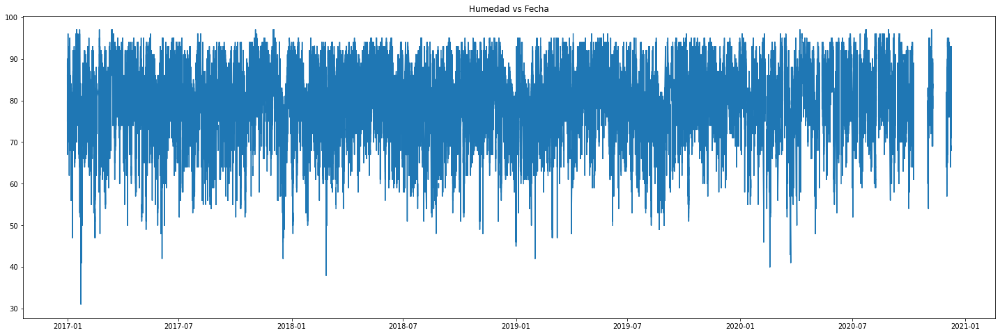

la_palma


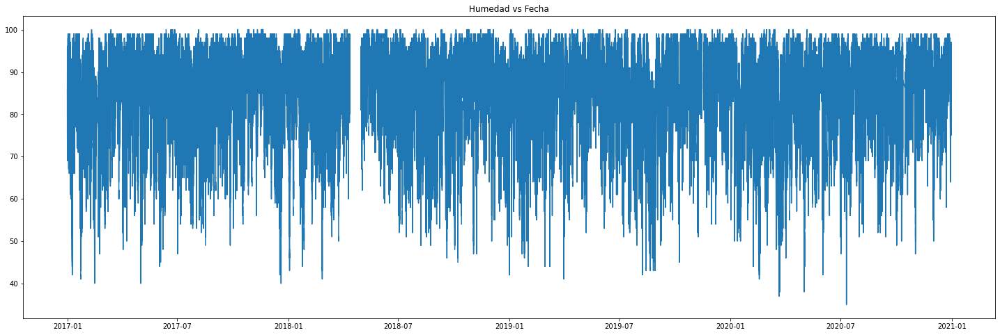

milan


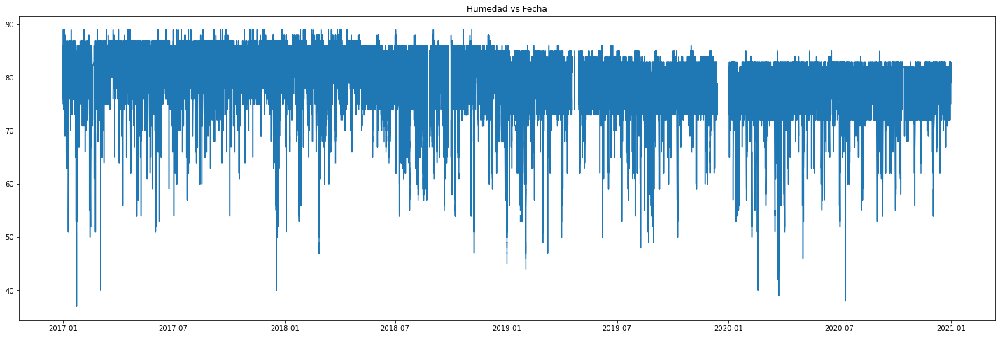

obs_vulcanologico


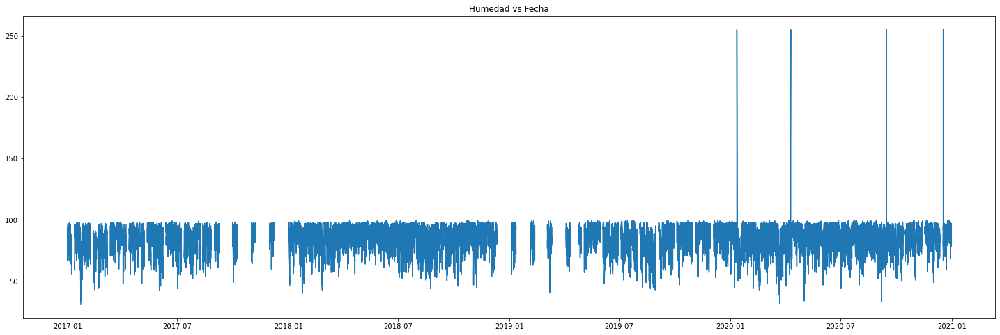

palogrande


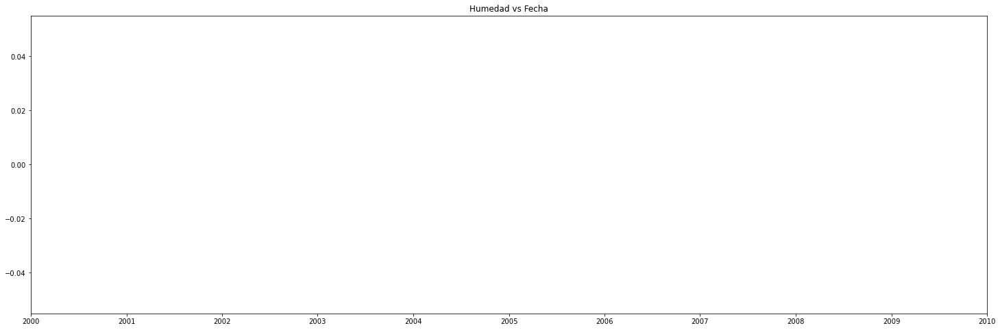

posgrados


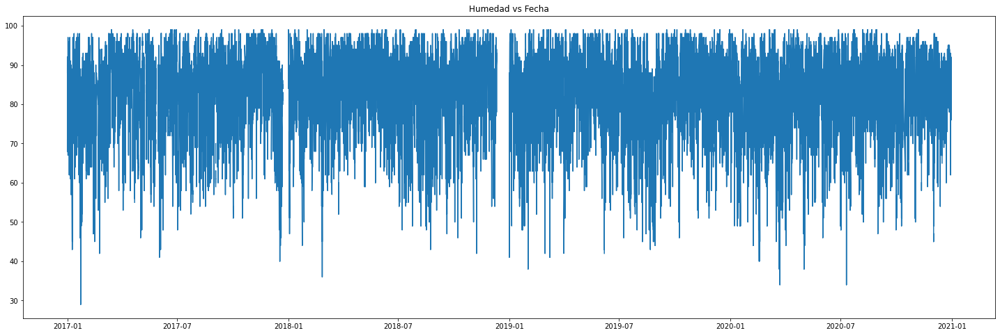

yarumos


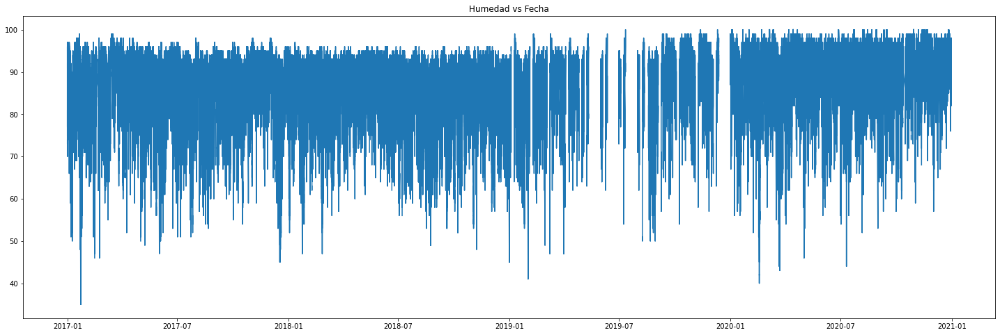

In [177]:
for i in datasets:   
    
    plt.figure(figsize=(25,8))
    print(i.Estacion[0])
    plt.plot(i.Fecha, i["Humedad"])  
    plt.title("Humedad vs Fecha")   
    plt.show()

In [180]:
for i in datasets:
    print( "\n",i.Estacion[0])  
    print(i[i.Humedad >100].Humedad.shape)  
   


 alcazares
(37626,)

 aranjuez
(0,)

 bosques_del_norte
(3415,)

 chec_uribe
(693,)

 el_carmen
(3,)

 emas
(21,)

 hospital_caldas
(2,)

 la_nubia
(0,)

 la_palma
(0,)

 milan
(0,)

 obs_vulcanologico
(242,)

 palogrande
(0,)

 posgrados
(0,)

 yarumos
(0,)


Estacion alcazares


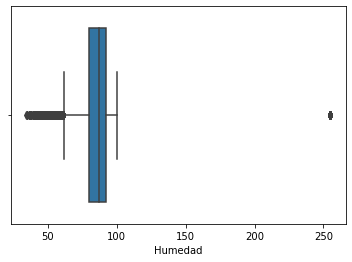

Estacion aranjuez


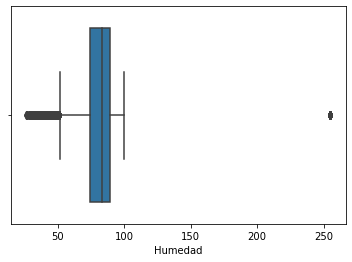

Estacion bosques_del_norte


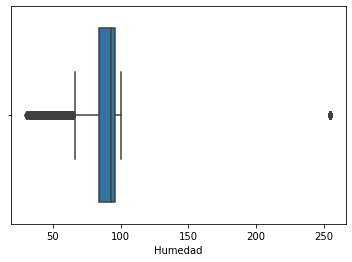

Estacion chec_uribe


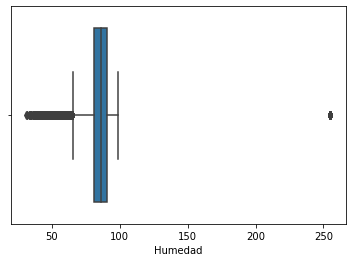

Estacion el_carmen


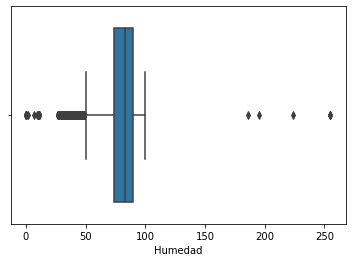

Estacion emas


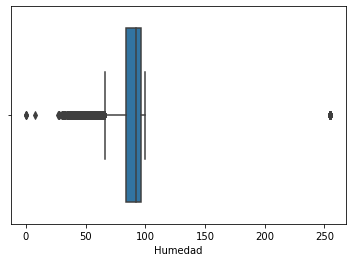

Estacion hospital_caldas


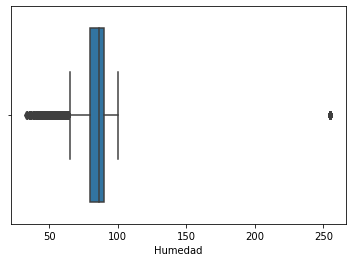

Estacion la_nubia


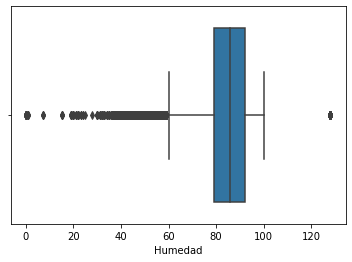

Estacion la_palma


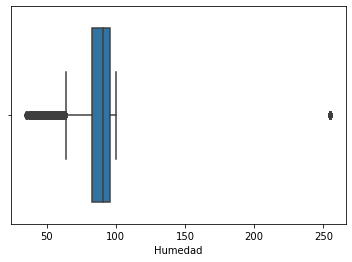

Estacion milan


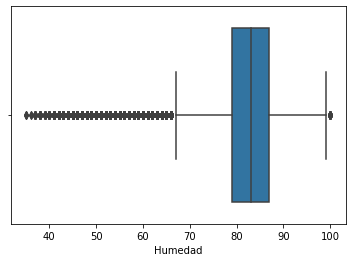

Estacion obs_vulcanologico


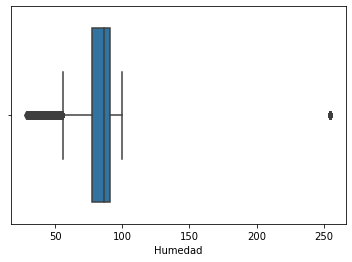

Estacion palogrande


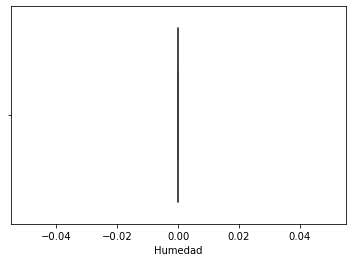

Estacion posgrados


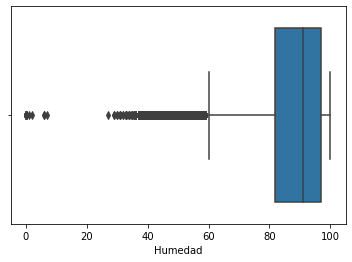

Estacion yarumos


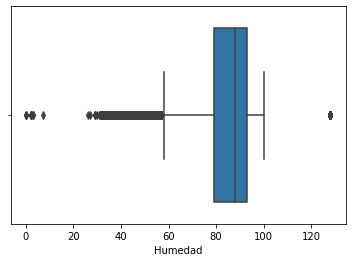

In [55]:
for i in datasets:
    print("Estacion", i.Estacion[0]) 
    sns.boxplot(x ='Humedad', data = i) 
    plt.show() 
    

**La humedad esta dada en un rango de 0 a 100 %, por lo tanto se reemplazara cualquier valor por encima.**

In [25]:
aranjuez.shape 

(411130, 13)

In [57]:
for i in datasets:
    print( "\n",i.Estacion[0])  
    print(i[i.Humedad > 100].shape)    


 alcazares
(38048, 13)

 aranjuez
(3591, 13)

 bosques_del_norte
(16616, 13)

 chec_uribe
(693, 13)

 el_carmen
(6, 13)

 emas
(32, 13)

 hospital_caldas
(876, 13)

 la_nubia
(34, 13)

 la_palma
(1914, 13)

 milan
(0, 13)

 obs_vulcanologico
(242, 13)

 palogrande
(0, 13)

 posgrados
(0, 13)

 yarumos
(51, 13)


In [197]:
example = alcazares.copy() 

In [145]:
e = example[(example.Fecha > "2020-01-01") & (example.Fecha < "2020-03-31") & (example.Temperatura <= n)].Temperatura.mean() 
e 

20.29776786510723

In [144]:
promedio = example[(example.Fecha > "2020-01-01") & (example.Fecha < "2020-03-31") & (example.Humedad <= 100)].Humedad.mean()
math.isnan(promedio) == False  

True

In [165]:
def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

In [198]:
1.0*np.array(example.Humedad)  

array([ 73.,  73.,  72., ..., 255.,  88., 255.])

In [199]:
len(example.Humedad) 

411513

In [200]:
m= np.mean(example.Humedad)
m 

101.36950830056217

In [201]:
se = np.std(example.Humedad, ddof=1) / np.sqrt(np.size(example.Humedad)) 

In [202]:
h = se * scipy.stats.t.ppf((1 + 0.95) / 2., n-1)
h 

0.1599122680507179

In [203]:
m+h 

101.52942056861289

In [26]:
n = 100
st = 1
step = 0.4
for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2017-01-01") & (i.Fecha < "2017-03-31") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Humedad"] = np.where((i.Fecha >= "2017-01-01") & (i.Fecha <= "2017-03-31") & (i.Humedad > n), promedio["valor"], i["Humedad"])

    promedio2 = i[(i.Fecha > "2017-04-01") & (i.Fecha < "2017-06-30") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Humedad"] = np.where((i.Fecha >= "2017-04-01") & (i.Fecha <= "2017-06-30") & (i.Humedad > n), promedio2["valor"], i["Humedad"])

    promedio3 = i[(i.Fecha > "2017-07-01") & (i.Fecha < "2017-09-30") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Humedad"] = np.where((i.Fecha >= "2017-07-01") & (i.Fecha <= "2017-09-30") & (i.Humedad > n), promedio3["valor"], i["Humedad"])

    promedio4 = i[(i.Fecha > "2017-10-01") & (i.Fecha < "2017-12-31") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Humedad"] = np.where((i.Fecha >= "2017-10-01") & (i.Fecha <= "2017-12-31") & (i.Humedad > n), promedio4["valor"], i["Humedad"])

n = 100
st = 1
step = 0.4
for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2018-01-01") & (i.Fecha < "2018-03-31") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Humedad"] = np.where((i.Fecha >= "2018-01-01") & (i.Fecha <= "2018-03-31") & (i.Humedad > n), promedio["valor"], i["Humedad"])

    promedio2 = i[(i.Fecha > "2018-04-01") & (i.Fecha < "2018-06-30") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Humedad"] = np.where((i.Fecha >= "2018-04-01") & (i.Fecha <= "2018-06-30") & (i.Humedad > n), promedio2["valor"], i["Humedad"])

    promedio3 = i[(i.Fecha > "2018-07-01") & (i.Fecha < "2018-09-30") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Humedad"] = np.where((i.Fecha >= "2018-07-01") & (i.Fecha <= "2018-09-30") & (i.Humedad > n), promedio3["valor"], i["Humedad"])

    promedio4 = i[(i.Fecha > "2018-10-01") & (i.Fecha < "2018-12-31") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Humedad"] = np.where((i.Fecha >= "2018-10-01") & (i.Fecha <= "2018-12-31") & (i.Humedad > n), promedio4["valor"], i["Humedad"])
            
n = 100
st = 1
step = 0.4
for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2019-01-01") & (i.Fecha < "2019-03-31") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Humedad"] = np.where((i.Fecha >= "2019-01-01") & (i.Fecha <= "2019-03-31") & (i.Humedad > n), promedio["valor"], i["Humedad"])

    promedio2 = i[(i.Fecha > "2019-04-01") & (i.Fecha < "2019-06-30") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Humedad"] = np.where((i.Fecha >= "2019-04-01") & (i.Fecha <= "2019-06-30") & (i.Humedad > n), promedio2["valor"], i["Humedad"])

    promedio3 = i[(i.Fecha > "2019-07-01") & (i.Fecha < "2019-09-30") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Humedad"] = np.where((i.Fecha >= "2019-07-01") & (i.Fecha <= "2019-09-30") & (i.Humedad > n), promedio3["valor"], i["Humedad"])

    promedio4 = i[(i.Fecha > "2019-10-01") & (i.Fecha < "2019-12-31") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Humedad"] = np.where((i.Fecha >= "2019-10-01") & (i.Fecha <= "2019-12-31") & (i.Humedad > n), promedio4["valor"], i["Humedad"])
            
n = 100
st = 1
step = 0.4
for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2020-01-01") & (i.Fecha < "2020-03-31") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Humedad"] = np.where((i.Fecha >= "2020-01-01") & (i.Fecha <= "2020-03-31") & (i.Humedad > n), promedio["valor"], i["Humedad"])

    promedio2 = i[(i.Fecha > "2020-04-01") & (i.Fecha < "2020-06-30") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Humedad"] = np.where((i.Fecha >= "2020-04-01") & (i.Fecha <= "2020-06-30") & (i.Humedad > n), promedio2["valor"], i["Humedad"])

    promedio3 = i[(i.Fecha > "2020-07-01") & (i.Fecha < "2020-09-30") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Humedad"] = np.where((i.Fecha >= "2020-07-01") & (i.Fecha <= "2020-09-30") & (i.Humedad > n), promedio3["valor"], i["Humedad"])

    promedio4 = i[(i.Fecha > "2020-10-01") & (i.Fecha < "2020-12-31") & (i.Humedad <= n)].Humedad.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Humedad"] = np.where((i.Fecha >= "2020-10-01") & (i.Fecha <= "2020-12-31") & (i.Humedad > n), promedio4["valor"], i["Humedad"])

alcazares


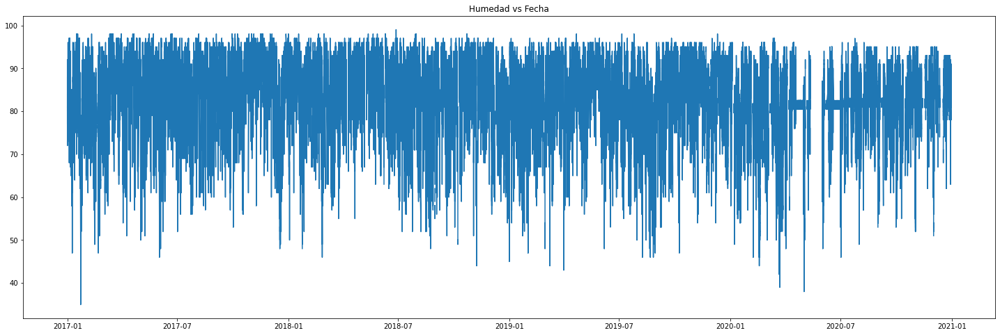

aranjuez


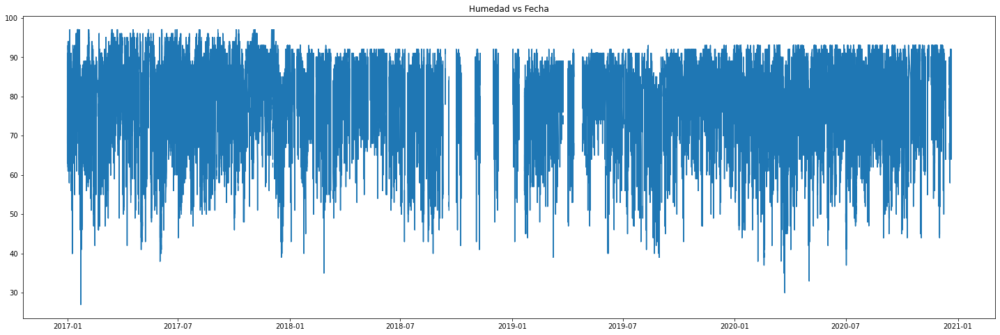

bosques_del_norte


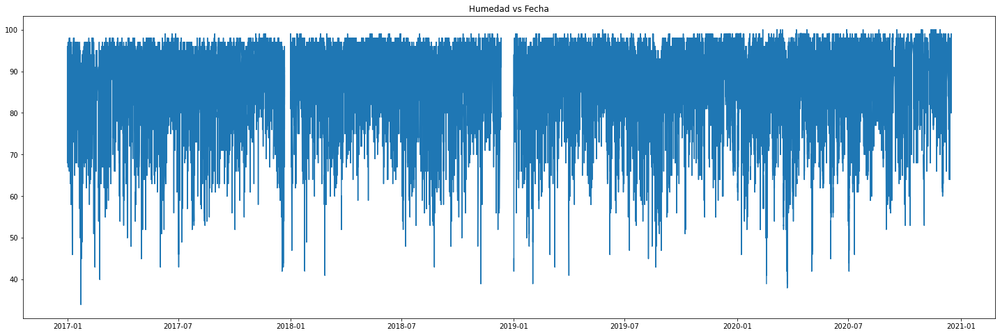

chec_uribe


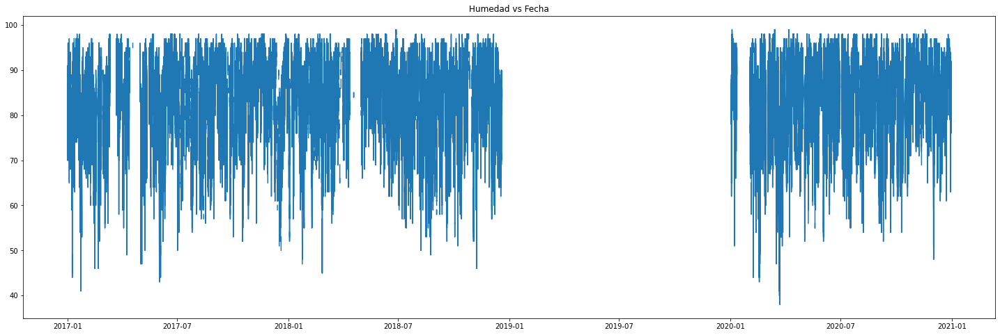

el_carmen


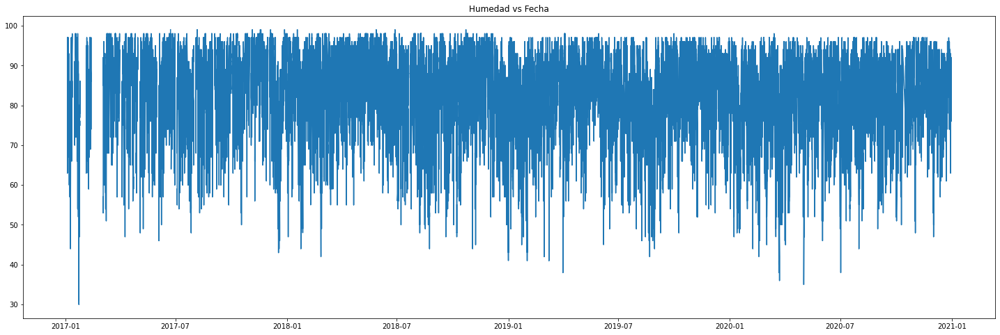

emas


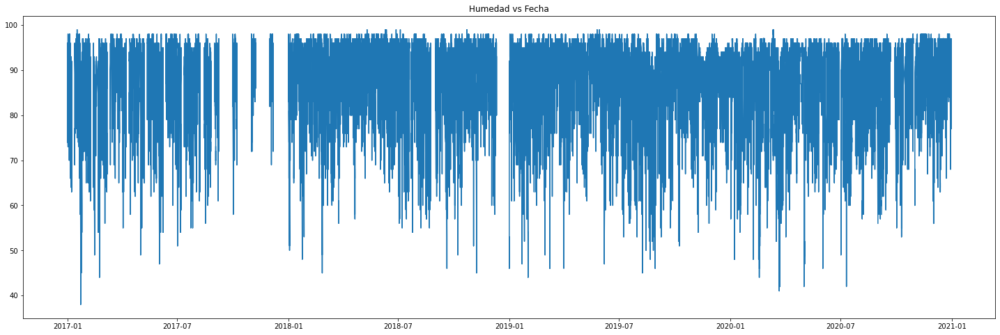

hospital_caldas


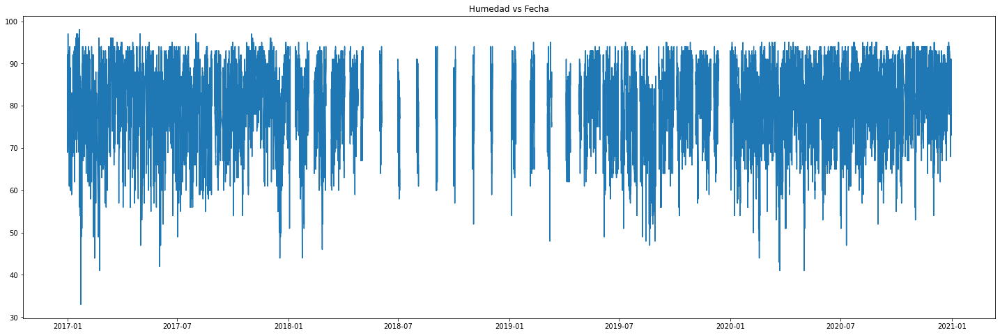

la_nubia


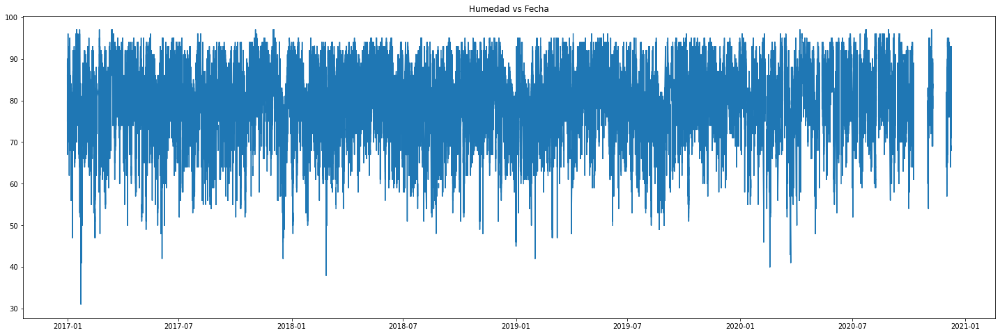

la_palma


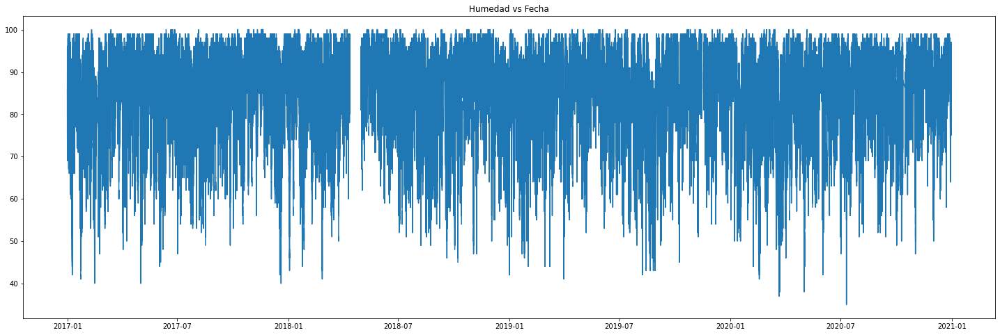

milan


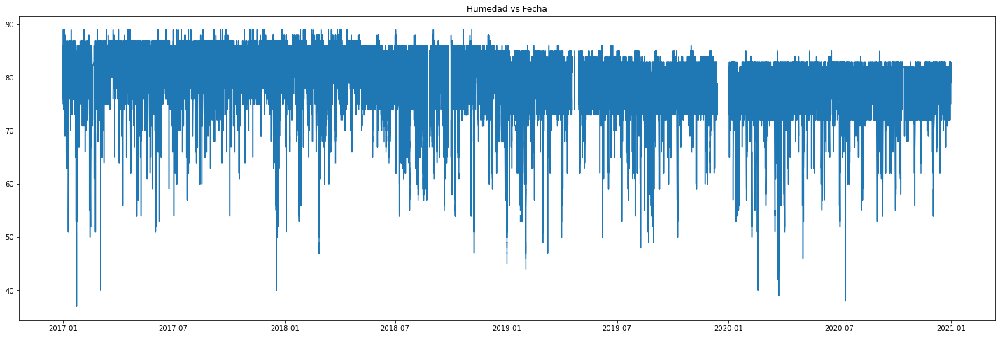

obs_vulcanologico


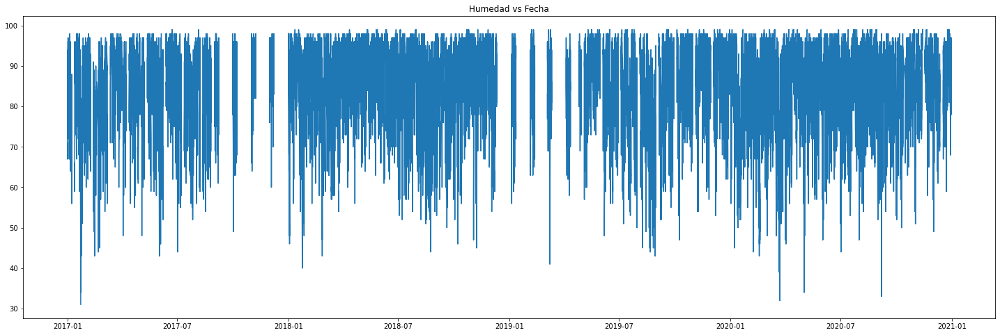

palogrande


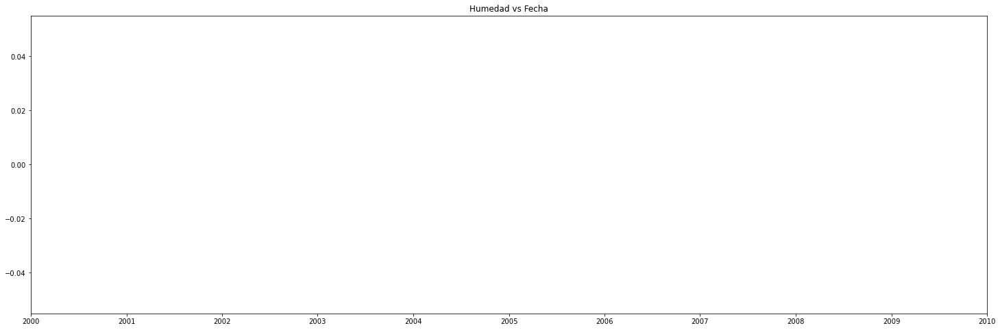

posgrados


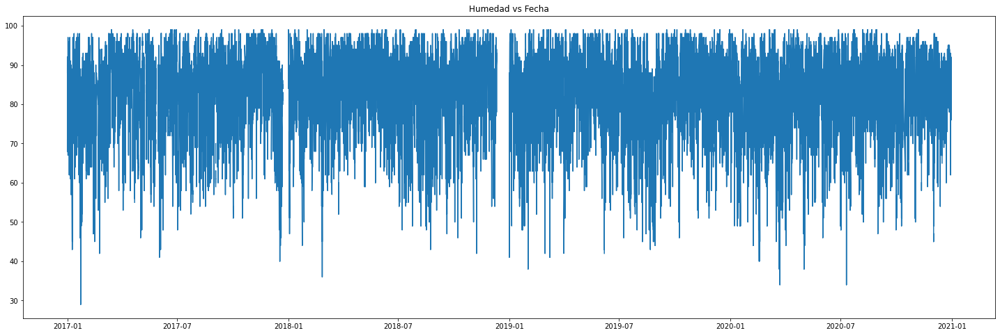

yarumos


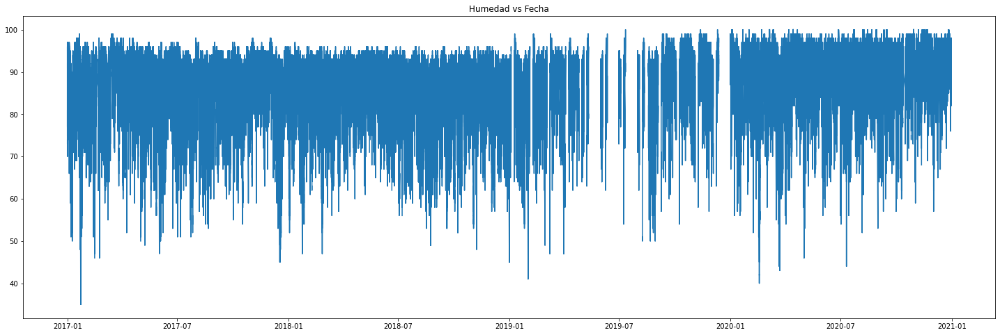

In [213]:
for i in datasets:   
    
    plt.figure(figsize=(25,8))
    print(i.Estacion[0])
    plt.plot(i.Fecha, i["Humedad"])  
    plt.title("Humedad vs Fecha")   
    plt.show()

## Radiacion

alcazares


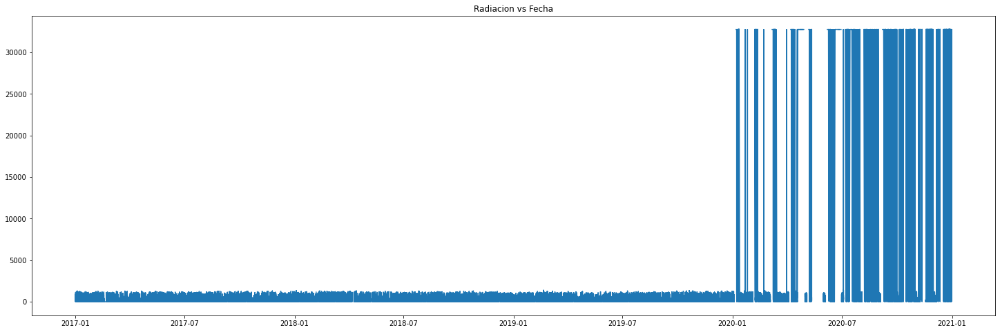

aranjuez


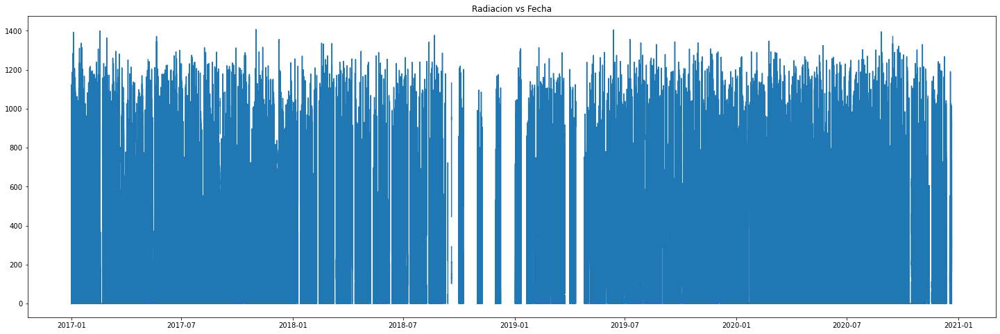

bosques_del_norte


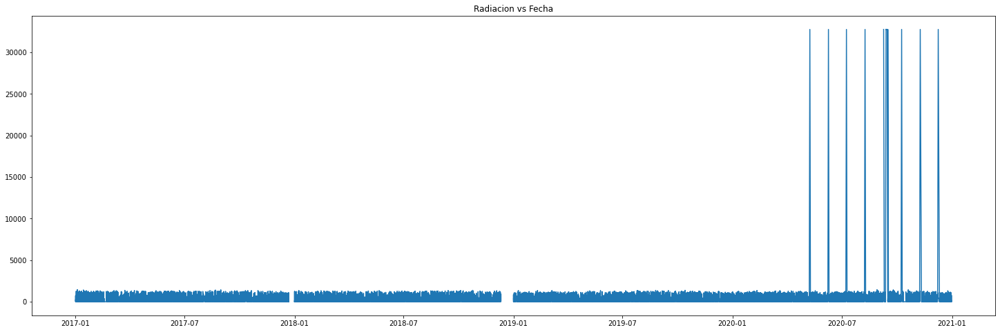

chec_uribe


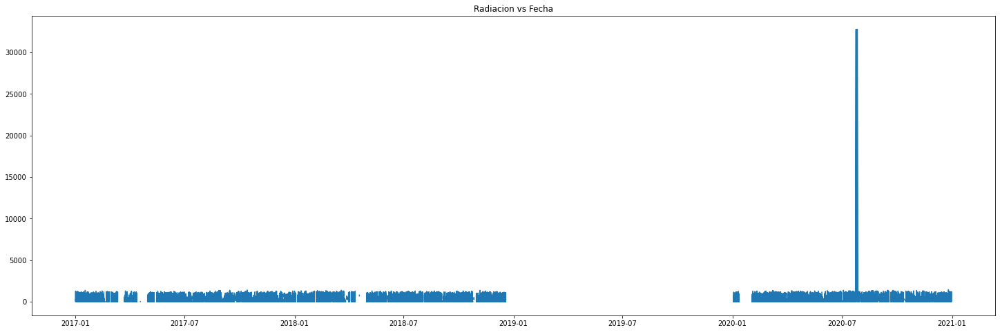

el_carmen


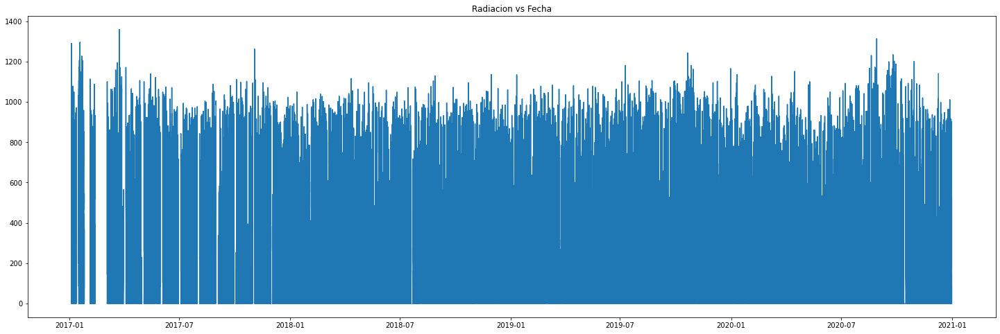

emas


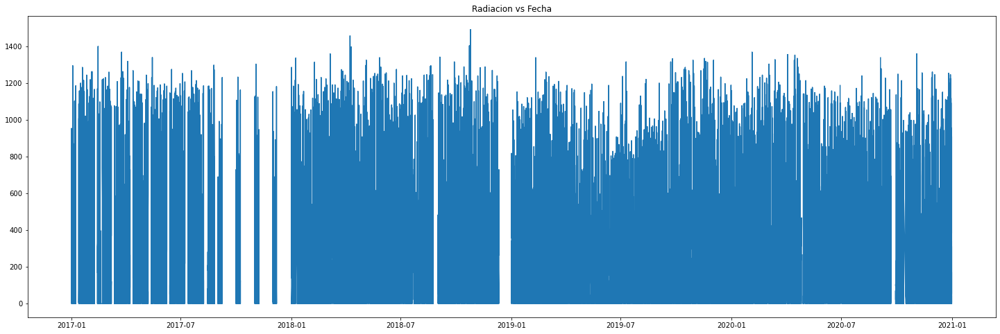

hospital_caldas


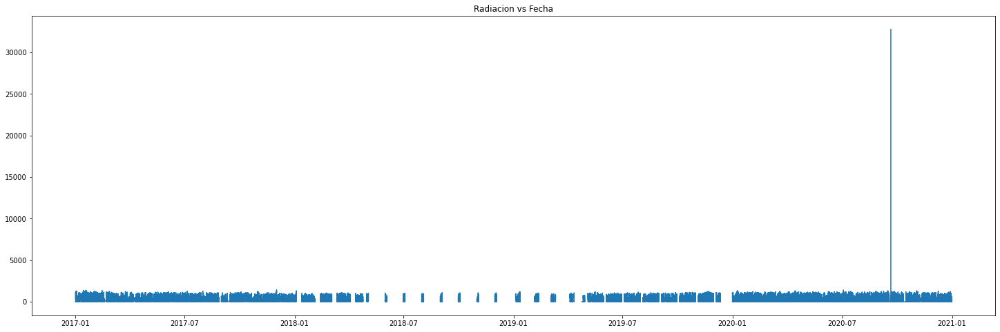

la_nubia


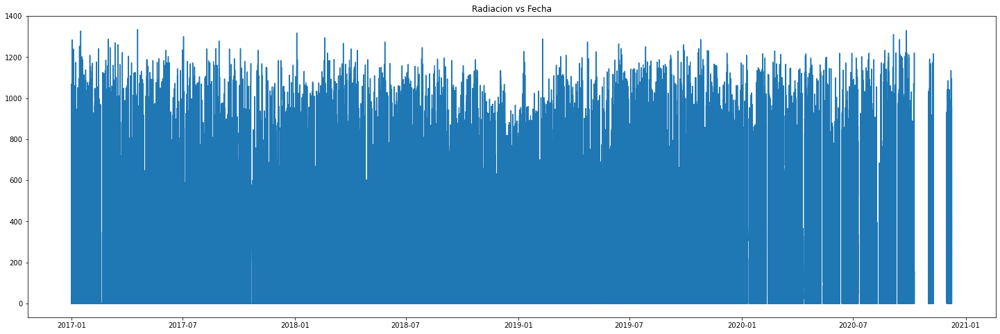

la_palma


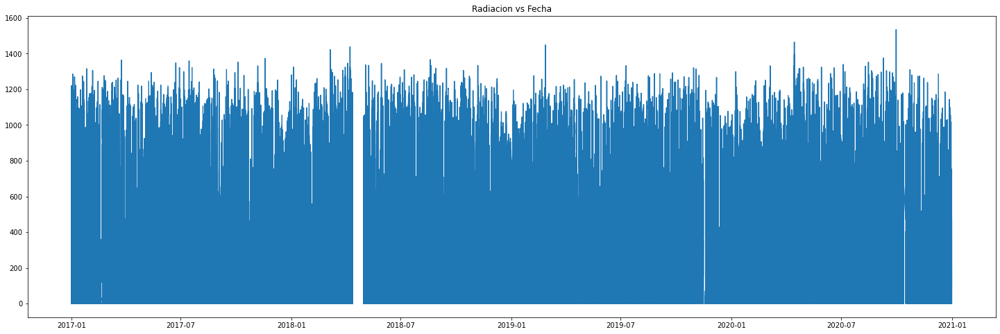

milan


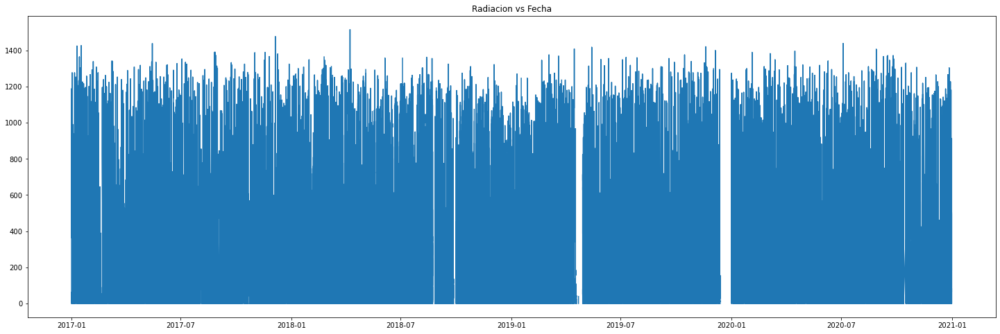

obs_vulcanologico


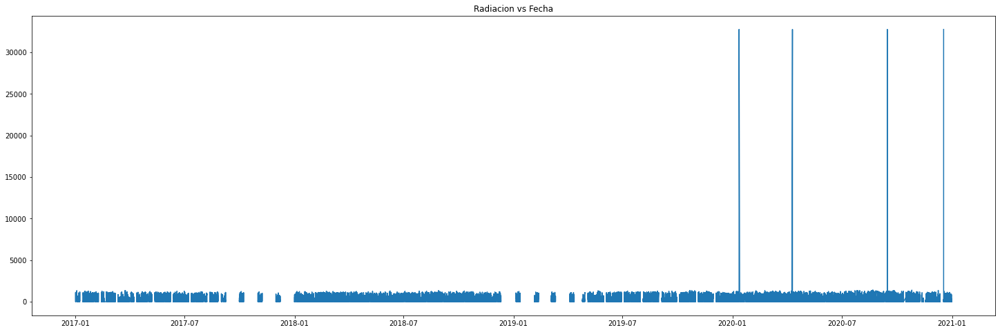

palogrande


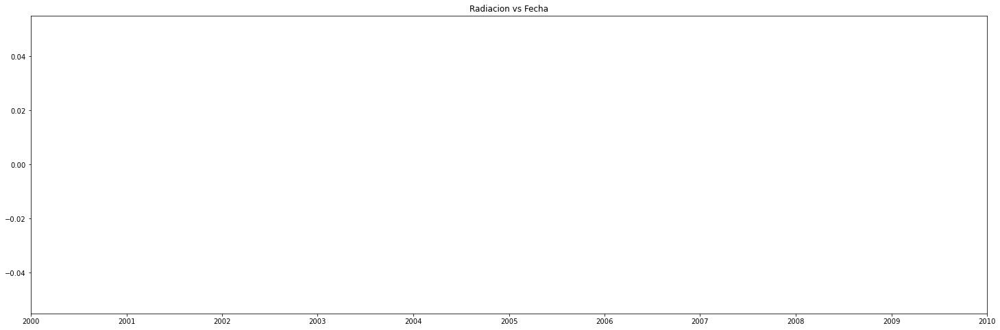

posgrados


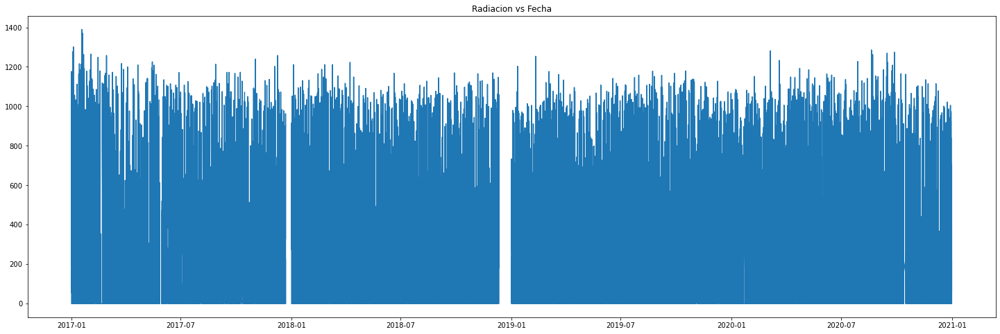

yarumos


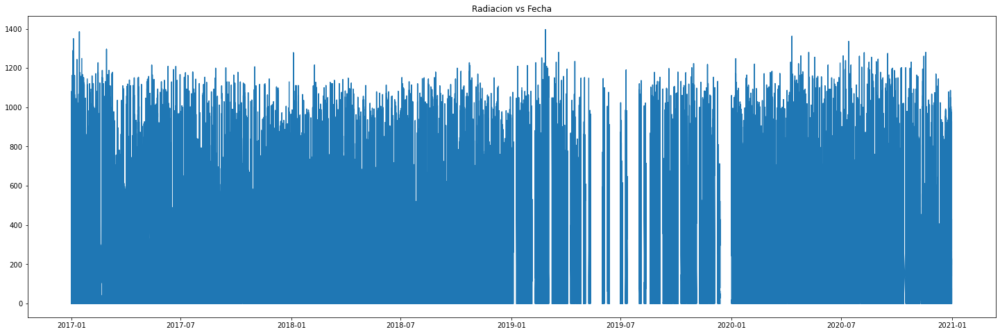

In [34]:
for i in datasets:   
    
    plt.figure(figsize=(25,8))
    print(i.Estacion[0])
    plt.plot(i.Fecha, i["Radiacion"])  
    plt.title("Radiacion vs Fecha")    
    plt.show()

In [27]:
n = 1500
st = 100
step = 0.4
for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2017-01-01") & (i.Fecha < "2017-03-31") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Radiacion"] = np.where((i.Fecha >= "2017-01-01") & (i.Fecha <= "2017-03-31") & (i.Radiacion > n), promedio["valor"], i["Radiacion"])

    promedio2 = i[(i.Fecha > "2017-04-01") & (i.Fecha < "2017-06-30") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Radiacion"] = np.where((i.Fecha >= "2017-04-01") & (i.Fecha <= "2017-06-30") & (i.Radiacion > n), promedio2["valor"], i["Radiacion"])

    promedio3 = i[(i.Fecha > "2017-07-01") & (i.Fecha < "2017-09-30") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Radiacion"] = np.where((i.Fecha >= "2017-07-01") & (i.Fecha <= "2017-09-30") & (i.Radiacion > n), promedio3["valor"], i["Radiacion"])

    promedio4 = i[(i.Fecha > "2017-10-01") & (i.Fecha < "2017-12-31") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Radiacion"] = np.where((i.Fecha >= "2017-10-01") & (i.Fecha <= "2017-12-31") & (i.Radiacion > n), promedio4["valor"], i["Radiacion"])


for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2018-01-01") & (i.Fecha < "2018-03-31") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Radiacion"] = np.where((i.Fecha >= "2018-01-01") & (i.Fecha <= "2018-03-31") & (i.Radiacion > n), promedio["valor"], i["Radiacion"])

    promedio2 = i[(i.Fecha > "2018-04-01") & (i.Fecha < "2018-06-30") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Radiacion"] = np.where((i.Fecha >= "2018-04-01") & (i.Fecha <= "2018-06-30") & (i.Radiacion > n), promedio2["valor"], i["Radiacion"])

    promedio3 = i[(i.Fecha > "2018-07-01") & (i.Fecha < "2018-09-30") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Radiacion"] = np.where((i.Fecha >= "2018-07-01") & (i.Fecha <= "2018-09-30") & (i.Radiacion > n), promedio3["valor"], i["Radiacion"])

    promedio4 = i[(i.Fecha > "2018-10-01") & (i.Fecha < "2018-12-31") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Radiacion"] = np.where((i.Fecha >= "2018-10-01") & (i.Fecha <= "2018-12-31") & (i.Radiacion > n), promedio4["valor"], i["Radiacion"])
            

for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2019-01-01") & (i.Fecha < "2019-03-31") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Radiacion"] = np.where((i.Fecha >= "2019-01-01") & (i.Fecha <= "2019-03-31") & (i.Radiacion > n), promedio["valor"], i["Radiacion"])

    promedio2 = i[(i.Fecha > "2019-04-01") & (i.Fecha < "2019-06-30") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Radiacion"] = np.where((i.Fecha >= "2019-04-01") & (i.Fecha <= "2019-06-30") & (i.Radiacion > n), promedio2["valor"], i["Radiacion"])

    promedio3 = i[(i.Fecha > "2019-07-01") & (i.Fecha < "2019-09-30") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Radiacion"] = np.where((i.Fecha >= "2019-07-01") & (i.Fecha <= "2019-09-30") & (i.Radiacion > n), promedio3["valor"], i["Radiacion"])

    promedio4 = i[(i.Fecha > "2019-10-01") & (i.Fecha < "2019-12-31") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Radiacion"] = np.where((i.Fecha >= "2019-10-01") & (i.Fecha <= "2019-12-31") & (i.Radiacion > n), promedio4["valor"], i["Radiacion"])

for i in datasets: 
    e = len(i)
    promedio = i[(i.Fecha > "2020-01-01") & (i.Fecha < "2020-03-31") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio) == False :
        if promedio != 0:
            random.seed(42)
            promedio = [randrange_float(promedio-st, promedio +st, step) for p in range(e)]
            promedio = np.round(promedio,1) 
            promedio = pd.DataFrame(promedio, columns={"valor"})   
            i["Radiacion"] = np.where((i.Fecha >= "2020-01-01") & (i.Fecha <= "2020-03-31") & (i.Radiacion > n), promedio["valor"], i["Radiacion"])

    promedio2 = i[(i.Fecha > "2020-04-01") & (i.Fecha < "2020-06-30") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio2) == False:
        if promedio2 != 0:
            random.seed(42)
            promedio2 = [randrange_float(promedio2-st, promedio2 +st, step) for p in range(e)]
            promedio2 = np.round(promedio2,1) 
            promedio2 = pd.DataFrame(promedio2, columns={"valor"}) 
            i["Radiacion"] = np.where((i.Fecha >= "2020-04-01") & (i.Fecha <= "2020-06-30") & (i.Radiacion > n), promedio2["valor"], i["Radiacion"])

    promedio3 = i[(i.Fecha > "2020-07-01") & (i.Fecha < "2020-09-30") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio3) == False :
        if promedio3 != 0:
            random.seed(42)
            promedio3 = [randrange_float(promedio3-st, promedio3 +st, step) for p in range(e)]
            promedio3 = np.round(promedio3,1) 
            promedio3 = pd.DataFrame(promedio3, columns={"valor"})  
            i["Radiacion"] = np.where((i.Fecha >= "2020-07-01") & (i.Fecha <= "2020-09-30") & (i.Radiacion > n), promedio3["valor"], i["Radiacion"])

    promedio4 = i[(i.Fecha > "2020-10-01") & (i.Fecha < "2020-12-31") & (i.Radiacion <= n)].Radiacion.mean()
    if math.isnan(promedio4) == False :
        if promedio4 != 0:
            random.seed(42)
            promedio4 = [randrange_float(promedio4-st, promedio4 +st, step) for p in range(e)]
            promedio4 = np.round(promedio4,1) 
            promedio4 = pd.DataFrame(promedio4, columns={"valor"}) 
            i["Radiacion"] = np.where((i.Fecha >= "2020-10-01") & (i.Fecha <= "2020-12-31") & (i.Radiacion > n), promedio4["valor"], i["Radiacion"])

alcazares


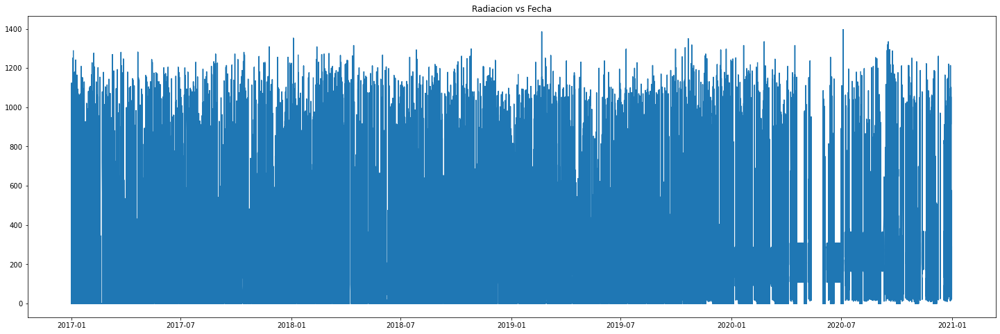

aranjuez


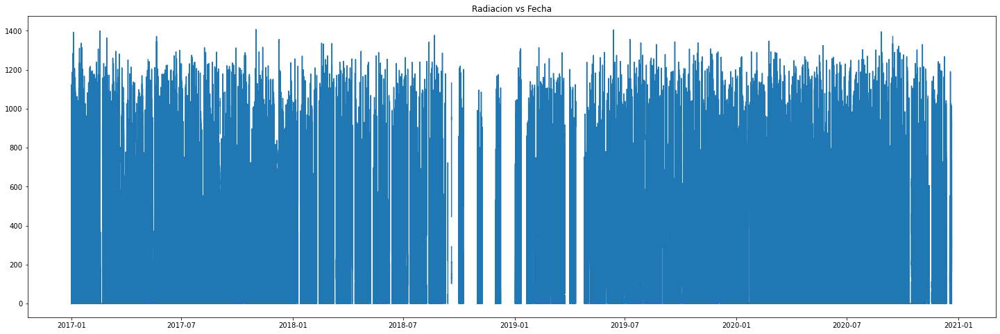

bosques_del_norte


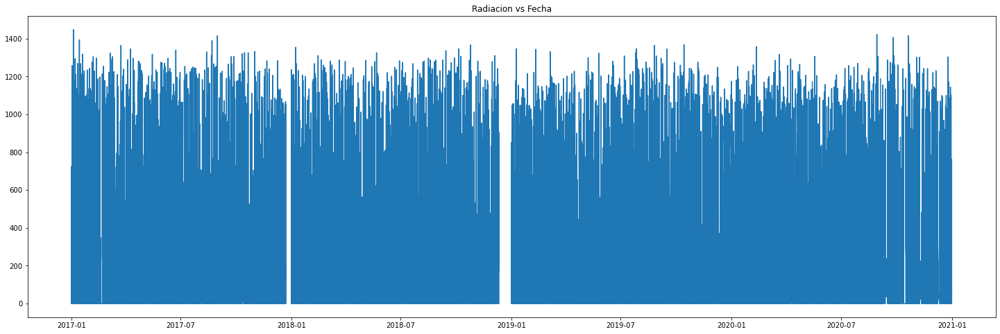

chec_uribe


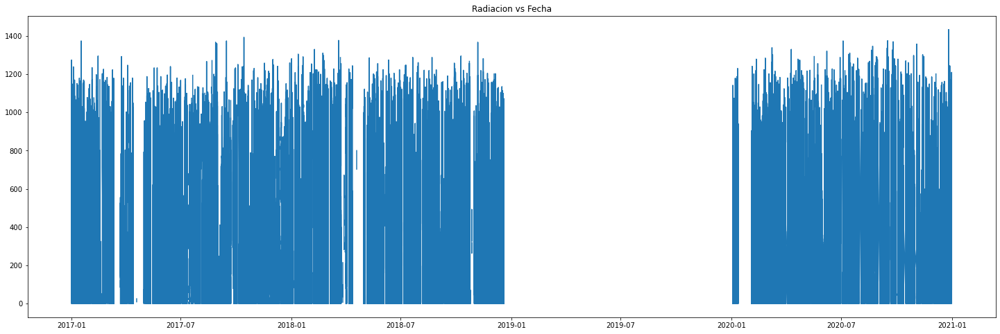

el_carmen


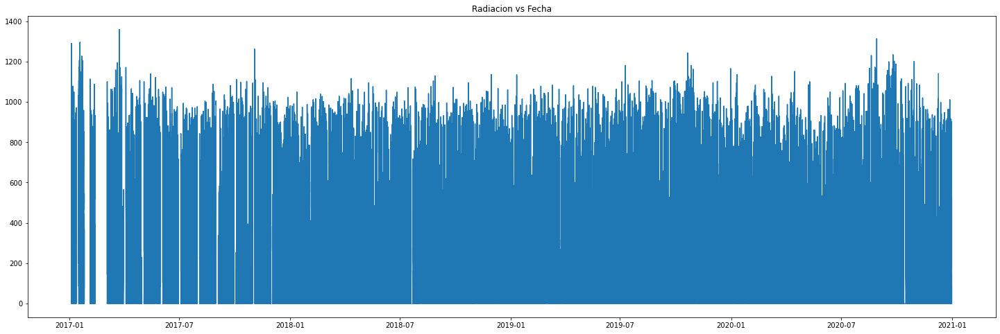

emas


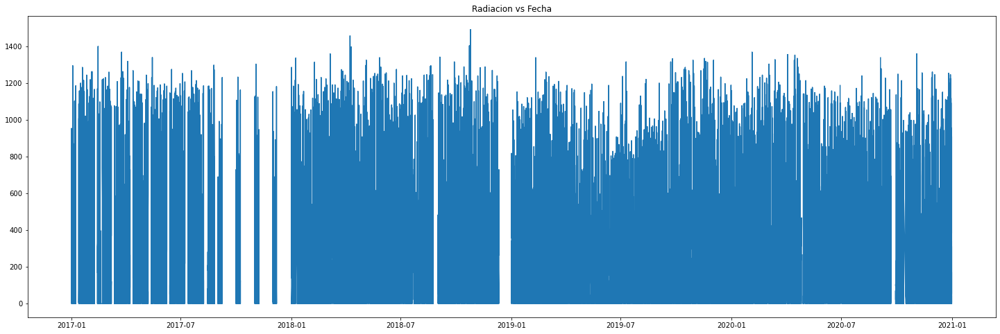

hospital_caldas


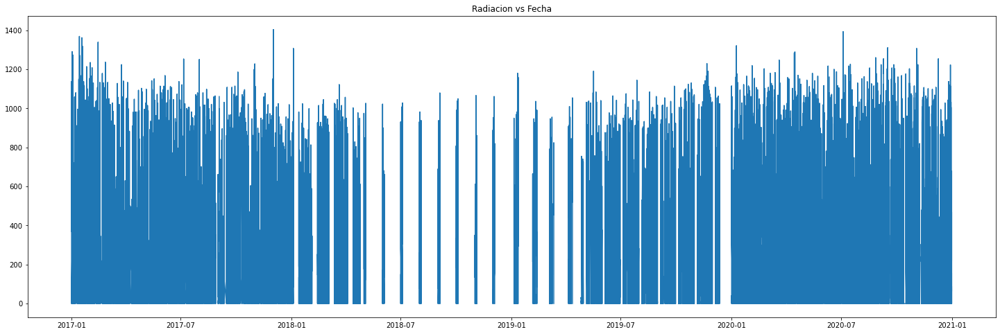

la_nubia


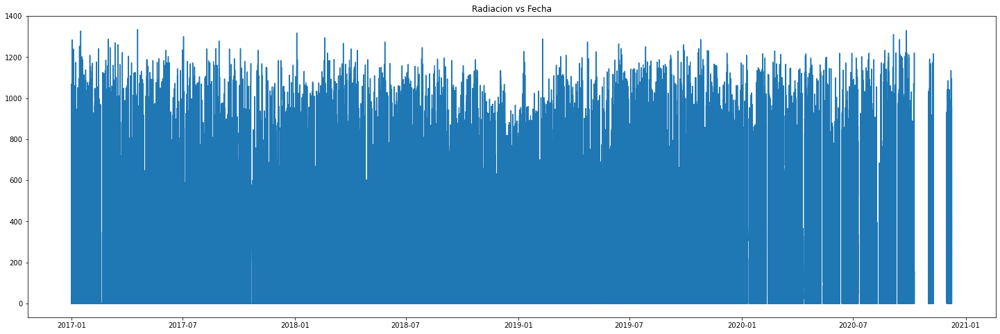

la_palma


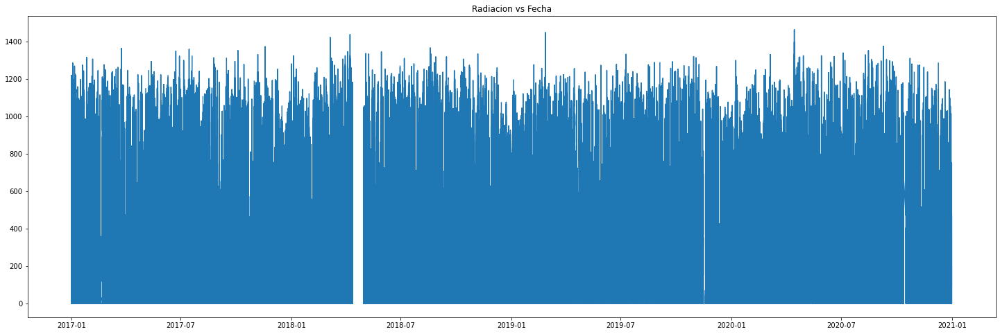

milan


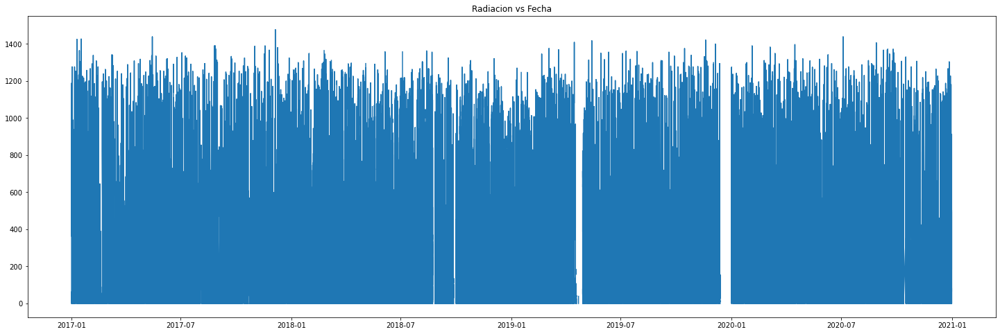

obs_vulcanologico


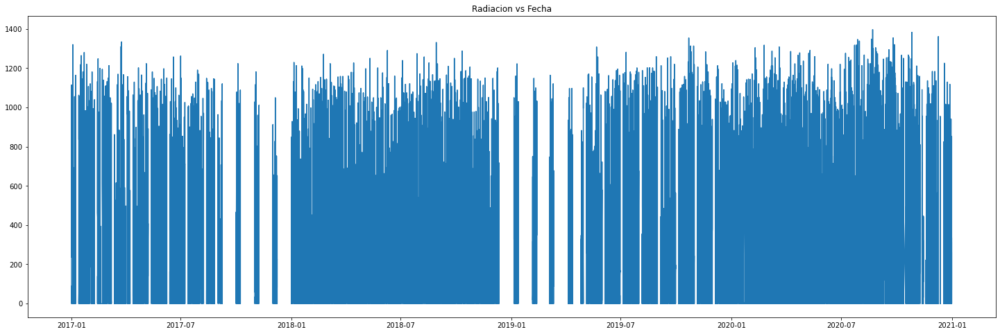

palogrande


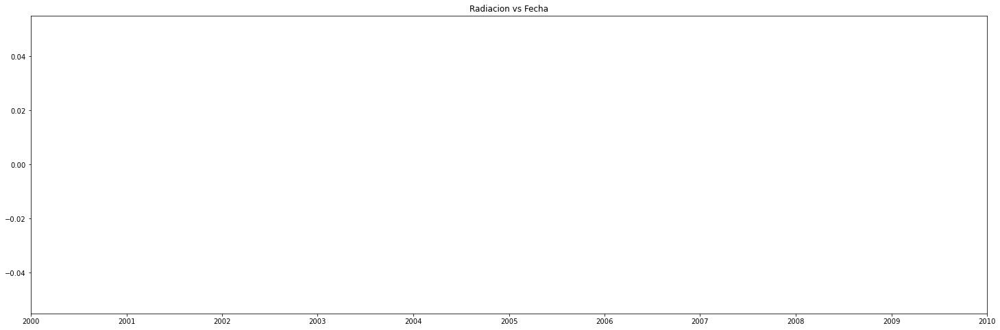

posgrados


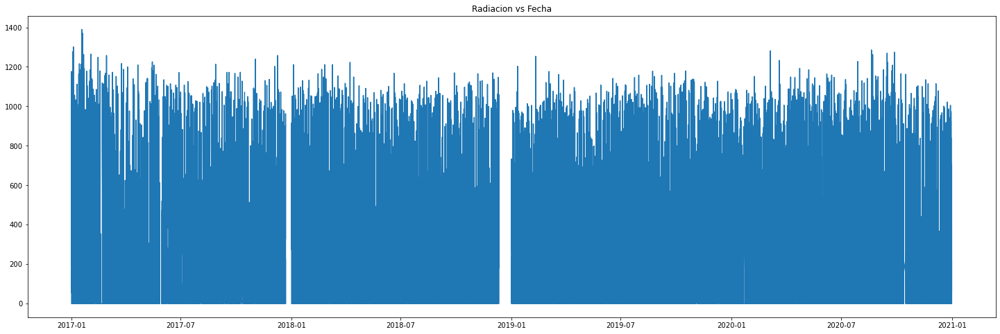

yarumos


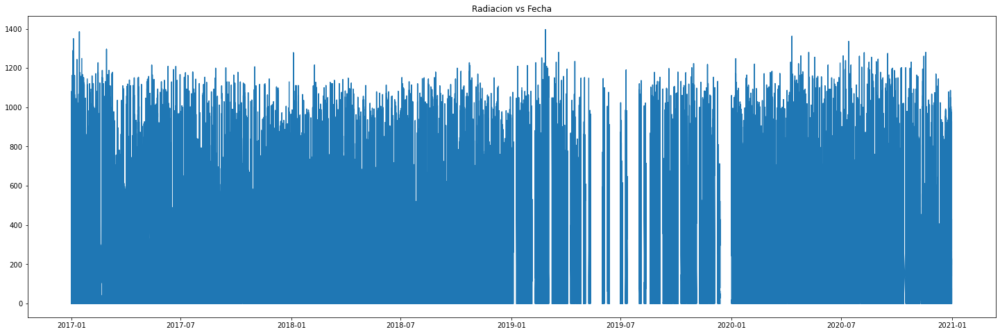

In [36]:
for i in datasets:   
    
    plt.figure(figsize=(25,8))
    print(i.Estacion[0])
    plt.plot(i.Fecha, i["Radiacion"])  
    plt.title("Radiacion vs Fecha")    
    plt.show()

Estacion alcazares


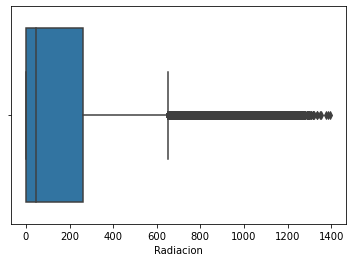

Estacion aranjuez


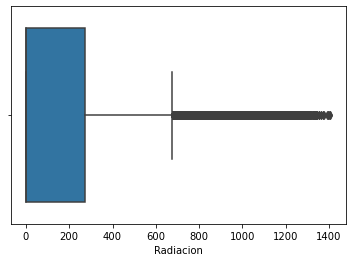

Estacion bosques_del_norte


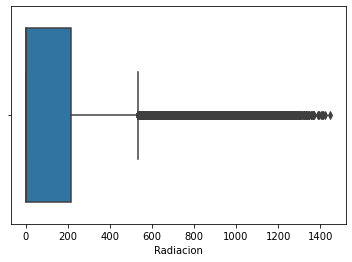

Estacion chec_uribe


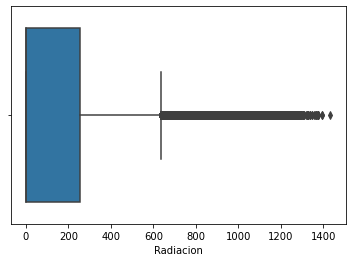

Estacion el_carmen


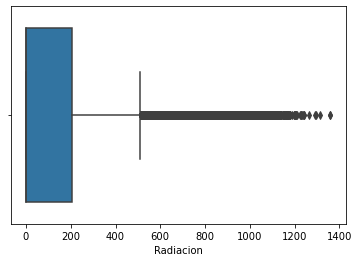

Estacion emas


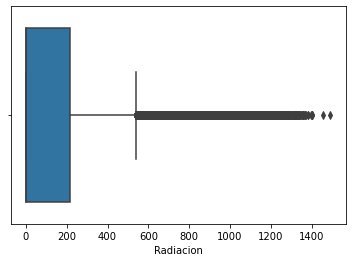

Estacion hospital_caldas


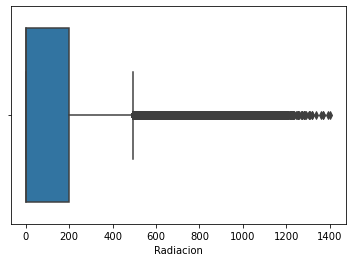

Estacion la_nubia


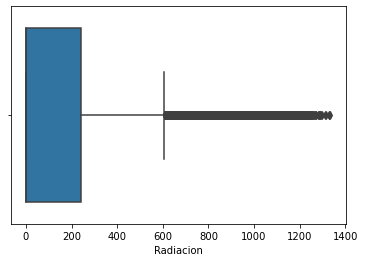

Estacion la_palma


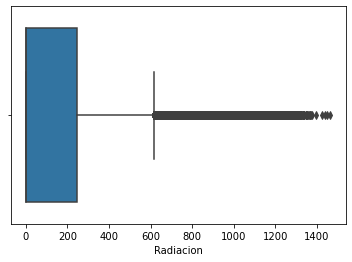

Estacion milan


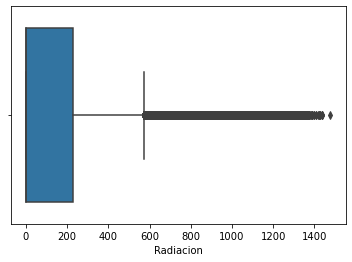

Estacion obs_vulcanologico


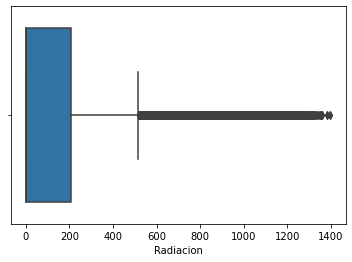

Estacion palogrande


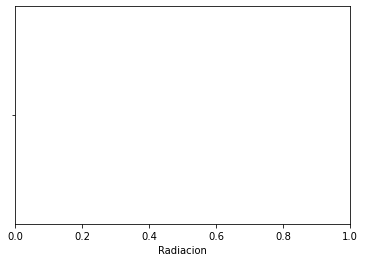

Estacion posgrados


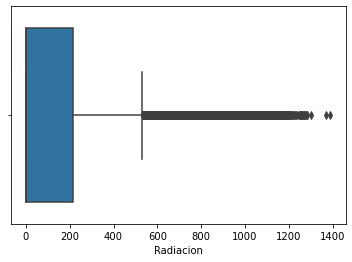

Estacion yarumos


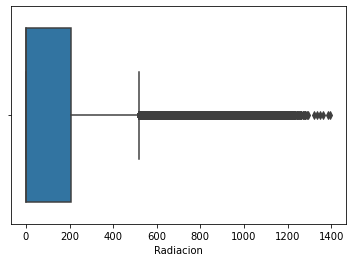

In [37]:
for i in datasets:
    print("Estacion", i.Estacion[0]) 
    sns.boxplot(x ='Radiacion', data = i) 
    plt.show() 
    

## Valores nulls

In [32]:
for i in datasets:
    print("Estacion",i.Estacion[0], "\n")   
    print(i.isnull().sum()) 
    print("\n")    

Estacion alcazares 

Fecha                     0
Hora                      0
Temperatura           32620
Velocidad             32618
Direccion             32621
Presion               25738
Humedad               32623
Precipitacion         25732
Radiacion             32614
Evapotranspiracion    25735
Precipitacion_Real    25732
Evapo_real            25735
Estacion                  0
dtype: int64


Estacion aranjuez 

Fecha                     0
Hora                      0
Temperatura           64567
Velocidad             64552
Direccion             64573
Presion               64567
Humedad               64568
Precipitacion         64552
Radiacion             64553
Evapotranspiracion    64552
Precipitacion_Real    64585
Evapo_real            64552
Estacion                  0
dtype: int64


Estacion bosques_del_norte 

Fecha                     0
Hora                      0
Temperatura           20712
Velocidad             17294
Direccion             17300
Presion               23024
Hume

In [ ]:
#datasets = [alcazares, aranjuez, bosques_del_norte, chec_uribe, el_carmen, emas,hospital_caldas, la_nubia,la_palma, milan, obs_vulcanologico, palogrande,posgrados,yarumos]

In [43]:
alcazares = alcazares.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True)  
aranjuez = aranjuez.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True)  
bosques_del_norte = bosques_del_norte.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True)  
chec_uribe = chec_uribe.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True)  
el_carmen = el_carmen.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True)  
emas = emas.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True)  
hospital_caldas = hospital_caldas.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True)
la_nubia = la_nubia.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True)
la_palma = la_palma.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True) 
milan = milan.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True)  
obs_vulcanologico = obs_vulcanologico.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True)  
palogrande = palogrande.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True)  
posgrados = aranjuez.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True)  
yarumos = yarumos.sort_values(by=["Fecha","Hora"], ascending=[True,True]).reset_index(drop=True)   

In [45]:
datasets = [alcazares, aranjuez, bosques_del_norte, chec_uribe, el_carmen, emas,hospital_caldas, la_nubia,la_palma, milan, obs_vulcanologico, palogrande,posgrados,yarumos]

In [46]:
data = pd.concat(datasets)

In [47]:
data.Estacion.unique() 

array(['alcazares', 'aranjuez', 'bosques_del_norte', 'chec_uribe',
       'el_carmen', 'emas', 'hospital_caldas', 'la_nubia', 'la_palma',
       'milan', 'obs_vulcanologico', 'palogrande', 'yarumos'],
      dtype=object)

In [48]:
data 

,Fecha,Hora,Temperatura,Velocidad,Direccion,Presion,Humedad,Precipitacion,Radiacion,Evapotranspiracion,Precipitacion_Real,Evapo_real,Estacion
0,2017-01-01,0:00:53,18.06,1.79,138.0,603.13,84.0,35.8,0.0,0.0,0.0,0.0,alcazares
1,2017-01-01,0:06:00,18.06,2.24,138.0,603.16,84.0,35.8,0.0,0.0,0.0,0.0,alcazares
2,2017-01-01,0:11:05,18.06,0.89,138.0,603.16,84.0,35.8,0.0,0.0,0.0,0.0,alcazares
3,2017-01-01,0:16:10,18.00,0.00,138.0,603.06,85.0,35.8,0.0,0.0,0.0,0.0,alcazares
4,2017-01-01,0:21:14,17.89,1.79,138.0,603.00,85.0,35.8,0.0,0.0,0.0,0.0,alcazares
...,...,...,...,...,...,...,...,...,...,...,...,...,...
410496,2020-12-31,9:38:01,16.44,1.34,238.0,589.61,89.0,1.0,213.0,0.3,0.0,0.0,yarumos
410497,2020-12-31,9:42:22,16.39,0.45,298.0,589.59,88.0,1.0,301.0,0.3,0.0,0.0,yarumos
410498,2020-12-31,9:47:20,16.56,1.79,278.0,589.61,89.0,1.0,735.0,0.3,0.0,0.0,yarumos
410499,2020-12-31,9:52:23,16.72,0.89,252.0,589.56,89.0,1.0,272.0,0.3,0.0,0.0,yarumos


In [49]:
data.to_csv('C:/Users/pulzara/Documents/Universidad internacional de valencia/TFM/base de datos/SIMAC organizados/BD2/data.txt', sep = '|', index=False, header=True)